In [2]:
import os
import glob
import pandas as pd
import numpy as np
import csv
import importlib
import utils
importlib.reload(utils)
from utils import detect_delimiter, detect_header
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import pearsonr, spearmanr

In [3]:
# Charger le fichier CSV 
factors = pd.read_csv('factors_for_visualization.csv')
factors.head()

/tmp/ipykernel_199/1660040414.py:2: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  factors = pd.read_csv('factors_for_visualization.csv')


,canton,codgeo,libgeo,acces_medecin_generaliste,acces_soins_infirmiers,nb_seveso,Nb_habitants,nb_creation_entreprises_industrie_23,nb_creation_entreprises_construction_23,nb_creation_entreprises_transport_hebergement_restauration_23,...,Extraction de pétrole brut,Transformation et conservation de la viande de boucherie,Fabrication de pesticides et d’autres produits agrochimiques,Fabrication de produits pharmaceutiques de base,Production d'électricité,Traitement et élimination des déchets non dangereux,Traitement et élimination des déchets dangereux,"Captage, traitement et distribution d'eau",Collecte et traitement des eaux usées,Élaboration et transformation de matières nucléaires
0,108.0,1001,L'Abergement-Clémenciat,1.8,121.5,0.0,832.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,101.0,1002,L'Abergement-de-Varey,2.0,109.2,0.0,267.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,101.0,1004,Ambérieu-en-Bugey,2.9,208.5,0.0,14854.0,7.0,17.0,61.0,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,122.0,1005,Ambérieux-en-Dombes,3.9,145.8,0.0,1897.0,1.0,2.0,4.0,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0
4,104.0,1006,Ambléon,0.8,47.0,0.0,113.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


In [4]:
## normaliser chaque colonne
for col in factors.columns:
    print(col)


canton
codgeo
libgeo
acces_medecin_generaliste
acces_soins_infirmiers
nb_seveso
Nb_habitants
nb_creation_entreprises_industrie_23
nb_creation_entreprises_construction_23
nb_creation_entreprises_transport_hebergement_restauration_23
nb_creation_entreprises_information_communication_23
nb_creation_entreprises_finance_asssurance_23
nb_creation_entreprises_immobilier
nb_creation_entreprises_scientifique_technique_admininistratif_23
nb_creation_entreprises_public_sante_enseignement_23
nb_creation_entreprises_autre_23
med_du_niveau_de_vie
nb_menages_fiscaux
taux_pauvrete
taux_pauvrete_proprietaire
taux_pauvrete_locataire
moy_salaire_net_horaire
moy_salaire_net_horaire_cadres_sup
moy_salaire_net_horaire_professions_intermediaires
moy_salaire_net_horaire_employes
moy_salaire_femme_net_horaire
moy_salaire_homme_net_horaire
ips_lycees
nb_ctr_tri
nb_exploitations_agri_bio
nb_france_travail
card
chirdent
derm
gastro
gynec
inf
masskine
medg
opht
orl
pedia
pneumo
psychi
psycho
radio
sgf
part_pop_elo

In [5]:

#diviser par le nb d'habitants les indicateurs suivants :
# colonnes à normaliser par le nombre d'habitants
colonnes_a_normaliser = [
    "nb_menages_fiscaux",
    "nb_ctr_tri",
    "nb_exploitations_agri_bio",
    "nb_france_travail",
    "card",
    "chirdent",
    "derm",
    "gastro",
    "gynec",
    "inf",
    "masskine",
    "medg",
    "opht",
    "orl",
    "pedia",
    "pneumo",
    "psychi",
    "psycho",
    "radio",
    "sgf",
    "Complexe sportif",
    "Piscine",
    "nb_seveso",
    "nb_creation_entreprises_industrie_23",
    "nb_creation_entreprises_construction_23",
    "nb_creation_entreprises_transport_hebergement_restauration_23",
    "nb_creation_entreprises_information_communication_23",
    "nb_creation_entreprises_finance_asssurance_23",
    "nb_creation_entreprises_immobilier",
    "nb_creation_entreprises_scientifique_technique_admininistratif_23",
    "nb_creation_entreprises_public_sante_enseignement_23",
    "nb_creation_entreprises_autre_23",
    "Culture de plantes à épices, aromatiques, médicinales et pharmaceutiques",
    "Élevage de vaches laitières",
    "Élevage de porcins",
    "Élevage de volailles",
    "Extraction de pétrole brut",
    "Transformation et conservation de la viande de boucherie",
    "Fabrication de pesticides et d’autres produits agrochimiques",
    "Fabrication de produits pharmaceutiques de base",
    "Production d'électricité",
    "Traitement et élimination des déchets non dangereux",
    "Traitement et élimination des déchets dangereux",
    "Captage, traitement et distribution d'eau",
    "Collecte et traitement des eaux usées",
    "Élaboration et transformation de matières nucléaires"
]

# Division des colonnes par Nb_habitants
for col in colonnes_a_normaliser:
    if col in factors.columns:
        factors[col] = factors[col] / factors["Nb_habitants"]
factors.head()

,canton,codgeo,libgeo,acces_medecin_generaliste,acces_soins_infirmiers,nb_seveso,Nb_habitants,nb_creation_entreprises_industrie_23,nb_creation_entreprises_construction_23,nb_creation_entreprises_transport_hebergement_restauration_23,...,Extraction de pétrole brut,Transformation et conservation de la viande de boucherie,Fabrication de pesticides et d’autres produits agrochimiques,Fabrication de produits pharmaceutiques de base,Production d'électricité,Traitement et élimination des déchets non dangereux,Traitement et élimination des déchets dangereux,"Captage, traitement et distribution d'eau",Collecte et traitement des eaux usées,Élaboration et transformation de matières nucléaires
0,108.0,1001,L'Abergement-Clémenciat,1.8,121.5,0.0,832.0,0.000000,0.002404,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.001202,0.0
1,101.0,1002,L'Abergement-de-Varey,2.0,109.2,0.0,267.0,0.000000,0.000000,0.003745,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.003745,0.000000,0.0
2,101.0,1004,Ambérieu-en-Bugey,2.9,208.5,0.0,14854.0,0.000471,0.001144,0.004107,...,0.0,0.000135,0.0,0.0,0.000000,0.0,0.0,0.000067,0.000067,0.0
3,122.0,1005,Ambérieux-en-Dombes,3.9,145.8,0.0,1897.0,0.000527,0.001054,0.002109,...,0.0,0.000000,0.0,0.0,0.001054,0.0,0.0,0.000000,0.000527,0.0
4,104.0,1006,Ambléon,0.8,47.0,0.0,113.0,0.008850,0.000000,0.000000,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.008850,0.008850,0.0


In [6]:
colonnes_pas_a_normaliser = set(factors.columns) - set(colonnes_a_normaliser)

print("Colonnes qui n'ont pas été normalisées :")
for col in sorted(colonnes_pas_a_normaliser):
    print(col)


Colonnes qui n'ont pas été normalisées :
Nb_habitants
Salaire_net_hor_Moy_Cadres_sup
Salaire_net_hor_moy_F_cadres_sup
Salaire_net_hor_moy_F_employés
Salaire_net_hor_moy_F_ouvriers
Salaire_net_hor_moy_F_prof_inter
Salaire_net_hor_moy_H_cadres_sup
Salaire_net_hor_moy_H_employés
Salaire_net_hor_moy_H_ouvriers
Salaire_net_hor_moy_H_prof_inter
Salaire_net_hor_moy_employés
Salaire_net_hor_moy_ouvriers
Salaire_net_hor_moy_prof_inter
Salaire_net_horaire_moyen
Salaire_net_horaire_moyen_18_à_25_ans
Salaire_net_horaire_moyen_26_à_50_ans
Salaire_net_horaire_moyen_F
Salaire_net_horaire_moyen_F_18_à_25_ans
Salaire_net_horaire_moyen_F_26_à_50_ans
Salaire_net_horaire_moyen_F_plus_de_50_ans
Salaire_net_horaire_moyen_H
Salaire_net_horaire_moyen_H_18_à_25_ans
Salaire_net_horaire_moyen_H_26_à_50_ans
Salaire_net_horaire_moyen_H_plus_de_50_ans
Salaire_net_horaire_moyen_plus_de_50_ans
acces_medecin_generaliste
acces_soins_infirmiers
canton
codgeo
ips_lycees
libgeo
med_du_niveau_de_vie
moy_salaire_femme_net_h

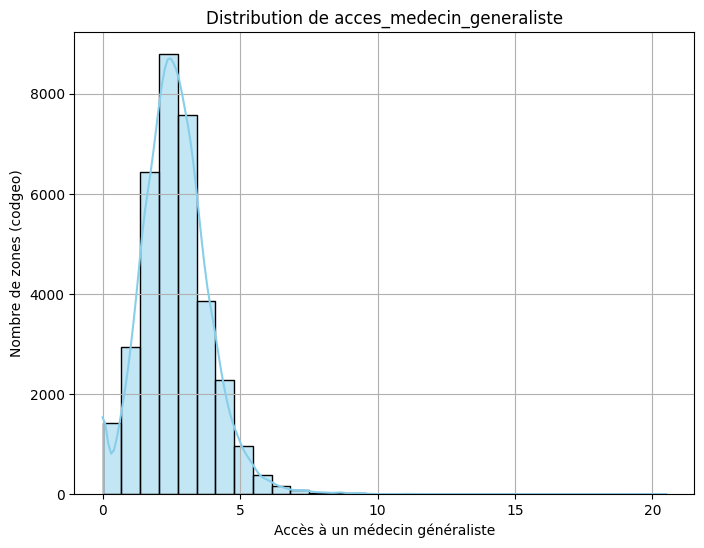

In [7]:
#exemple de la distribution d'un facteur

plt.figure(figsize=(8, 6))
sns.histplot(factors['acces_medecin_generaliste'], kde=True, bins=30, color='skyblue')

plt.title('Distribution de acces_medecin_generaliste')
plt.xlabel('Accès à un médecin généraliste')
plt.ylabel('Nombre de zones (codgeo)')
plt.grid(True)
plt.show()


In [6]:
colonnes_non_numeriques = factors.select_dtypes(exclude='number').columns

print("Colonnes non numériques :")
for col in colonnes_non_numeriques:
    print(f"- {col}")


Colonnes non numériques :
- canton
- codgeo
- libgeo


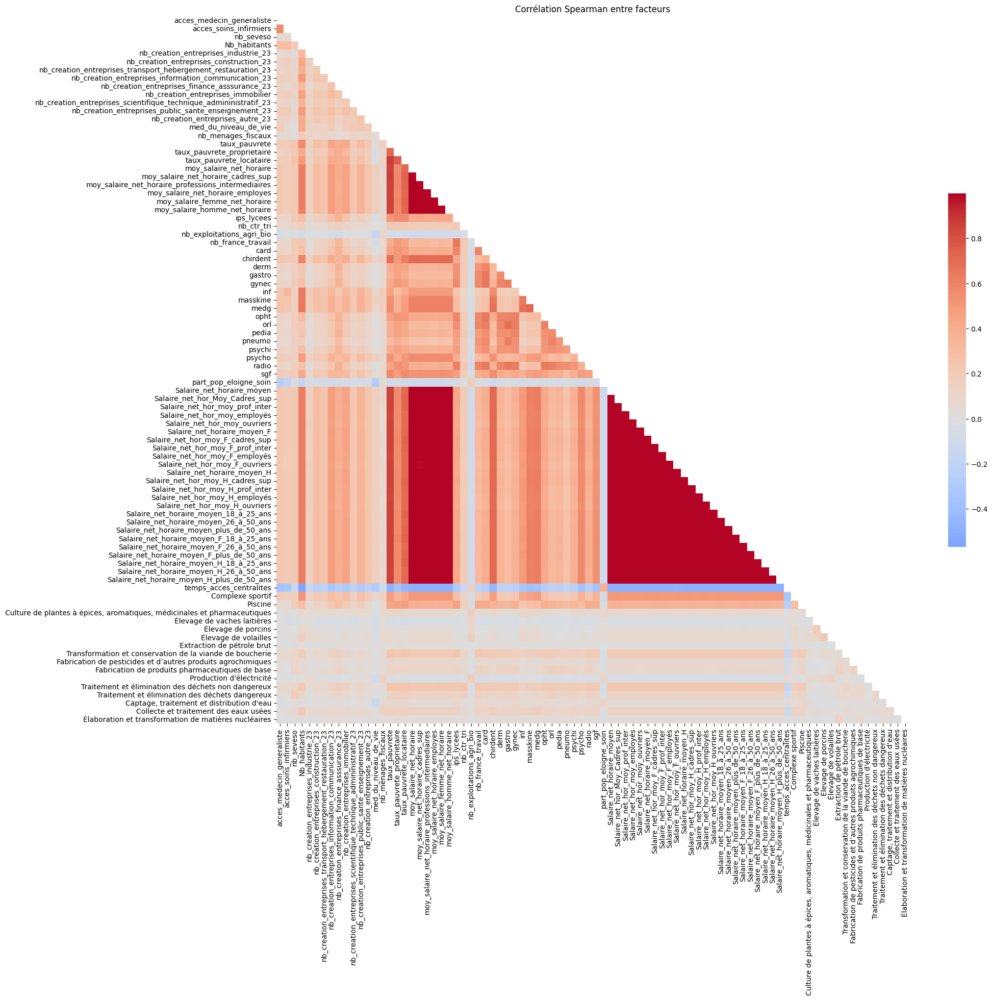

In [8]:
# Suppression des colonnes non numériques
factors_corr = factors.drop(columns=['codgeo', 'libgeo', 'canton'])

# Calcul de la corrélation de Spearman
correlation_matrix = factors_corr.corr(method='spearman')

# Création d'un masque pour cacher la moitié supérieure + diagonale
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Affichage de la heatmap triangulaire inférieure sans annotations
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélation Spearman entre facteurs')
plt.show()


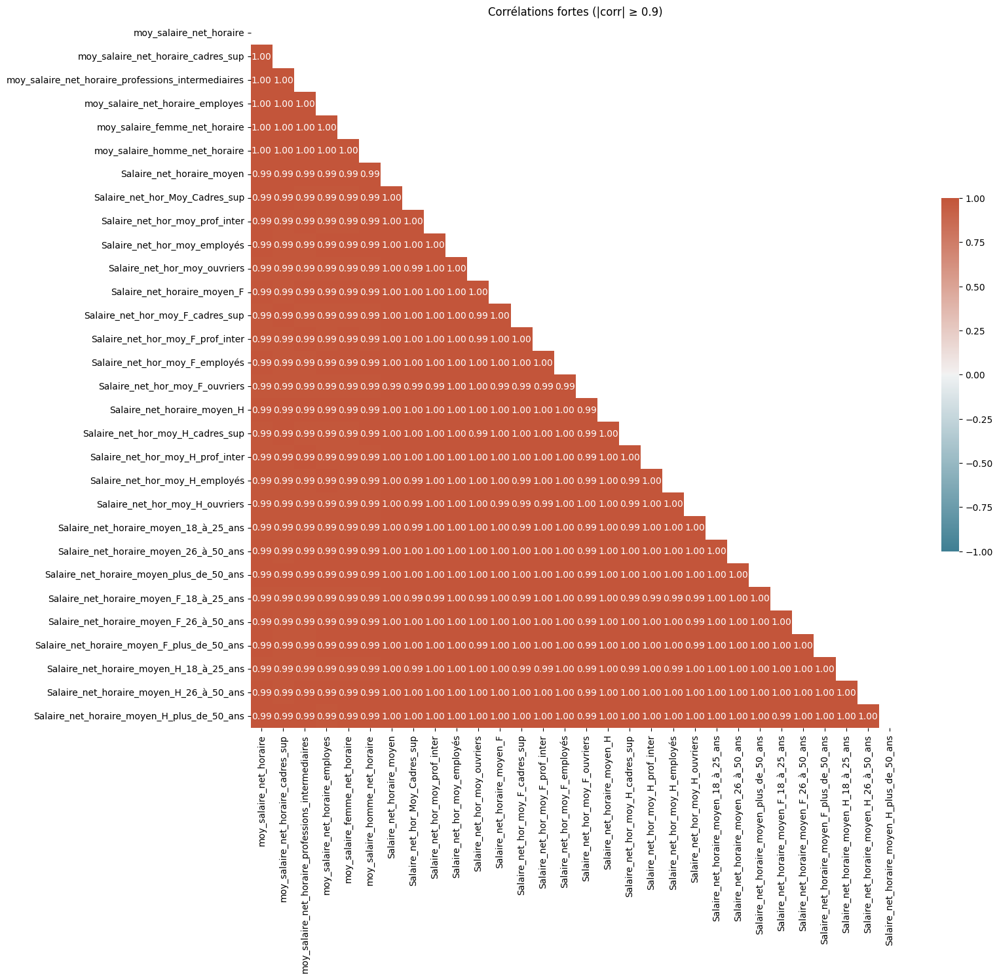

Colonnes impliquées dans des corrélations fortes (|corr| ≥ 0.9 et < 1.0) :
moy_salaire_net_horaire
moy_salaire_net_horaire_cadres_sup
moy_salaire_net_horaire_professions_intermediaires
moy_salaire_net_horaire_employes
moy_salaire_femme_net_horaire
moy_salaire_homme_net_horaire
Salaire_net_horaire_moyen
Salaire_net_hor_Moy_Cadres_sup
Salaire_net_hor_moy_prof_inter
Salaire_net_hor_moy_employés
Salaire_net_hor_moy_ouvriers
Salaire_net_horaire_moyen_F
Salaire_net_hor_moy_F_cadres_sup
Salaire_net_hor_moy_F_prof_inter
Salaire_net_hor_moy_F_employés
Salaire_net_hor_moy_F_ouvriers
Salaire_net_horaire_moyen_H
Salaire_net_hor_moy_H_cadres_sup
Salaire_net_hor_moy_H_prof_inter
Salaire_net_hor_moy_H_employés
Salaire_net_hor_moy_H_ouvriers
Salaire_net_horaire_moyen_18_à_25_ans
Salaire_net_horaire_moyen_26_à_50_ans
Salaire_net_horaire_moyen_plus_de_50_ans
Salaire_net_horaire_moyen_F_18_à_25_ans
Salaire_net_horaire_moyen_F_26_à_50_ans
Salaire_net_horaire_moyen_F_plus_de_50_ans
Salaire_net_horaire_moye

In [9]:
# Filtrage : ne garder que les variables ayant au moins une corrélation forte
high_corr = (correlation_matrix.abs() >= 0.9) & (correlation_matrix.abs() < 1.0)
cols_to_keep = high_corr.any(axis=1)
filtered_corr = correlation_matrix.loc[cols_to_keep, cols_to_keep]

# Masque pour triangle supérieur + diagonale
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

# Palette de couleurs avec contraste
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# Affichage de la heatmap avec annotations
plt.figure(figsize=(16, 14))
ax = sns.heatmap(
    filtered_corr,
    mask=mask,
    cmap=cmap,
    center=0,
    vmin=-1,
    vmax=1,
    annot=True,
    fmt=".2f",
    cbar_kws={"shrink": .5}
)

# Mettre en rouge vif les cases avec corr = 1
for i in range(filtered_corr.shape[0]):
    for j in range(filtered_corr.shape[1]):
        if i > j and filtered_corr.iloc[i, j] == 1.0:
            ax.add_patch(plt.Rectangle((j, i), 1, 1, fill=True, color='red', ec='red'))

plt.title('Corrélations fortes (|corr| ≥ 0.9)')
plt.show()

# Colonnes impliquées dans au moins une corrélation forte
cols_to_keep = high_corr.any(axis=1)

# Liste des noms de colonnes sans doublons
strongly_correlated_columns = correlation_matrix.columns[cols_to_keep].tolist()

# Affichage
print("Colonnes impliquées dans des corrélations fortes (|corr| ≥ 0.9 et < 1.0) :")
for col in strongly_correlated_columns:
    print(col)



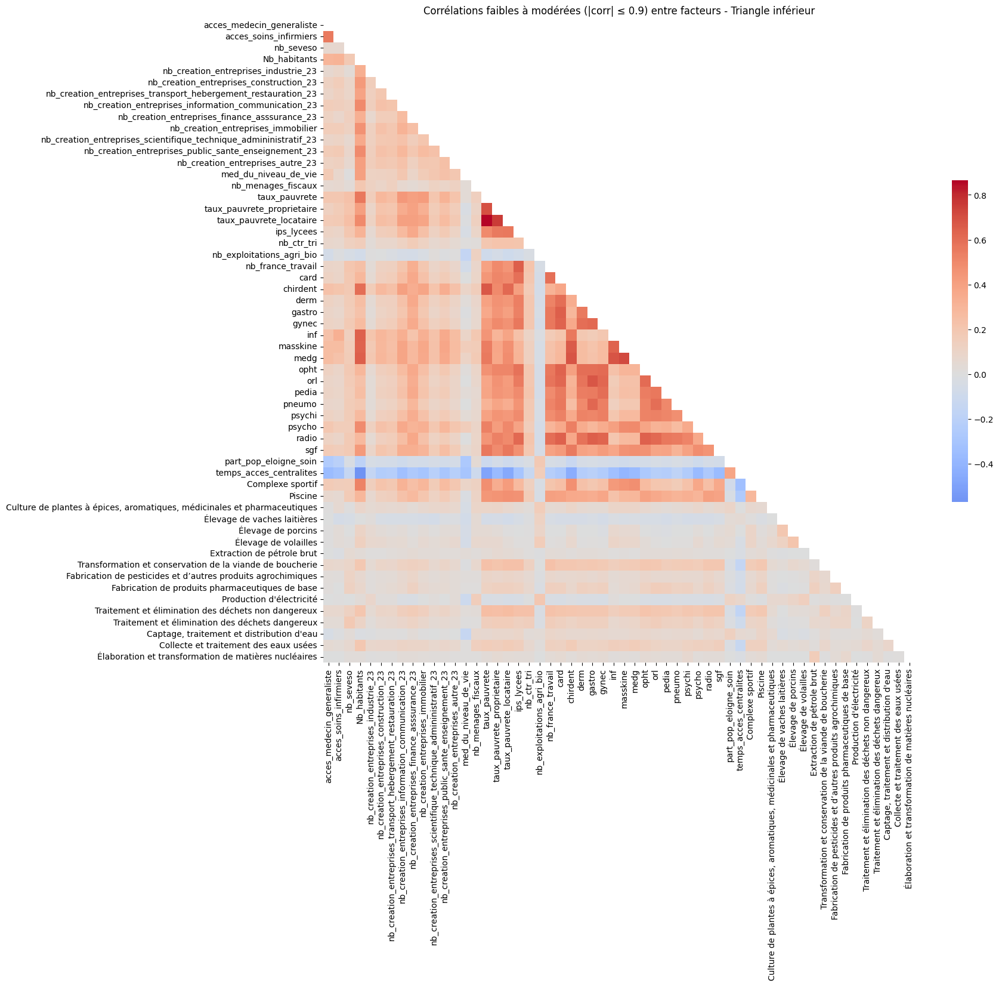

In [10]:


# Identifier les variables qui n'ont aucune corrélation forte (|corr| > 0.9)
strong_corr = (correlation_matrix.abs() > 0.9) & (correlation_matrix.abs() < 1.0)
cols_to_keep = ~strong_corr.any(axis=1)

# Sous-matrice avec uniquement les variables sans corrélations fortes
filtered_corr = correlation_matrix.loc[cols_to_keep, cols_to_keep]

# Masque pour triangle supérieur + diagonale
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

# Affichage de la heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(filtered_corr, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélations faibles à modérées (|corr| ≤ 0.9) entre facteurs - Triangle inférieur')
plt.show()


In [9]:
print(f"Dimensions du df avant suppression : {factors.shape}")

# Liste des colonnes à supprimer
cols_to_drop = [
    'moy_salaire_net_horaire_cadres_sup',
    'moy_salaire_net_horaire_professions_intermediaires',
    'moy_salaire_net_horaire_employes',
    'moy_salaire_femme_net_horaire',
    'moy_salaire_homme_net_horaire',
    'Salaire_net_horaire_moyen',
    'Salaire_net_hor_Moy_Cadres_sup',
    'Salaire_net_hor_moy_prof_inter',
    'Salaire_net_hor_moy_employés',
    'Salaire_net_hor_moy_ouvriers',
    'Salaire_net_horaire_moyen_F',
    'Salaire_net_hor_moy_F_cadres_sup',
    'Salaire_net_hor_moy_F_prof_inter',
    'Salaire_net_hor_moy_F_employés',
    'Salaire_net_hor_moy_F_ouvriers',
    'Salaire_net_horaire_moyen_H',
    'Salaire_net_hor_moy_H_cadres_sup',
    'Salaire_net_hor_moy_H_prof_inter',
    'Salaire_net_hor_moy_H_employés',
    'Salaire_net_hor_moy_H_ouvriers',
    'Salaire_net_horaire_moyen_18_à_25_ans',
    'Salaire_net_horaire_moyen_26_à_50_ans',
    'Salaire_net_horaire_moyen_plus_de_50_ans',
    'Salaire_net_horaire_moyen_F_18_à_25_ans',
    'Salaire_net_horaire_moyen_F_26_à_50_ans',
    'Salaire_net_horaire_moyen_F_plus_de_50_ans',
    'Salaire_net_horaire_moyen_H_18_à_25_ans',
    'Salaire_net_horaire_moyen_H_26_à_50_ans',
    'Salaire_net_horaire_moyen_H_plus_de_50_ans'
]

# Suppression des colonnes du df sauf 1
factors = factors.drop(columns=cols_to_drop)

# Vérification
print(f"Dimensions du df après suppression des colonnes trop correlées: {factors.shape}")


Dimensions du df avant suppression : (35003, 89)
Dimensions du df après suppression des colonnes trop correlées: (35003, 60)


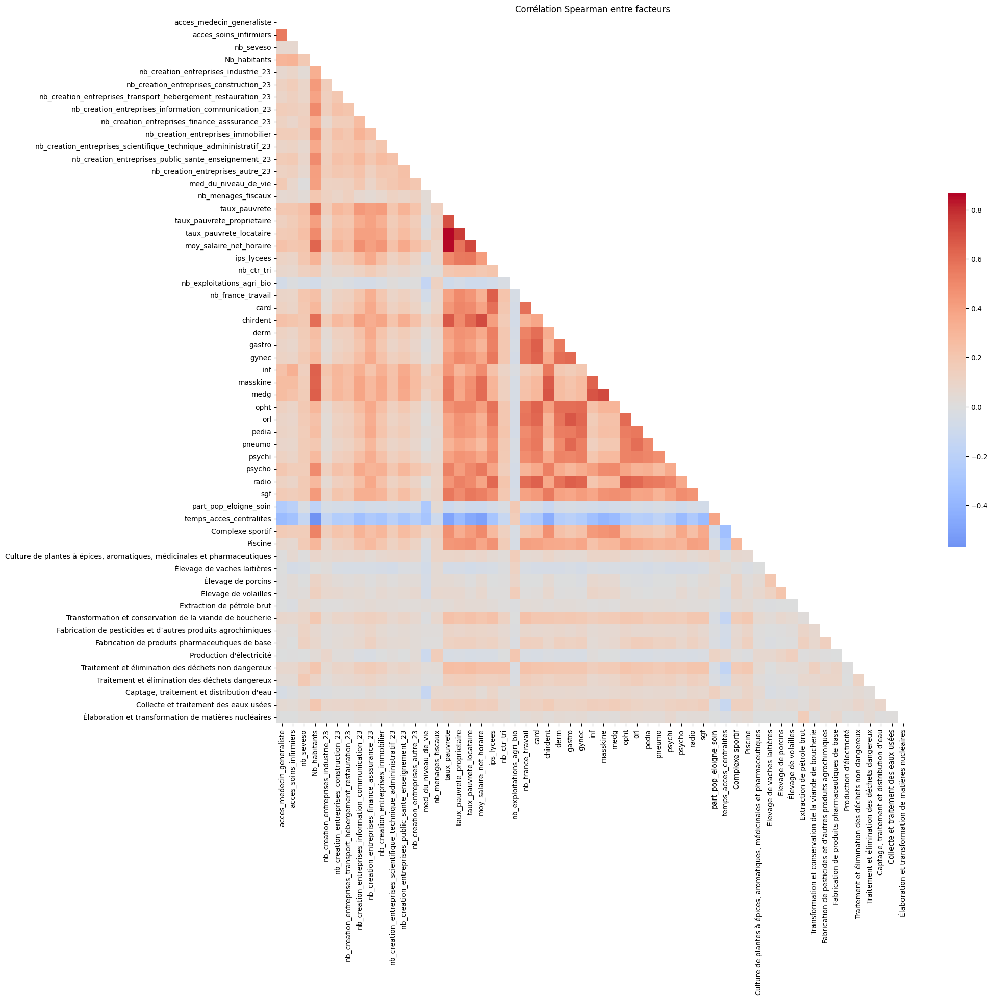

In [11]:
# Suppression des colonnes non numériques
factors_corr = factors.drop(columns=['codgeo', 'libgeo', 'canton'])

# Calcul de la corrélation de Spearman
correlation_matrix = factors_corr.corr(method='spearman')

# Création d'un masque pour cacher la moitié supérieure + diagonale
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Affichage de la heatmap triangulaire inférieure sans annotations
plt.figure(figsize=(20, 18))
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm', center=0, cbar_kws={"shrink": .5})
plt.title('Corrélation Spearman entre facteurs')
plt.show()


In [30]:
factors_to_plot = factors.columns.difference(['codgeo', 'libgeo','canton'])

In [28]:
def plot_scatter_with_trendline(factors, factor, degree=40, num_labels=10):
    plt.figure(figsize=(14, 6))

    # Convertir la colonne cible en numérique
    y = pd.to_numeric(factors[factor], errors='coerce')
    
    # Index numérique interne
    x_numeric = np.arange(len(factors))

    # Masque des lignes valides
    valid_mask = ~y.isna()
    x_valid = x_numeric[valid_mask]
    y_valid = y[valid_mask]
    codgeo_valid = factors['codgeo'][valid_mask].values

    # Scatter plot avec index numérique mais labels codgeo
    plt.scatter(x_valid, y_valid, color='skyblue', s=20)

    # Régression polynomiale
    if len(x_valid) > degree:
        z = np.polyfit(x_valid, y_valid, degree)
        p = np.poly1d(z)
        plt.plot(x_valid, p(x_valid), "r--", label=f"Tendance (deg {degree})")
        plt.legend()

    # Limiter le nombre de labels codgeo à afficher (lisibilité)
    if len(x_valid) > num_labels:
        step = len(x_valid) // num_labels
        tick_positions = x_valid[::step]
        tick_labels = codgeo_valid[::step]
    else:
        tick_positions = x_valid
        tick_labels = codgeo_valid

    plt.xticks(ticks=tick_positions, labels=tick_labels, rotation=90)

    plt.title(f'Scatter plot de "{factor}" par Codgeo')
    plt.xlabel('Codgeo')
    plt.ylabel(factor)
    plt.tight_layout()
    plt.show()


In [29]:
# Fonction pour ajuster les ticks de l'axe X
def adjust_xticks(factors):
    num_ticks = 10
    tick_positions = range(0, len(factors['codgeo'].unique()), len(factors['codgeo'].unique()) // num_ticks)
    tick_labels = factors['codgeo'].unique()[tick_positions]
    plt.xticks(ticks=tick_positions, labels=tick_labels, rotation=90)


In [30]:
# Normalisation des facteurs
scaler = MinMaxScaler()
factors_normalized = pd.DataFrame(scaler.fit_transform(factors[factors_to_plot]), columns=factors_to_plot)


In [31]:
non_numeric = factors[factors_to_plot].select_dtypes(exclude=[np.number]).columns
print("Colonnes non numériques :", list(non_numeric))


Colonnes non numériques : []


C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


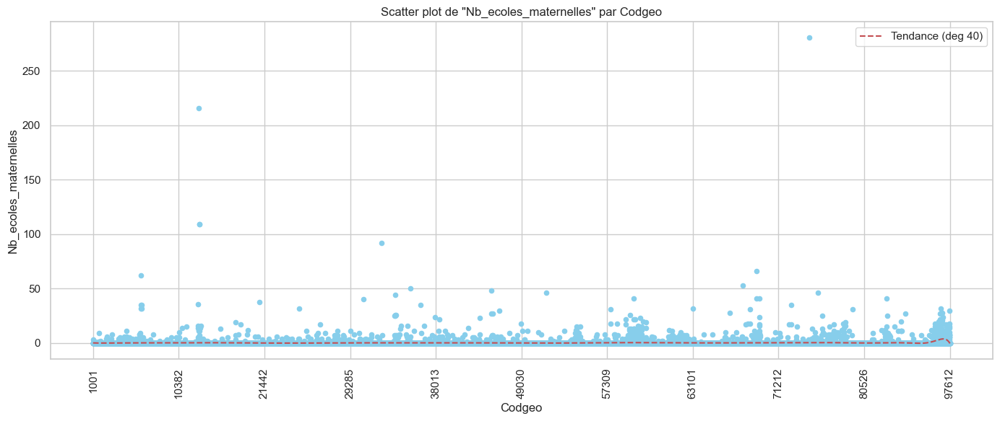

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


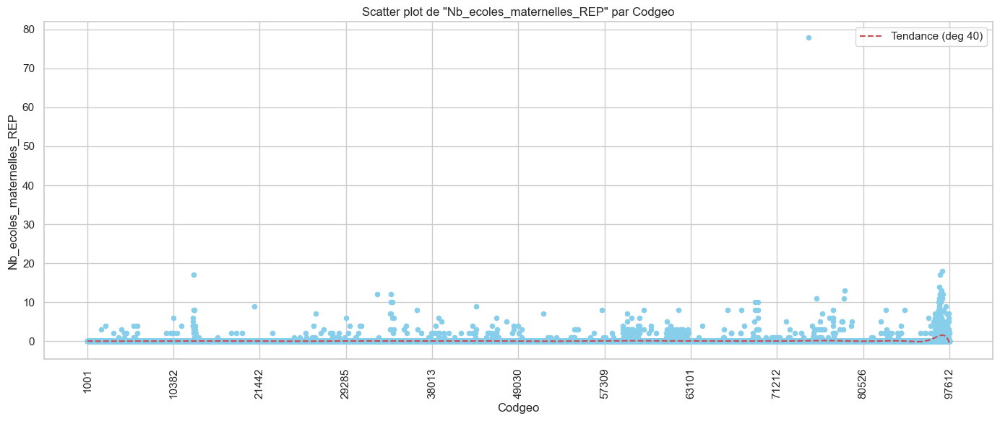

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


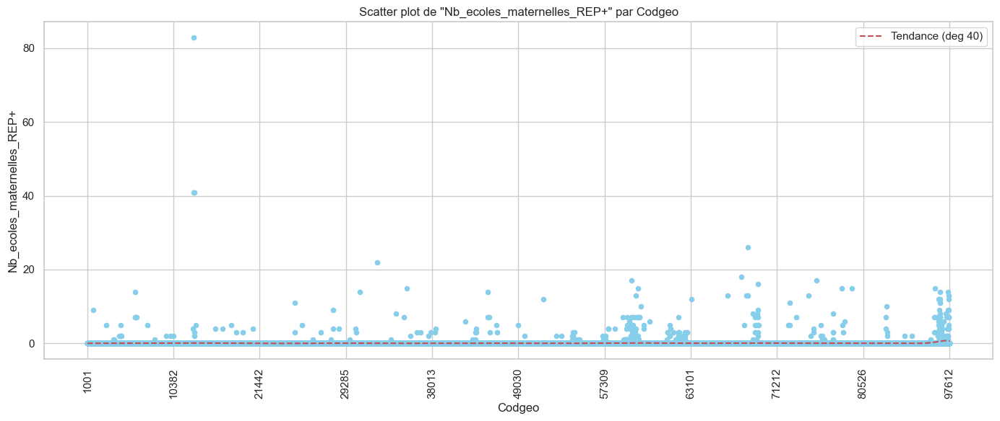

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


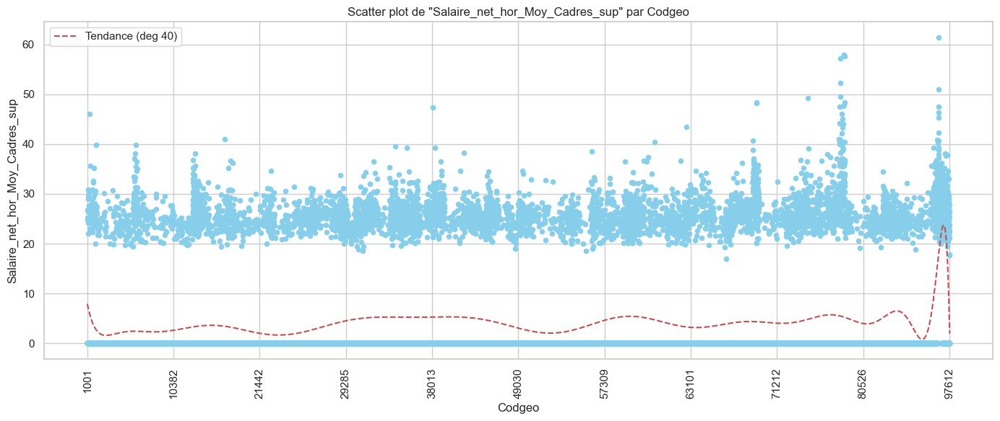

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


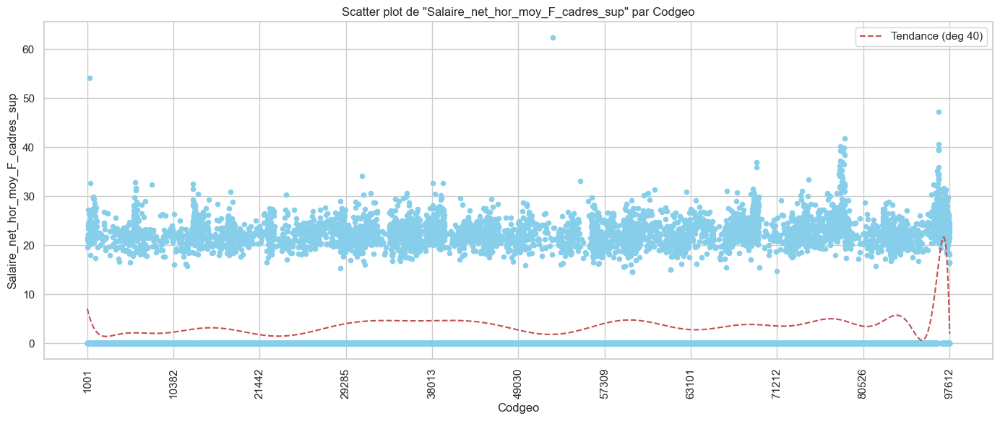

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


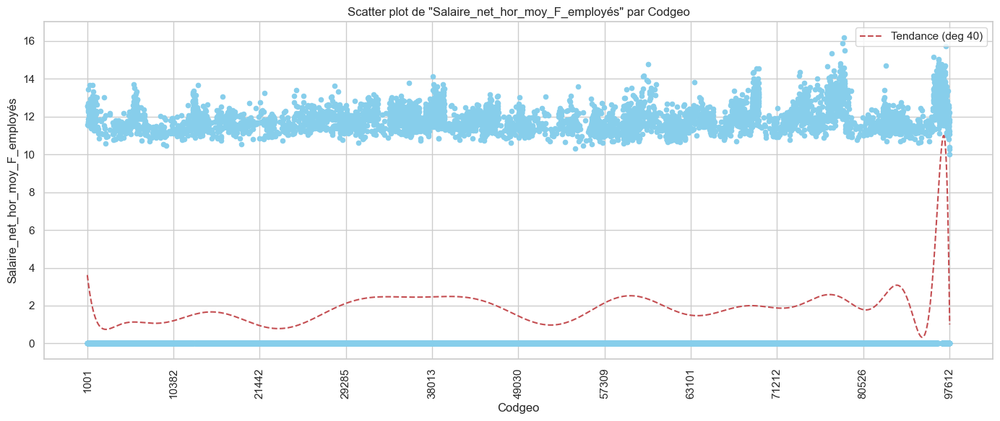

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


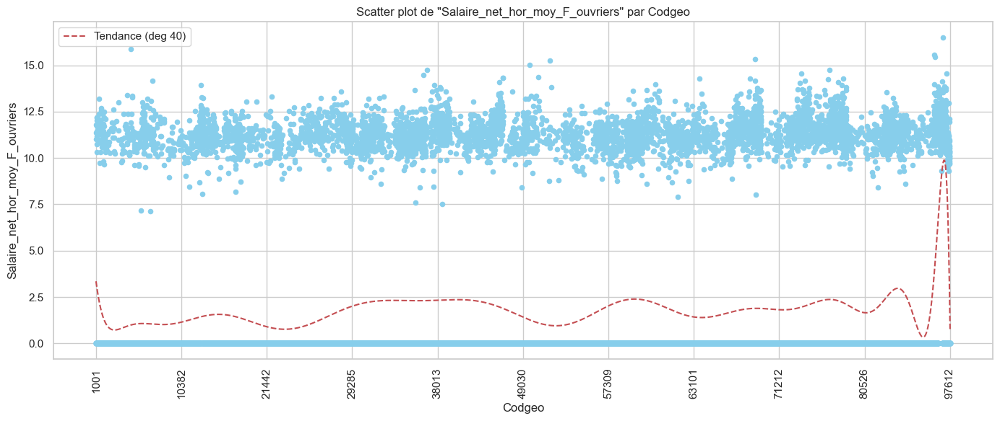

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


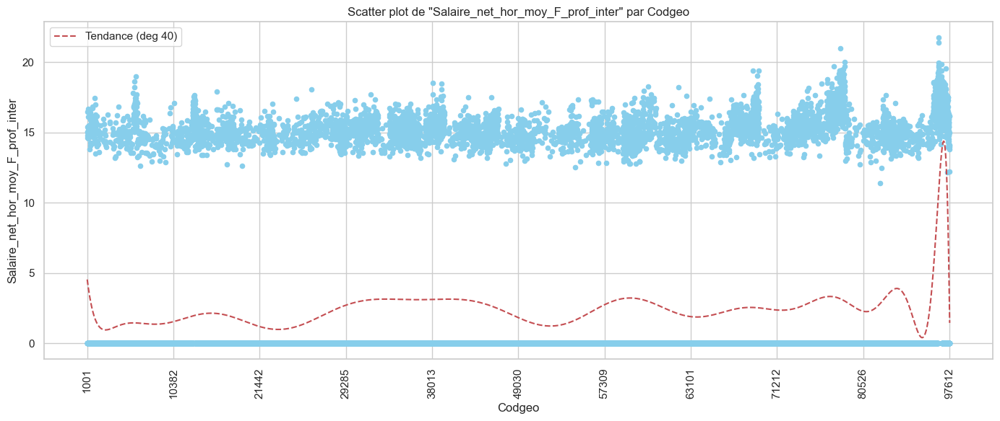

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


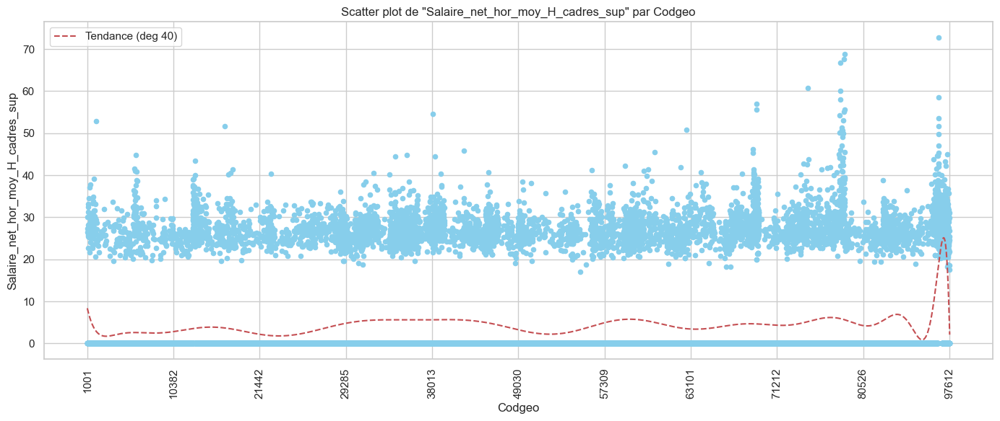

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


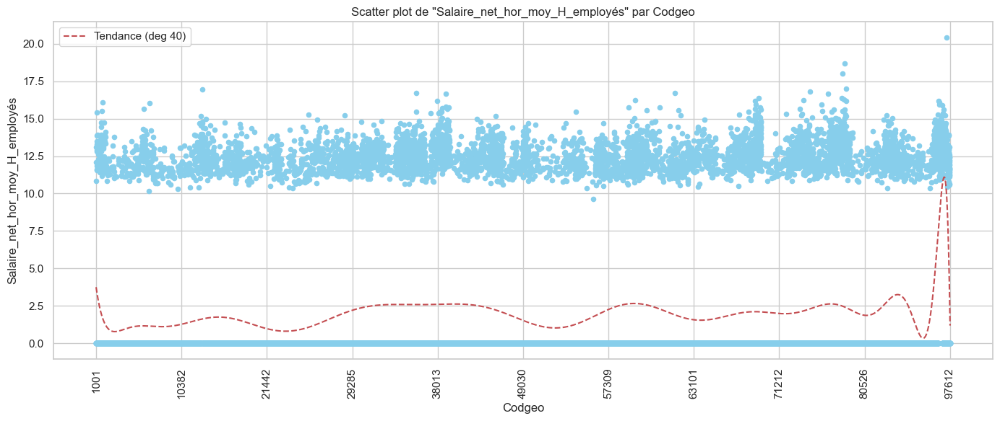

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


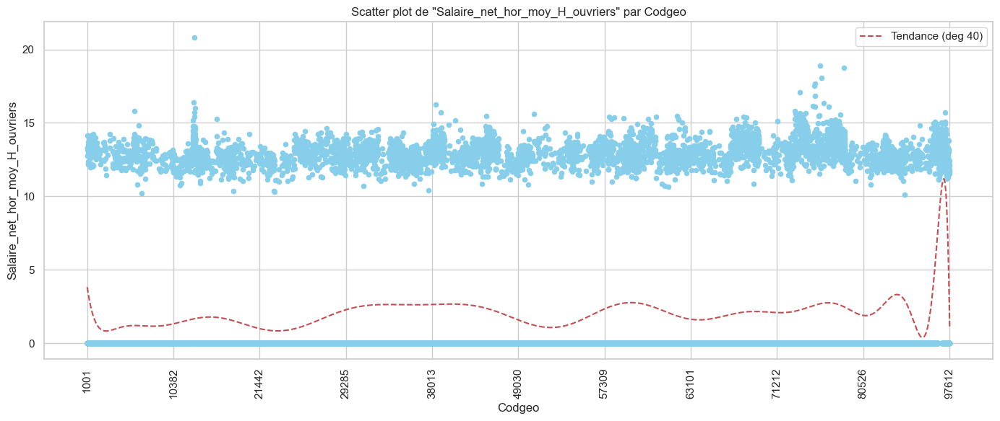

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


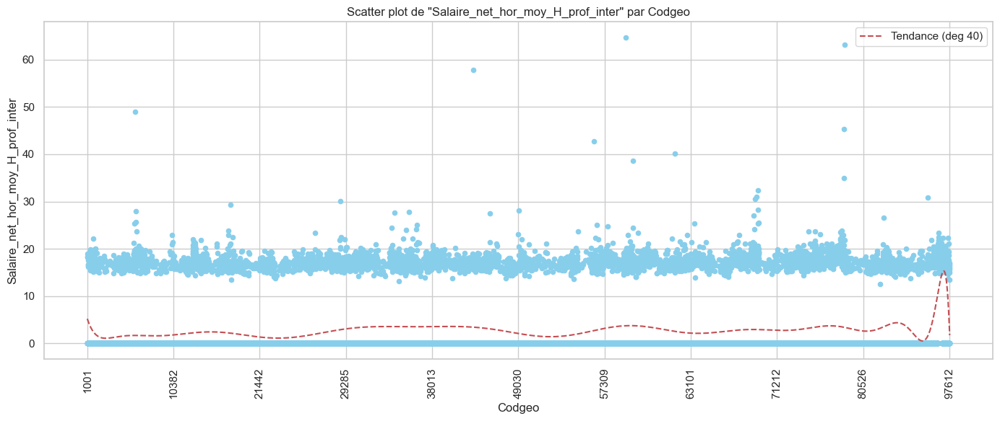

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


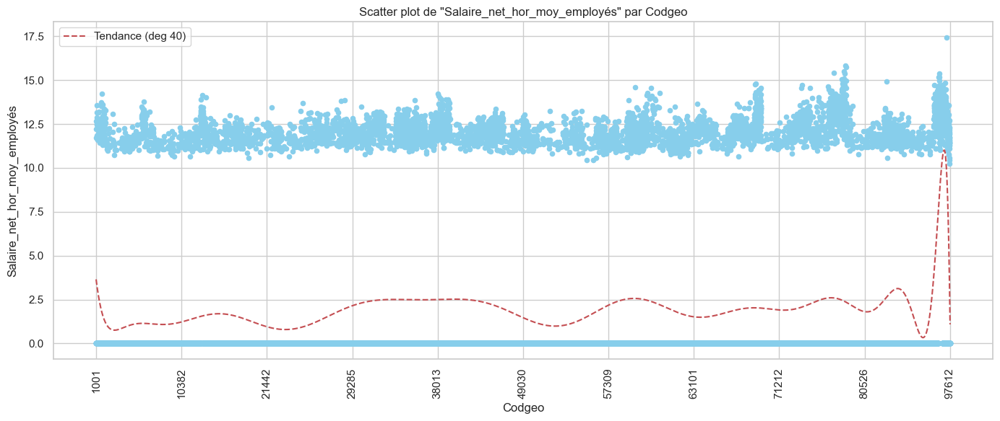

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


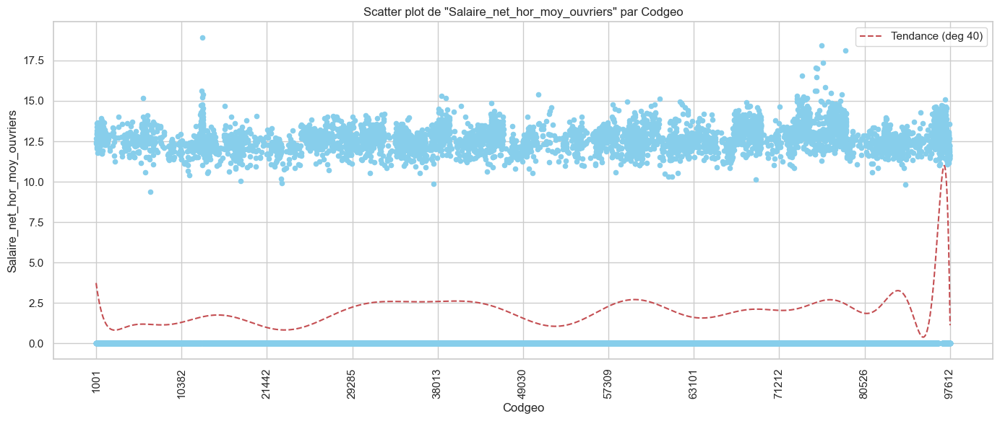

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


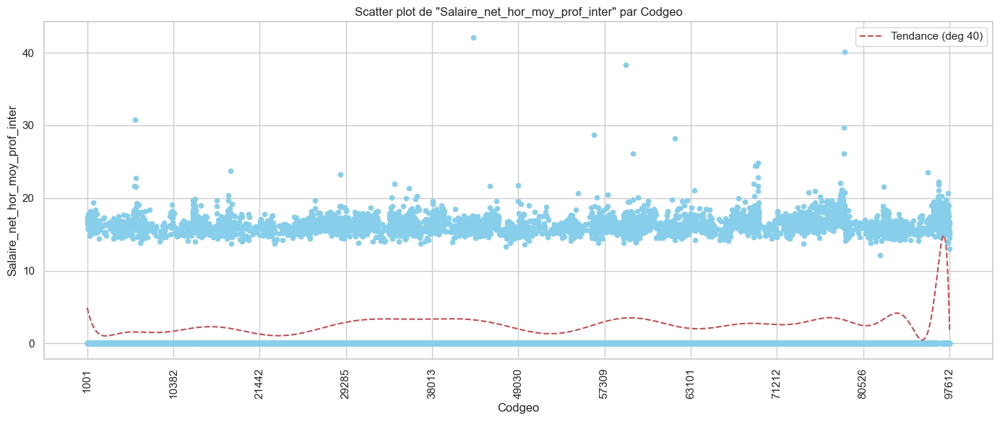

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


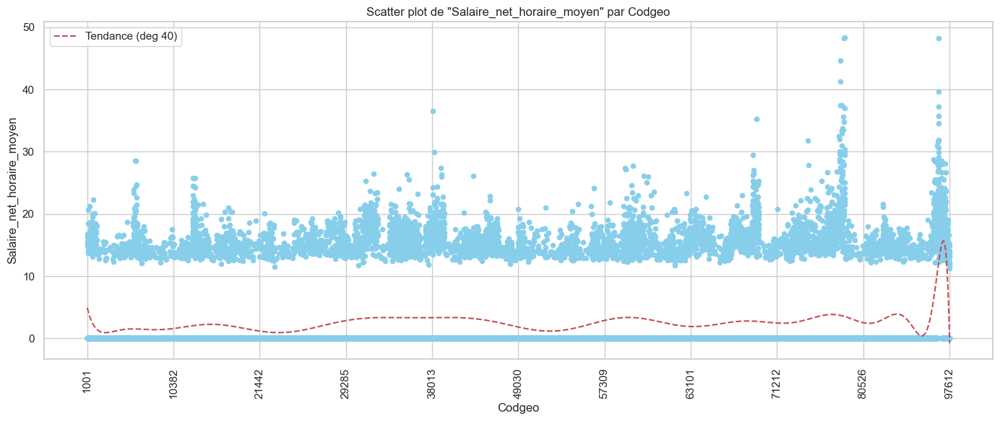

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


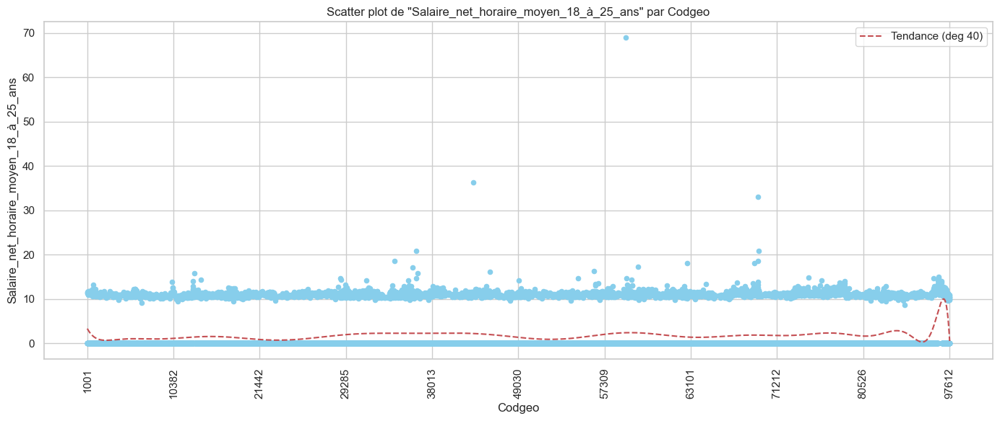

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


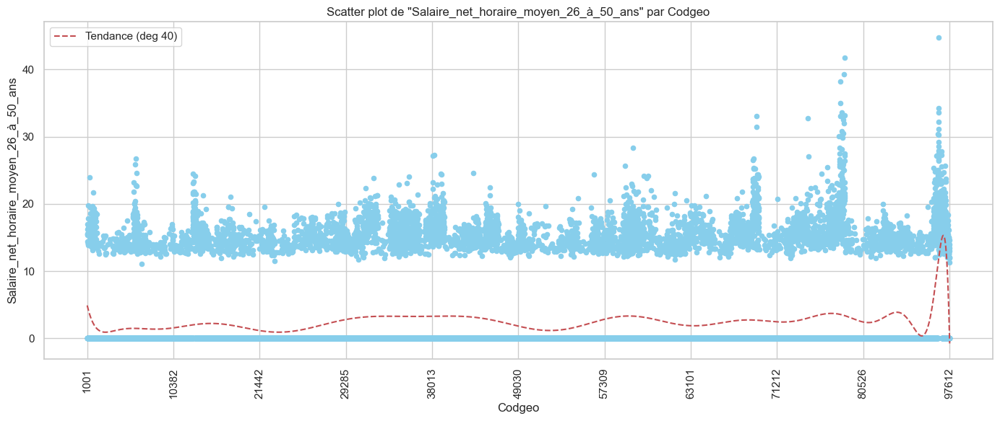

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


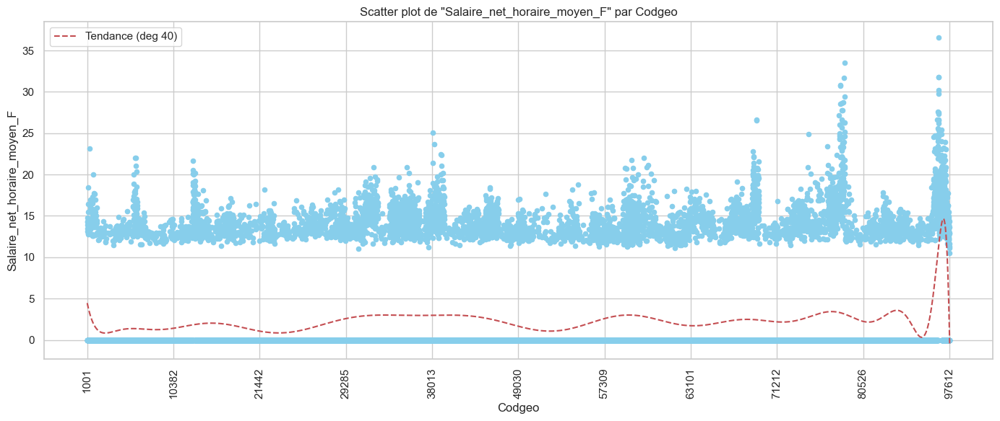

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


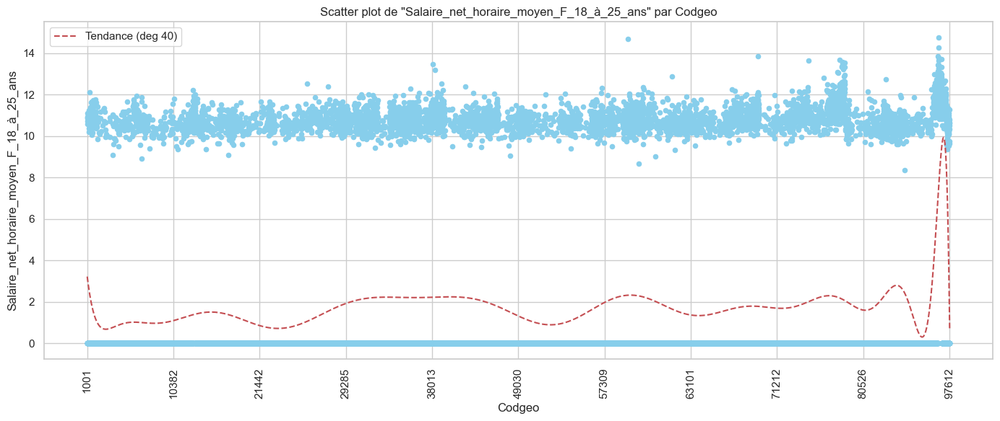

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


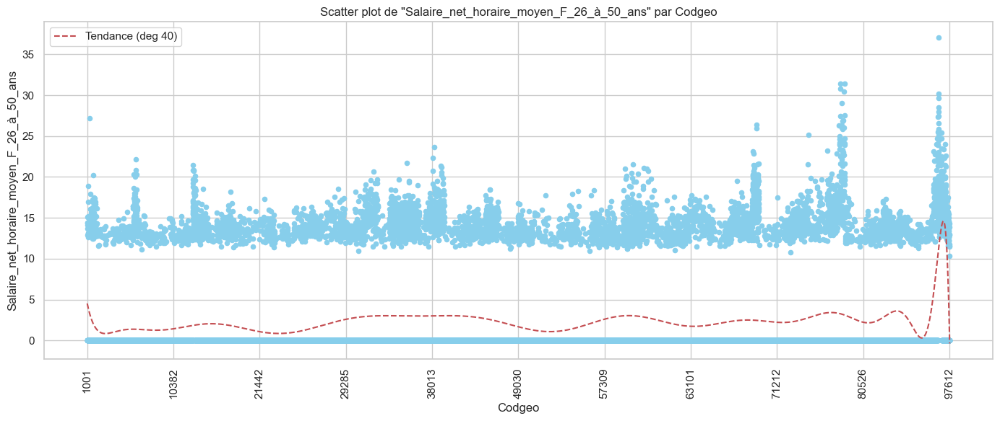

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


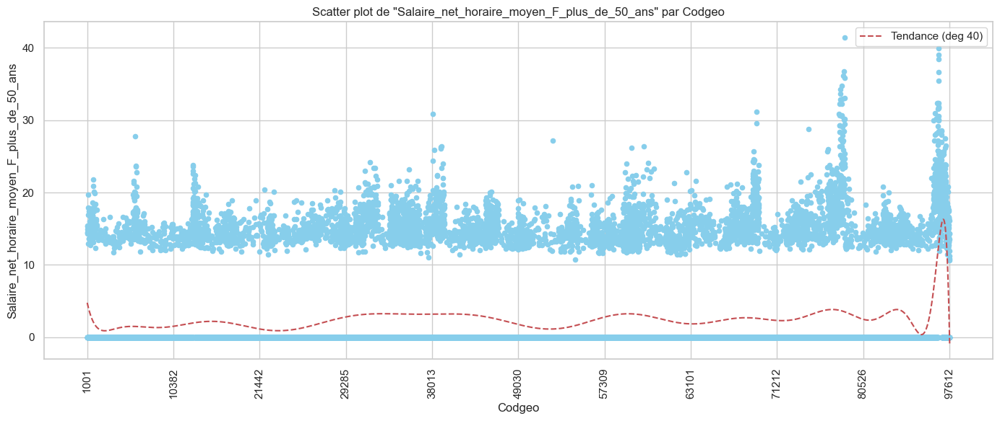

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


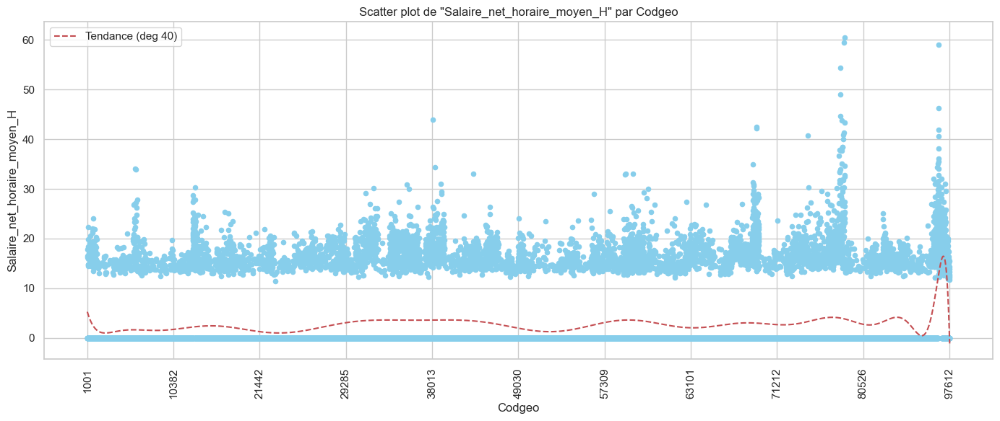

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


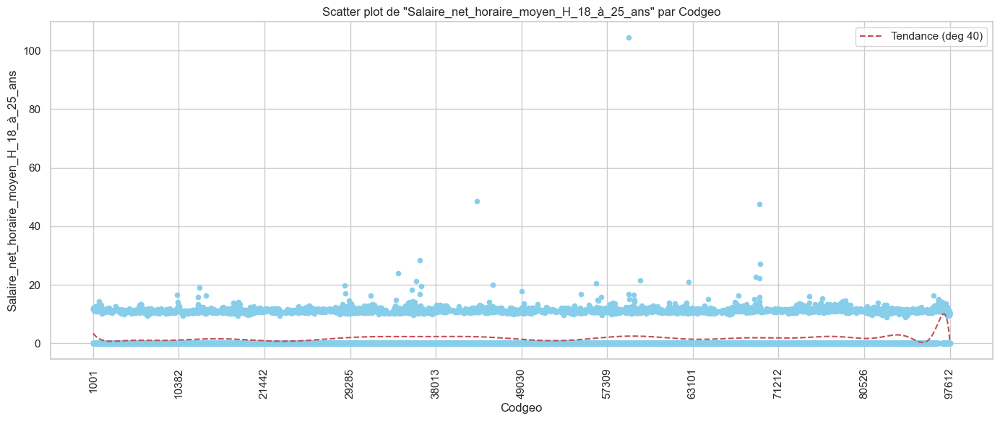

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


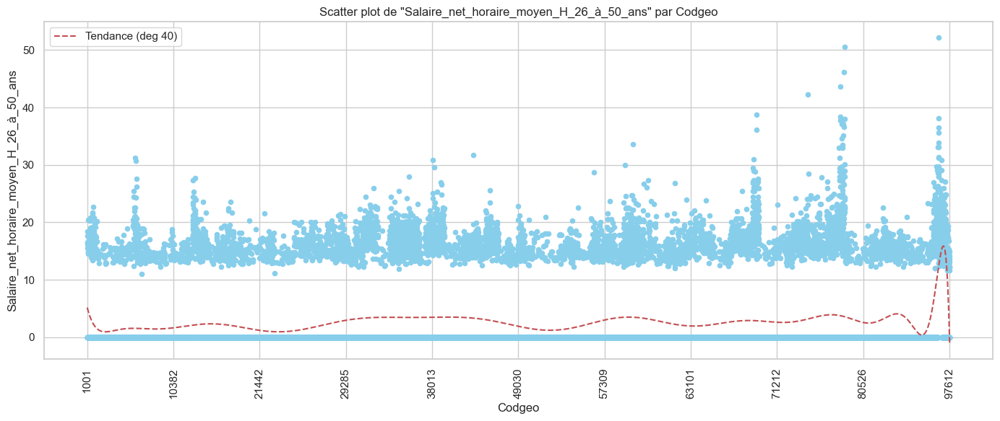

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


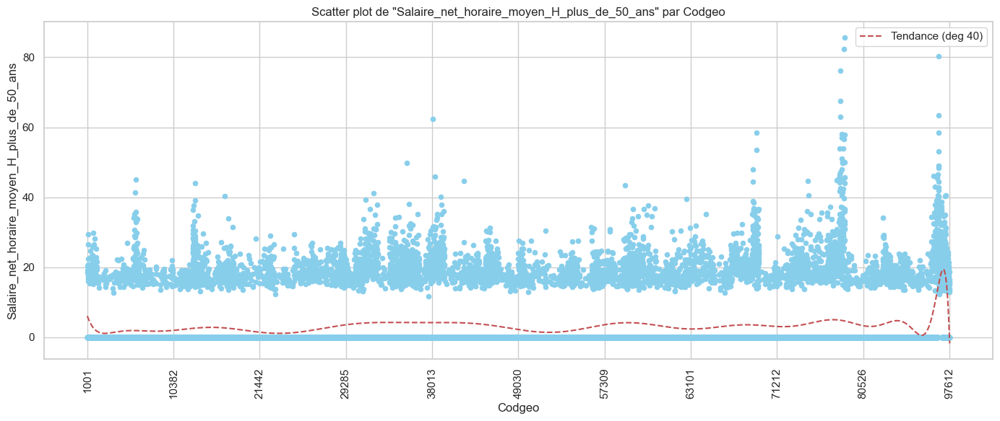

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


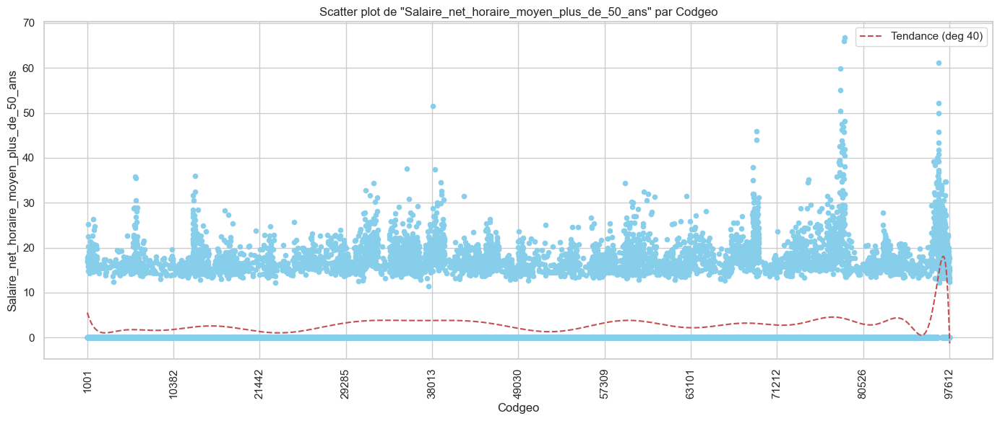

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


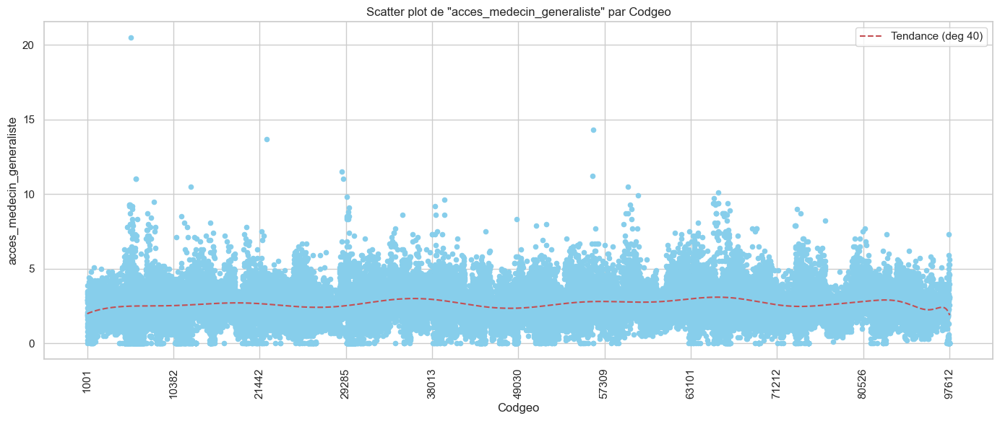

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


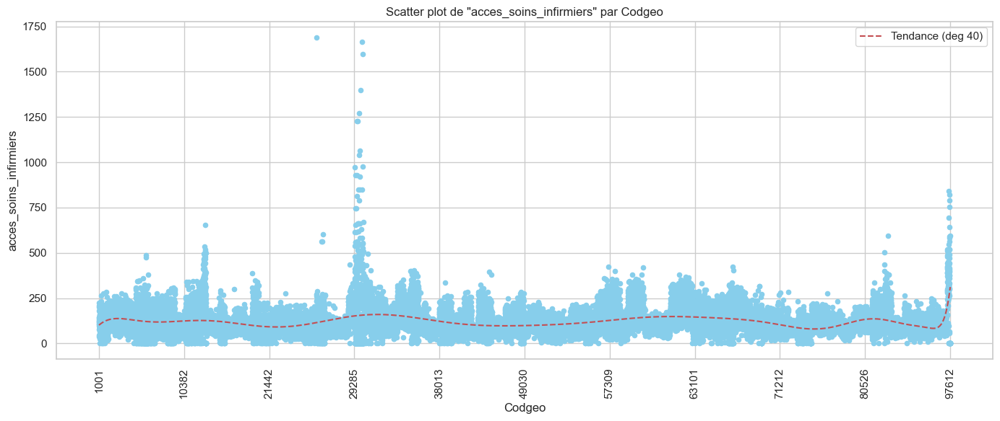

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


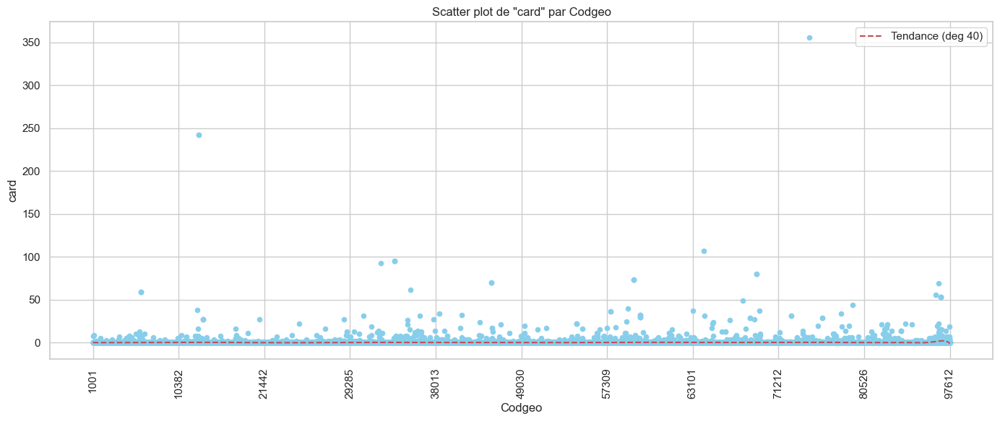

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


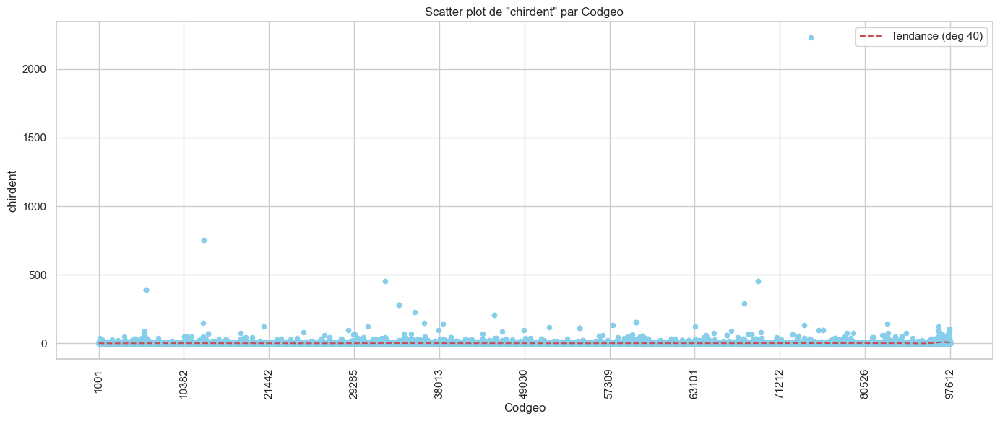

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


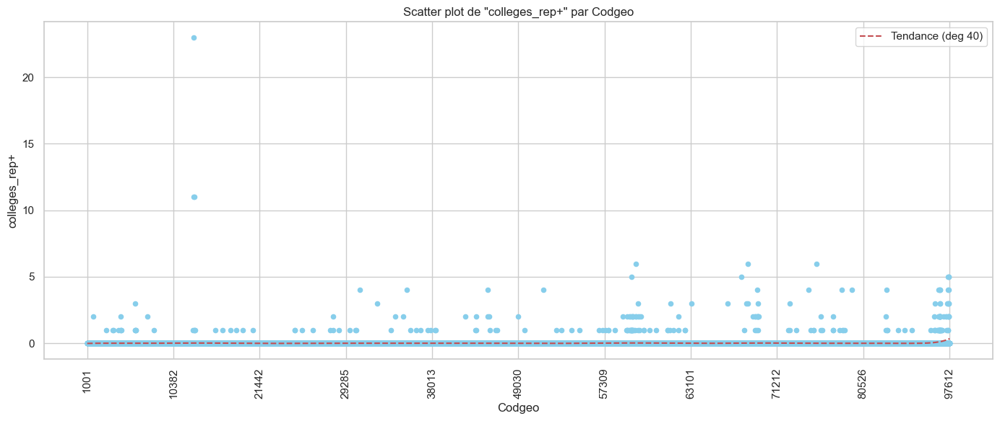

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


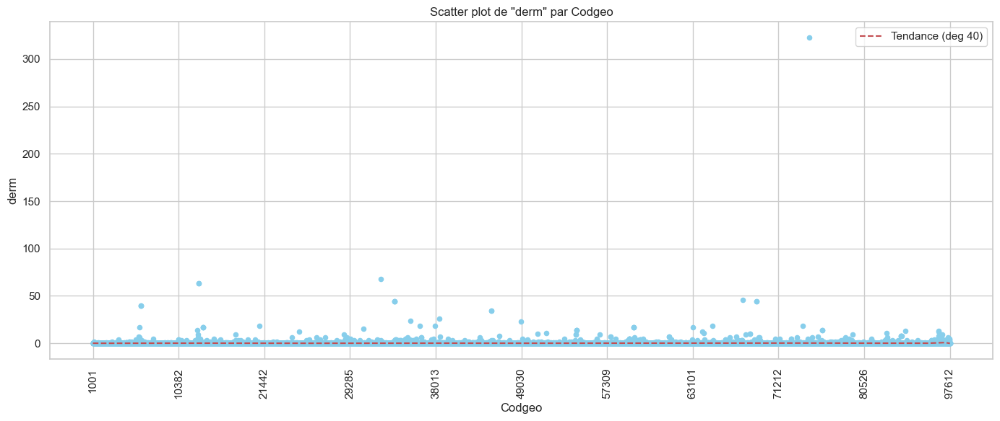

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


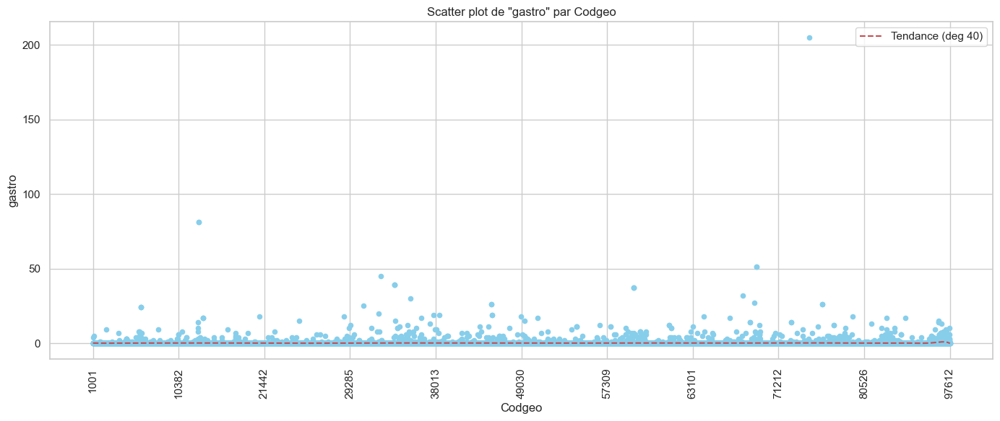

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


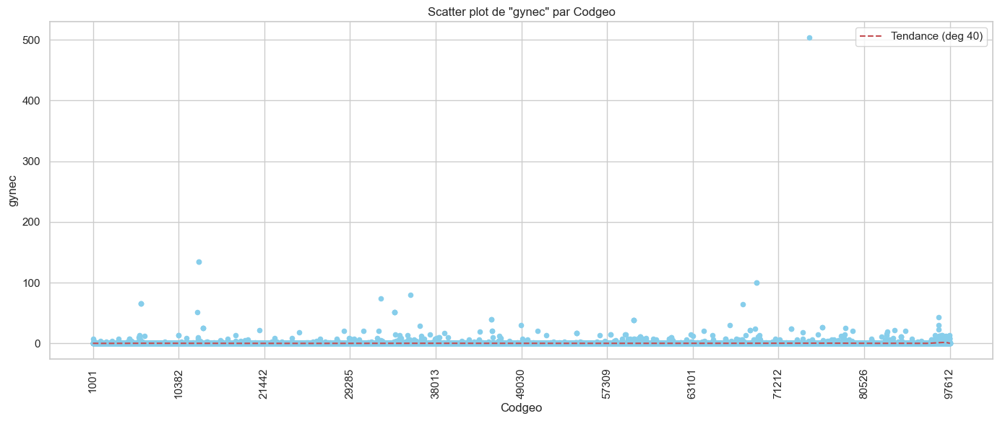

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


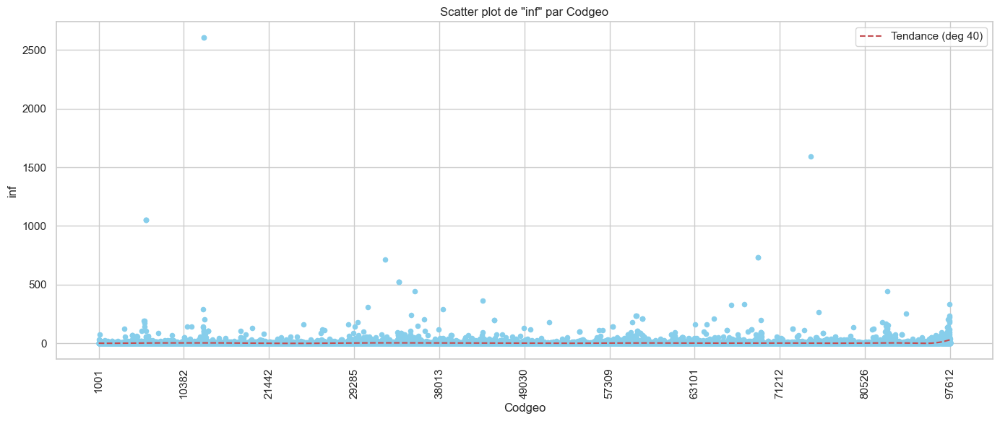

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


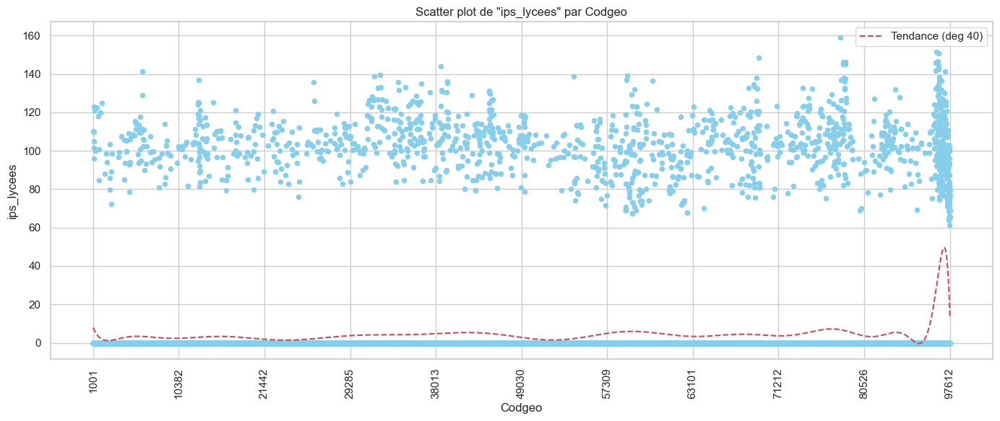

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


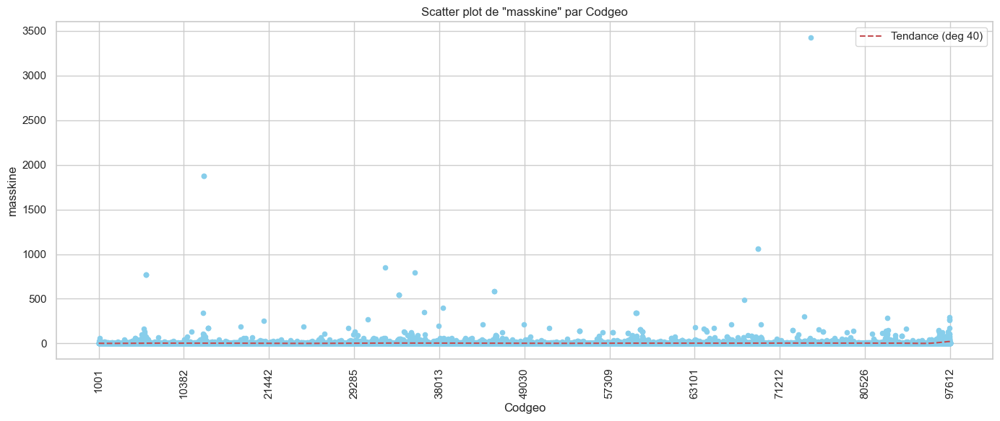

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


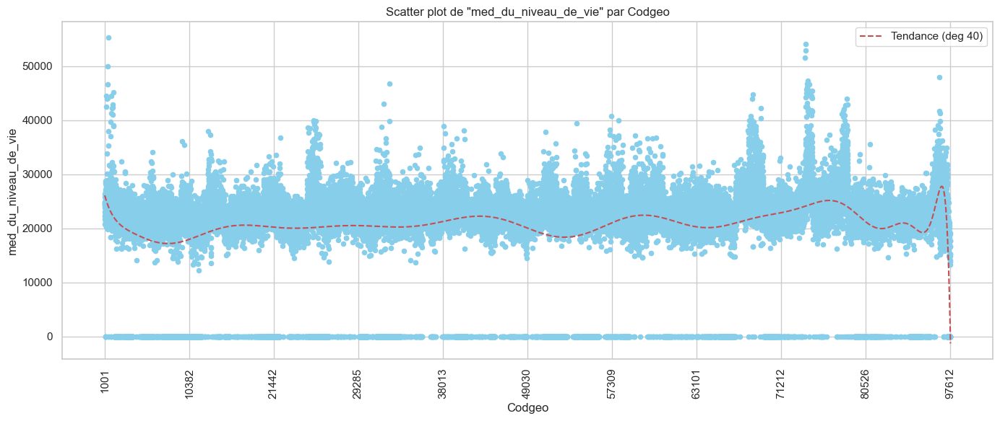

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


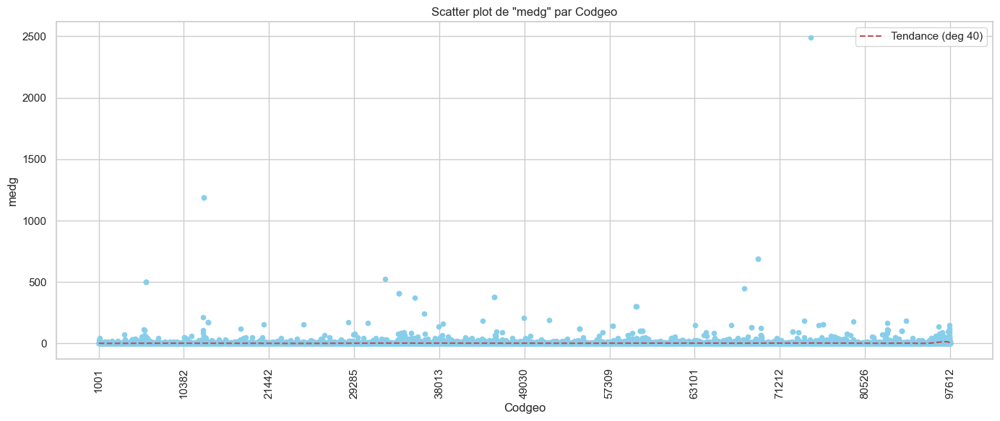

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


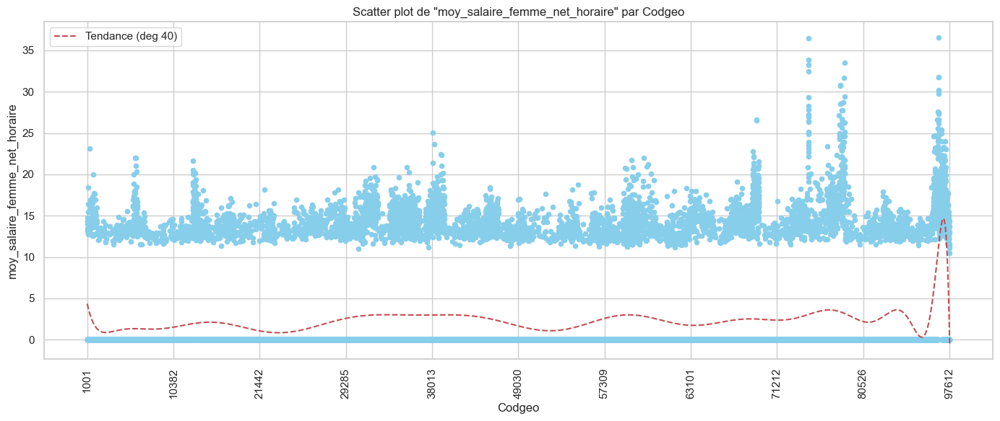

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


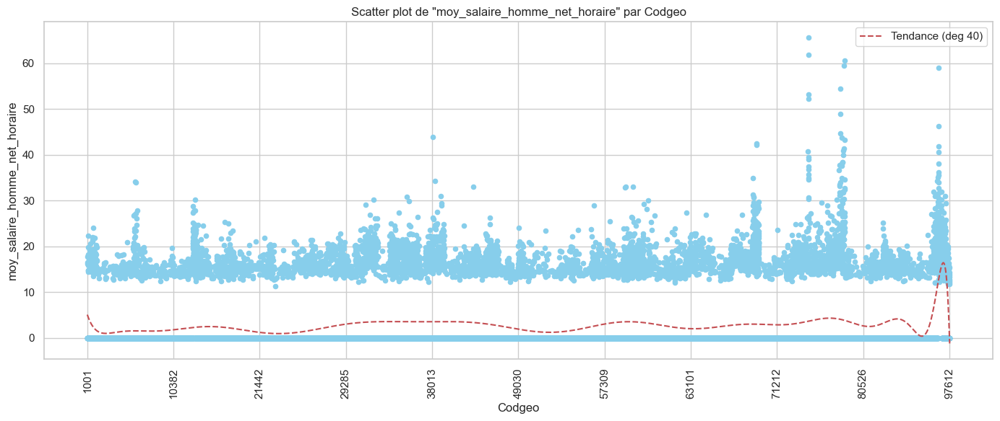

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


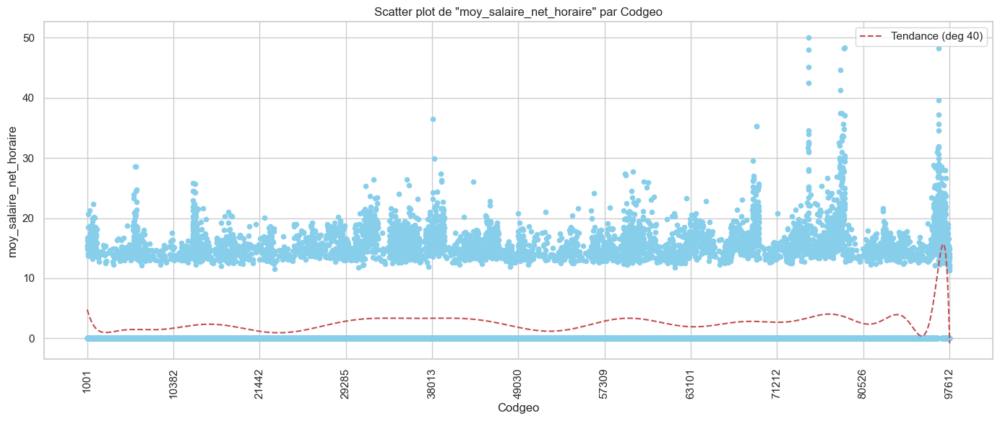

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


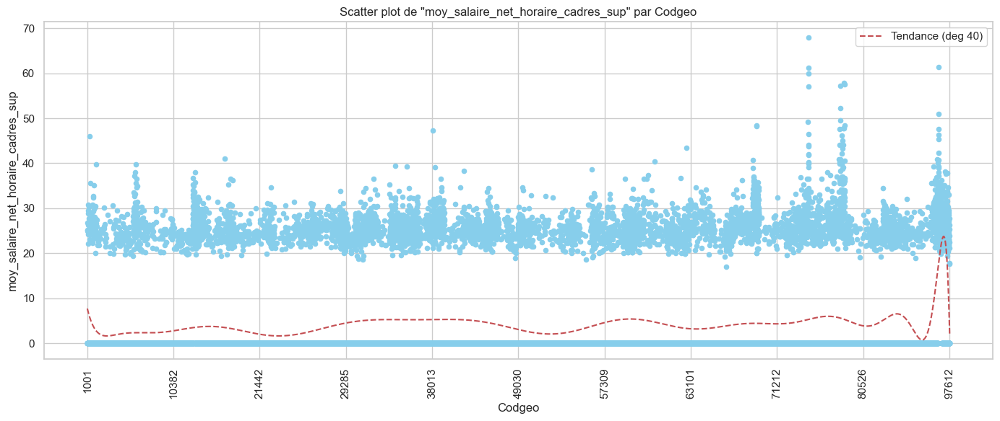

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


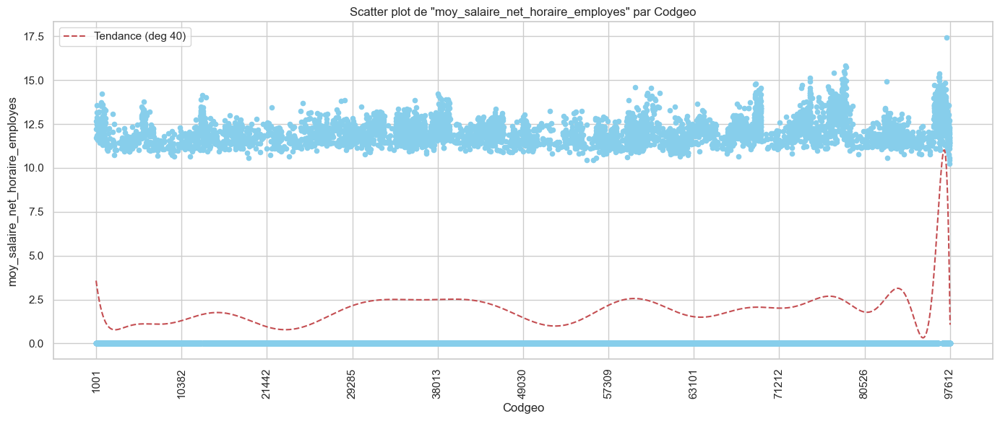

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


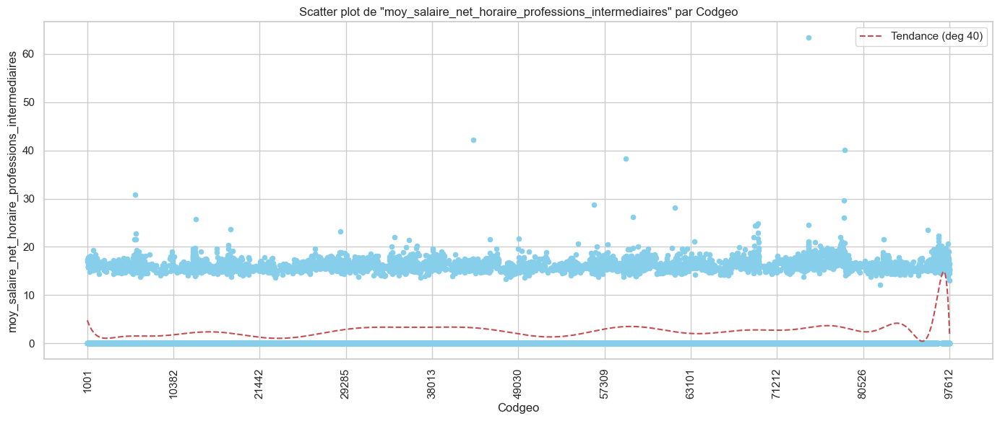

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


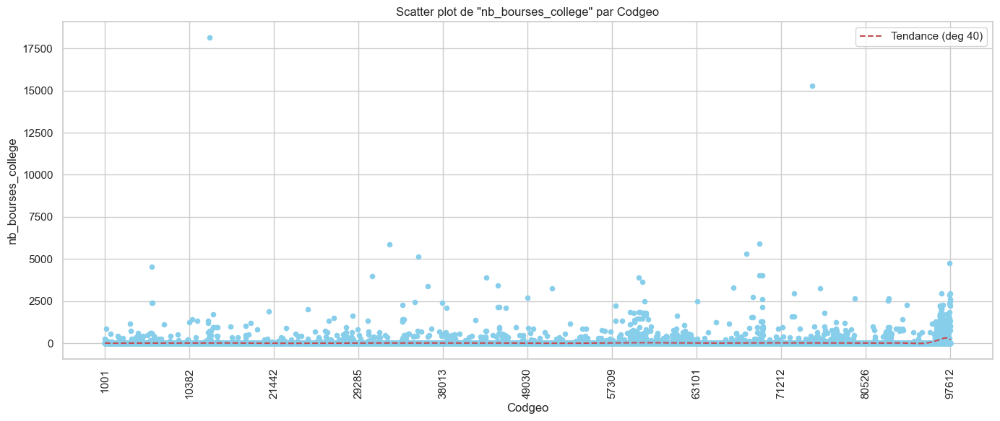

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


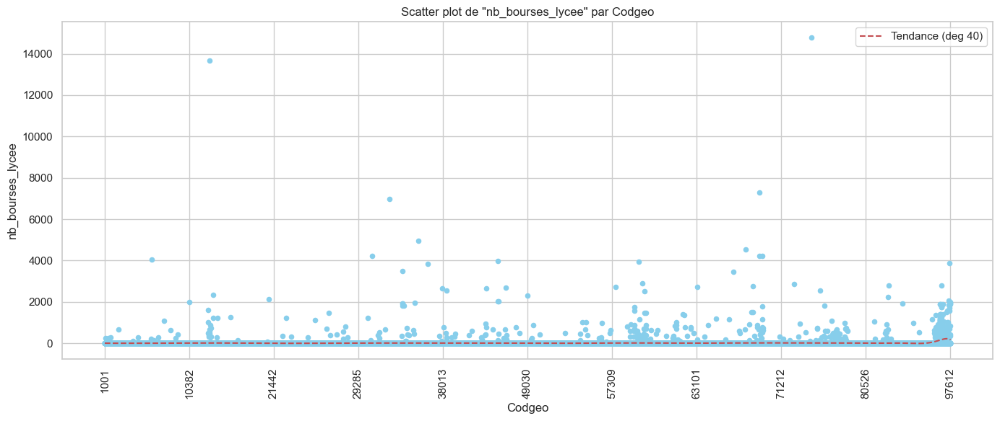

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


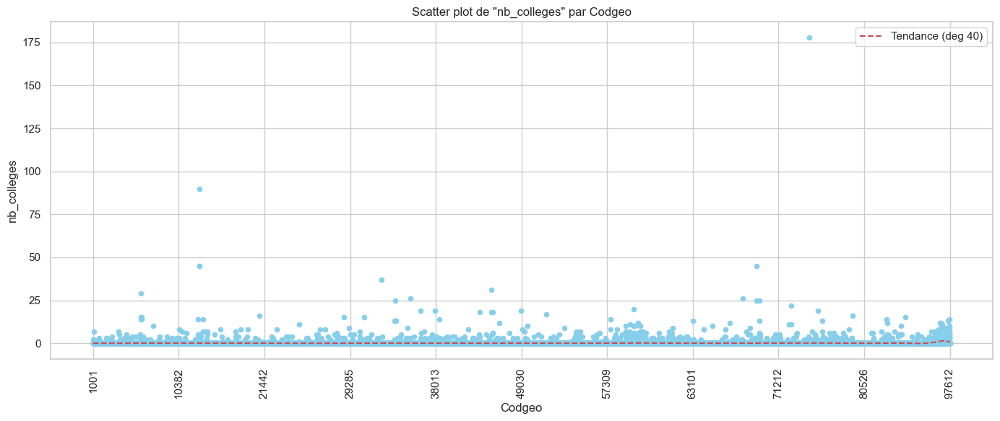

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


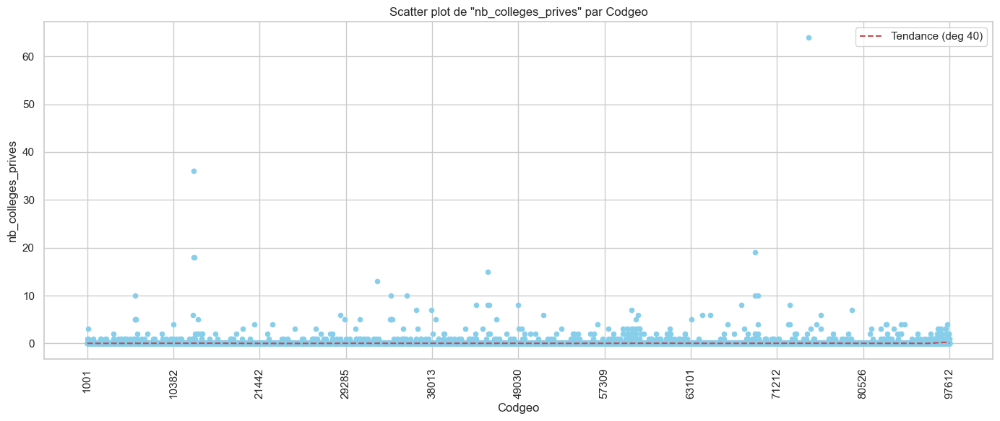

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


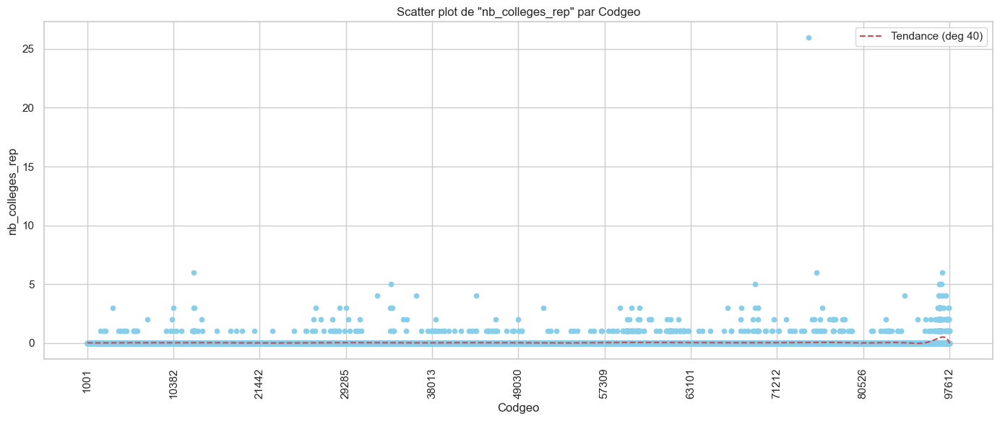

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


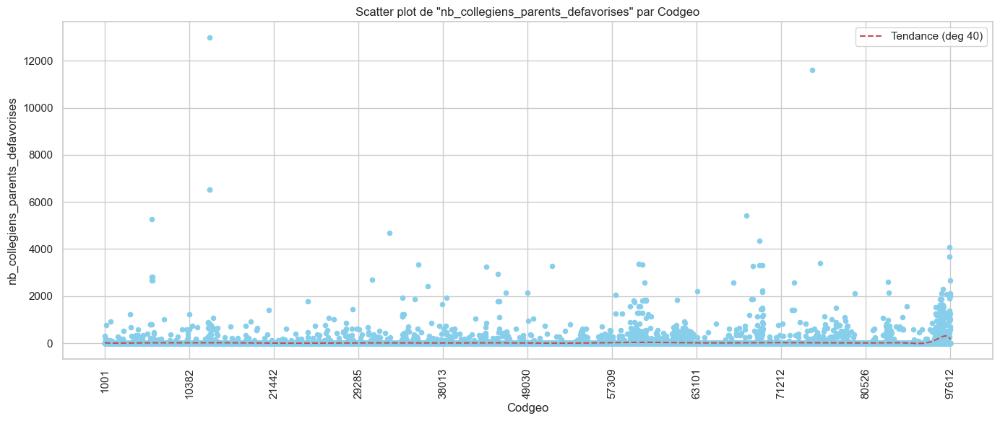

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


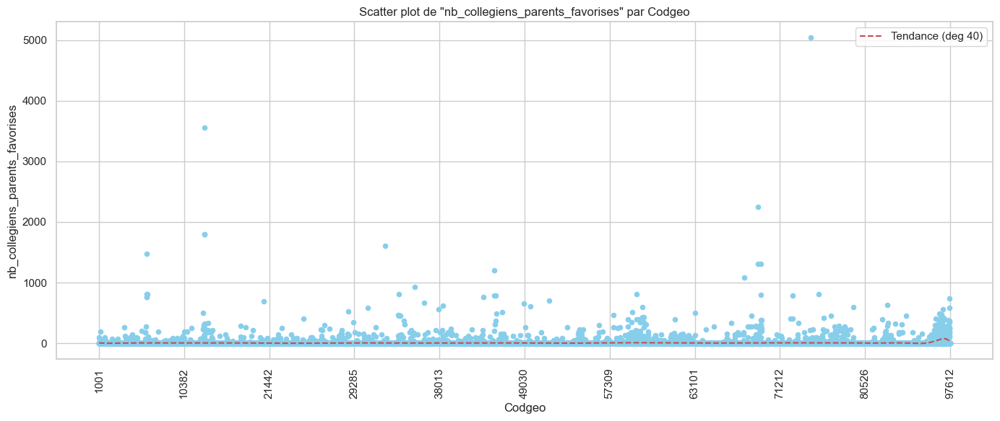

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


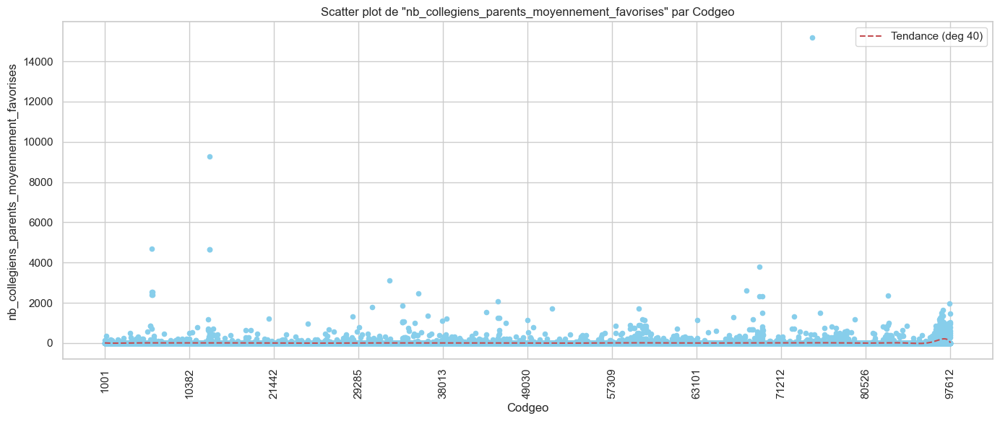

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


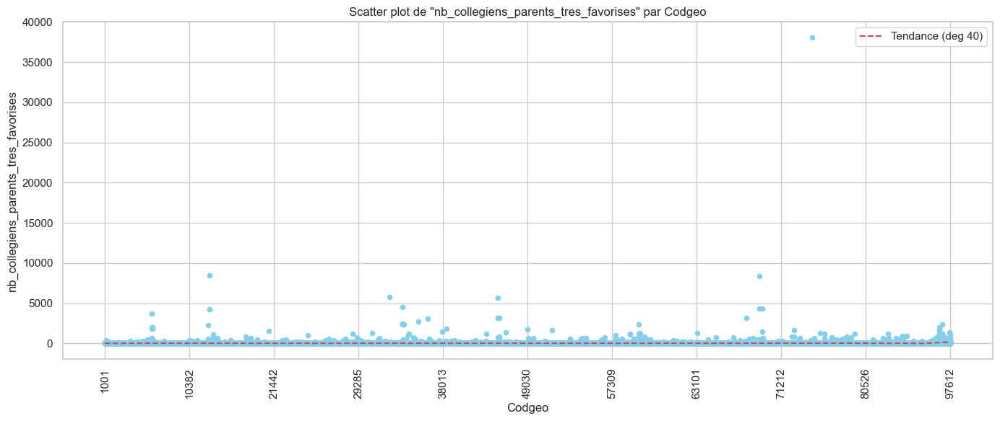

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


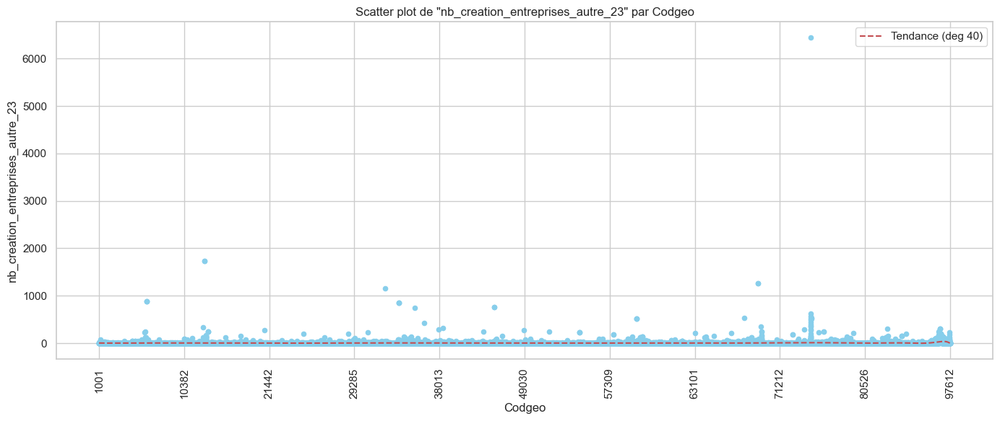

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


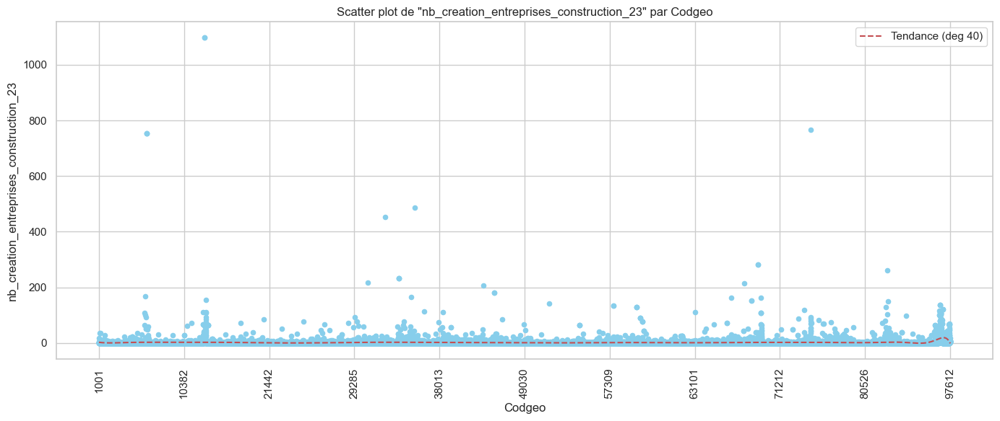

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


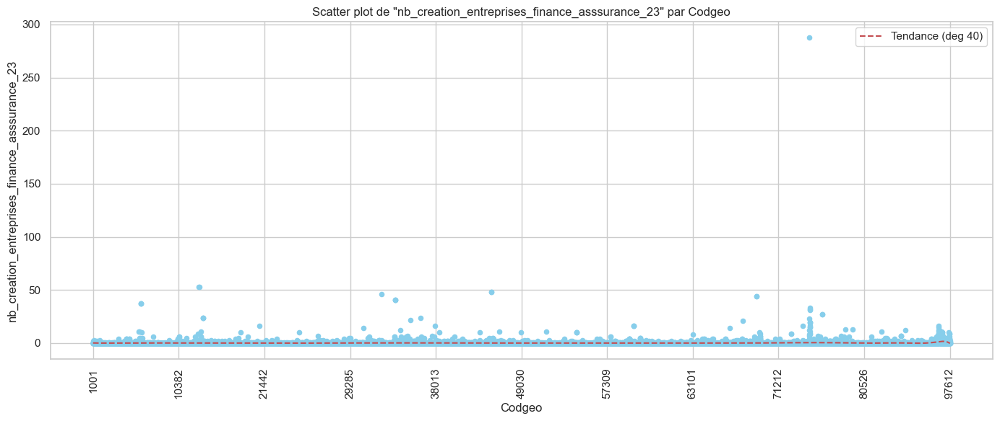

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


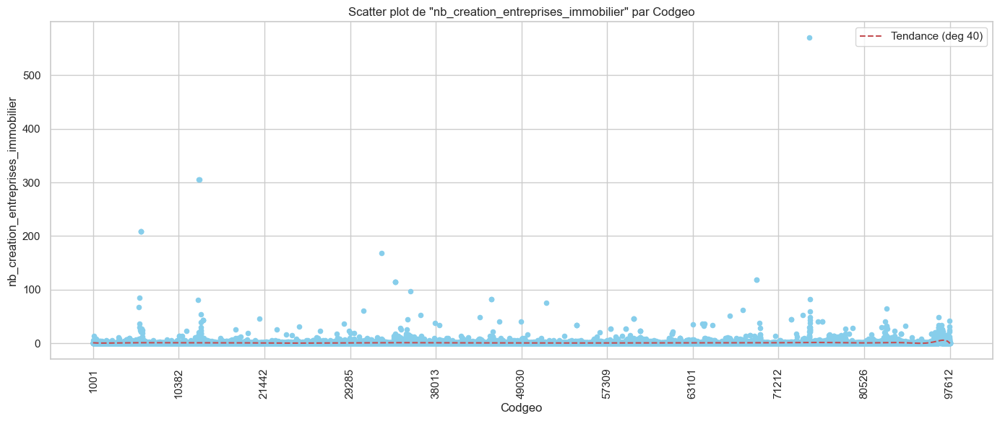

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


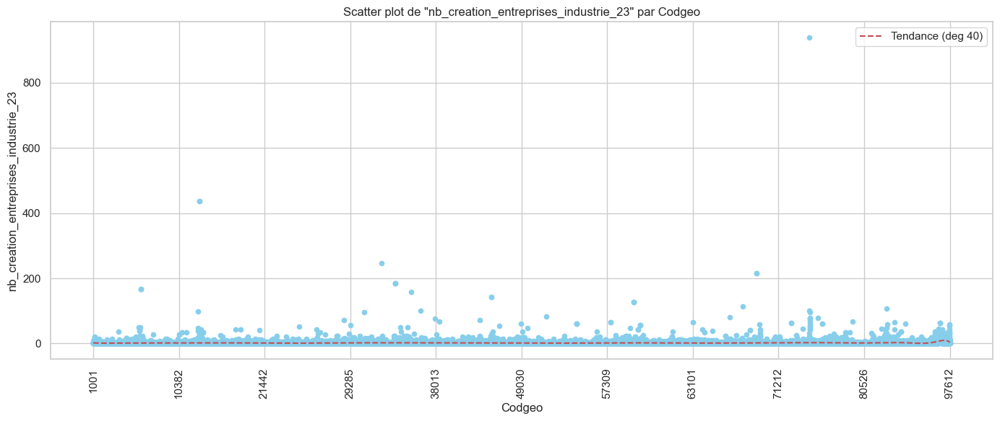

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


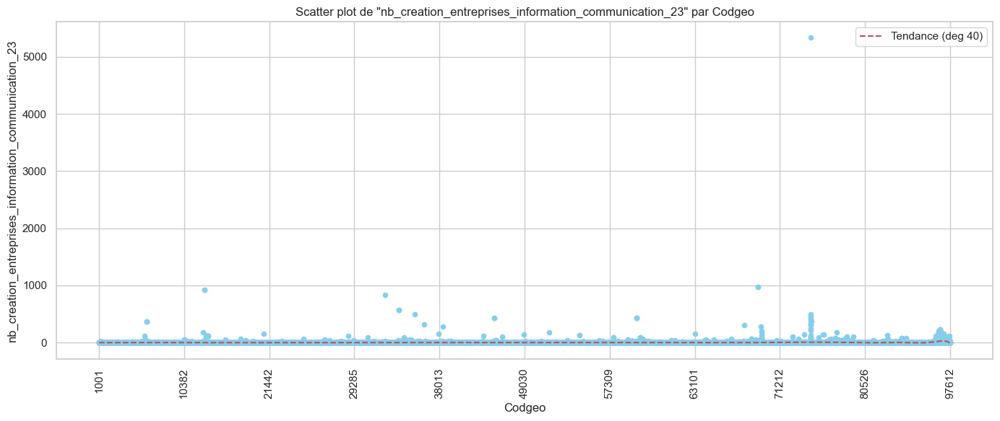

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


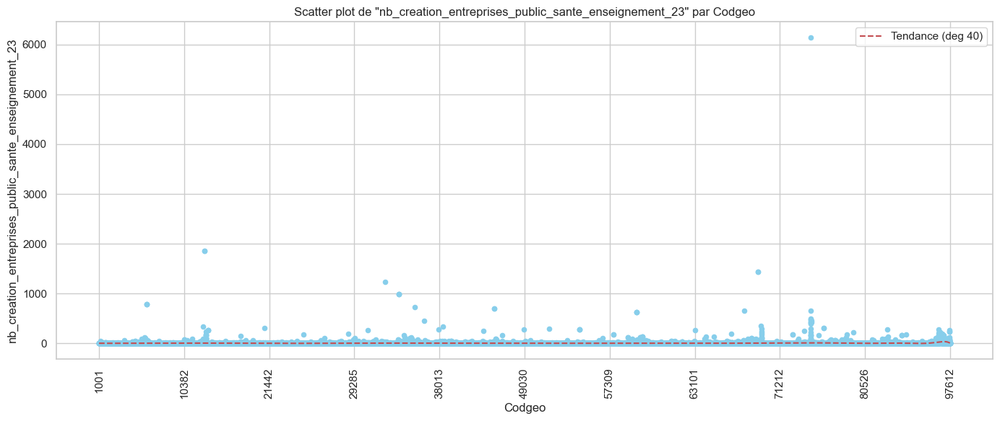

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


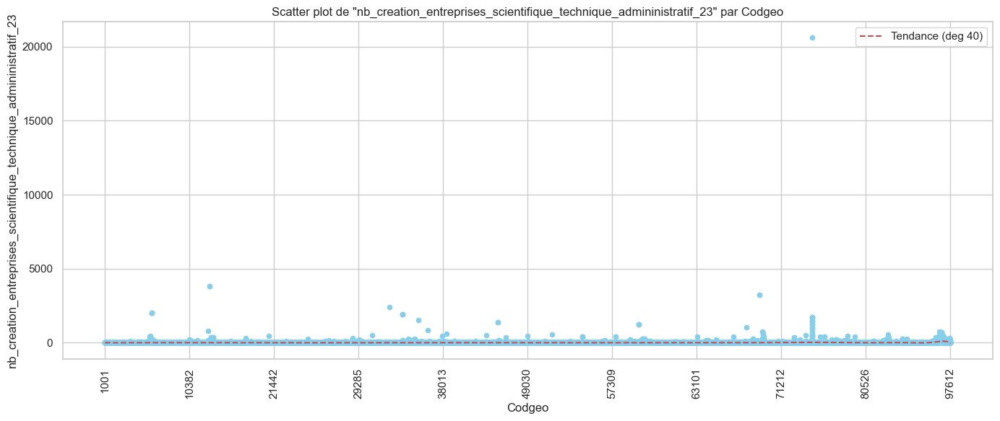

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


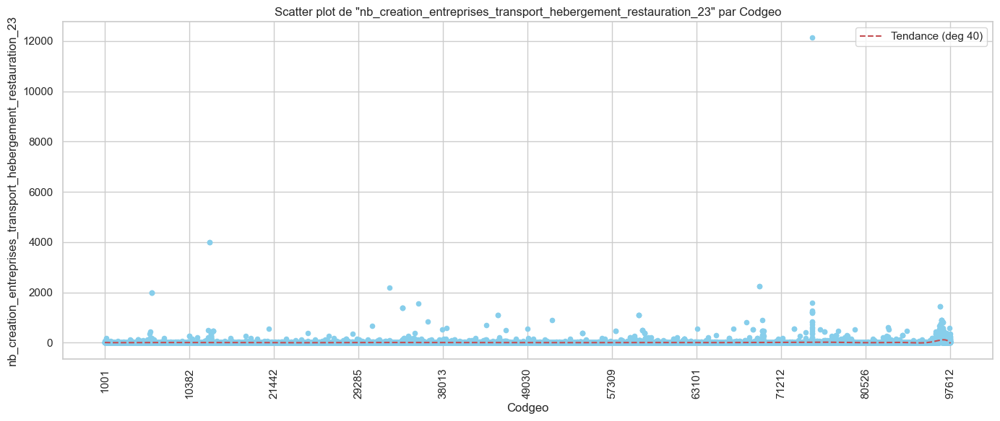

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


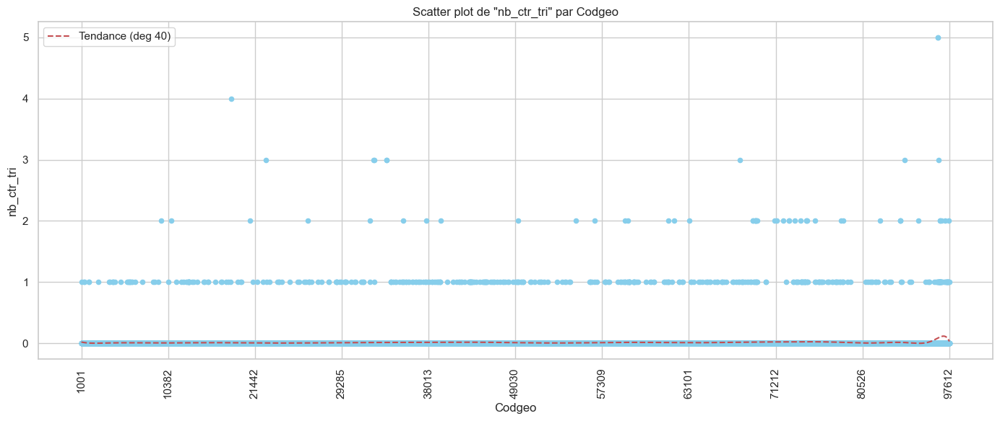

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


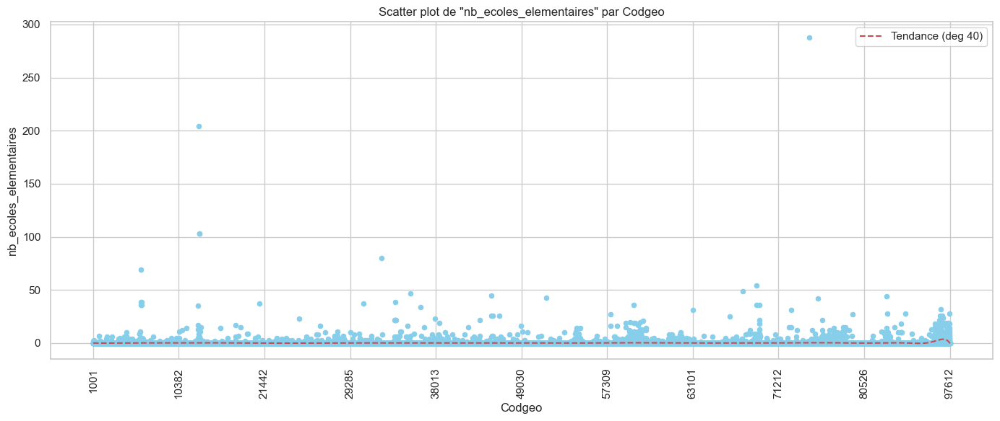

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


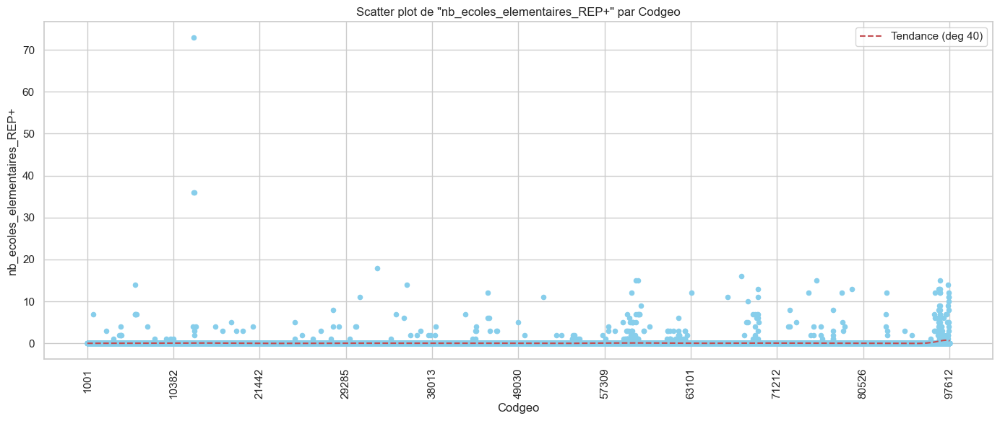

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


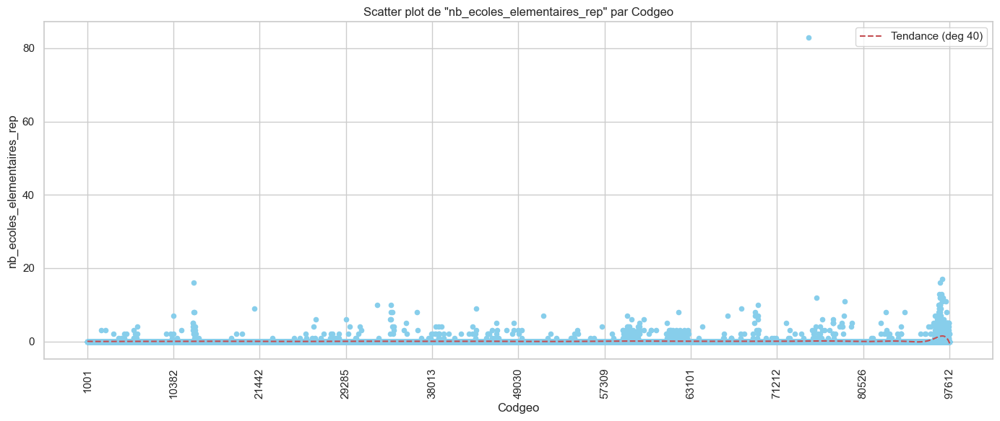

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


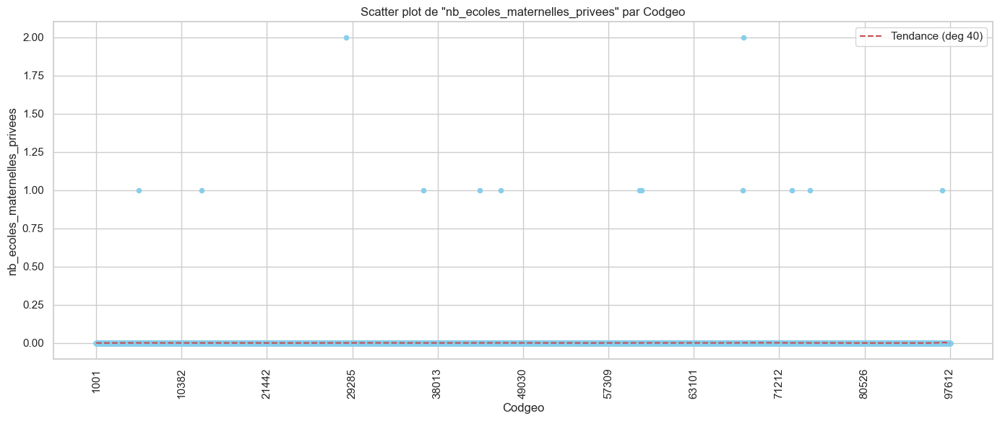

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


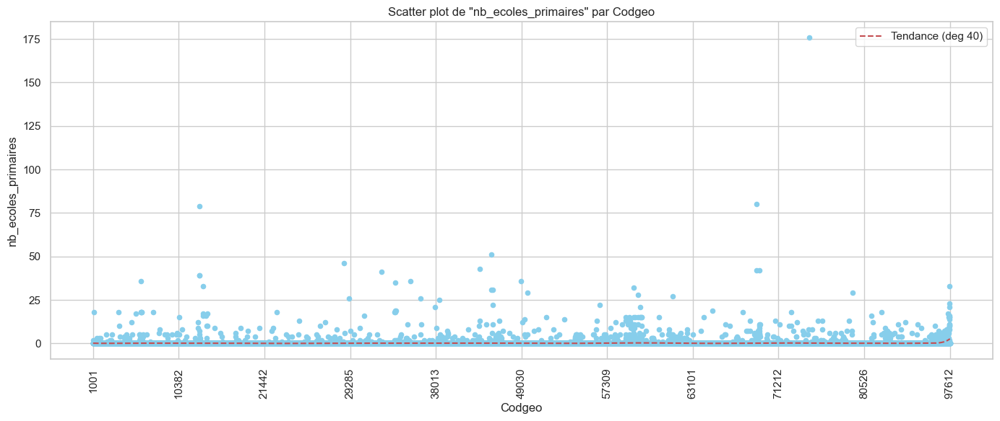

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


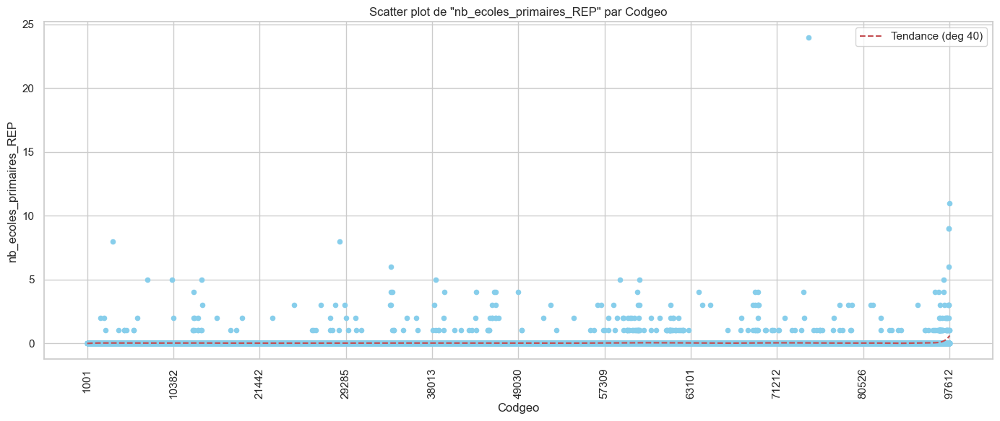

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


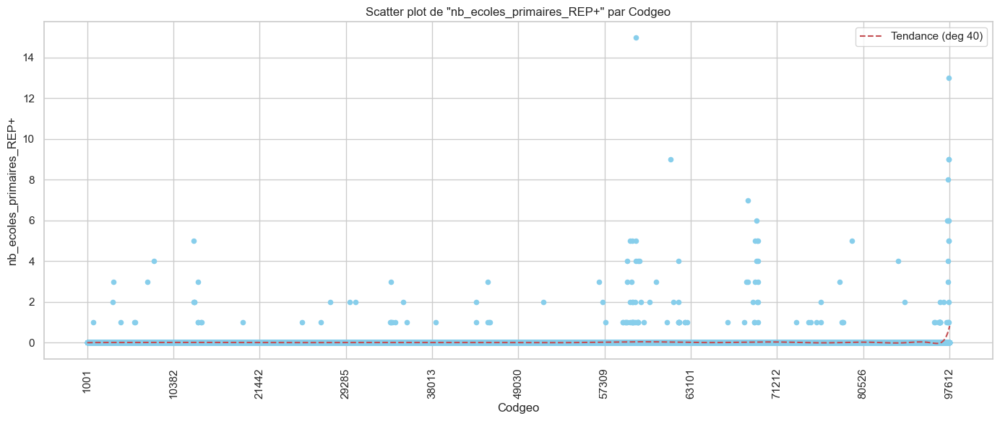

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


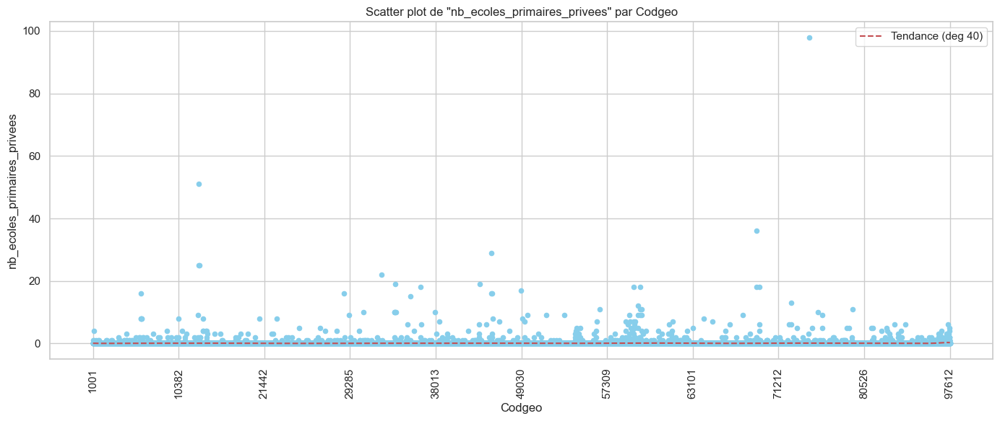

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


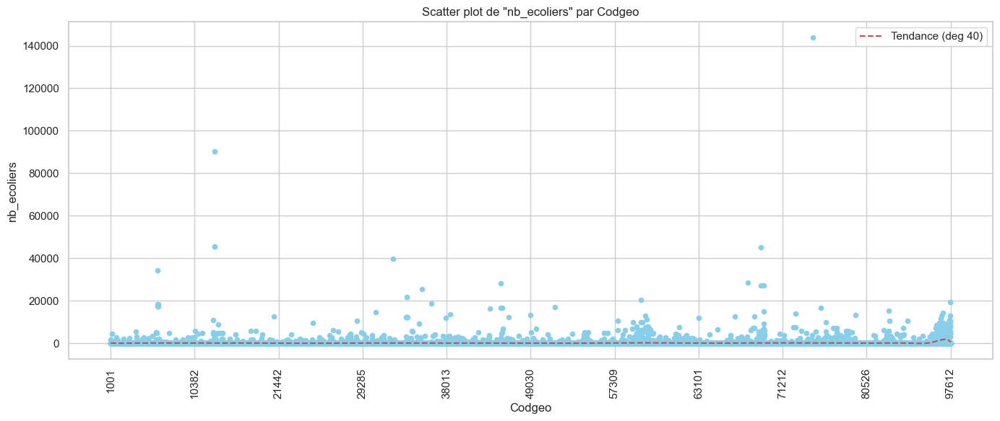

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


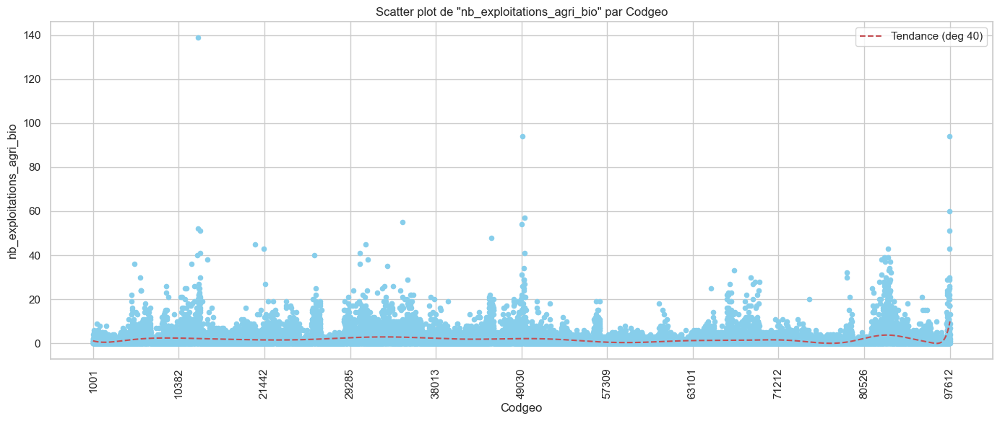

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


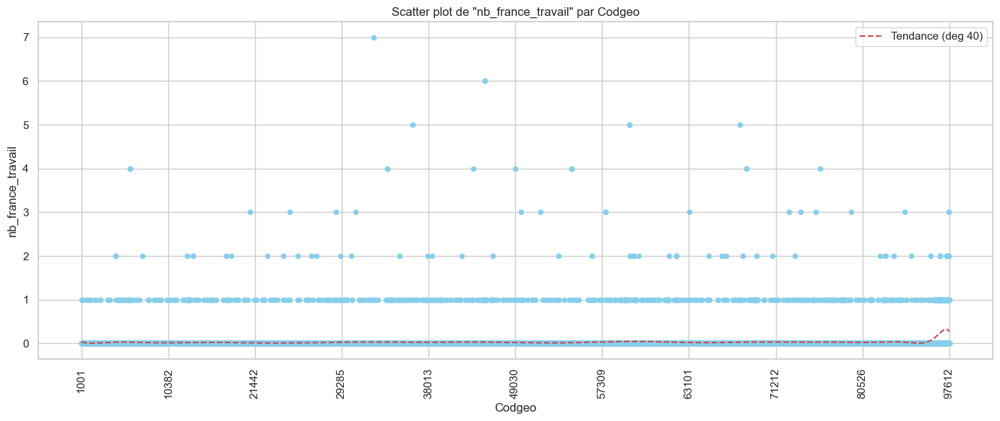

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


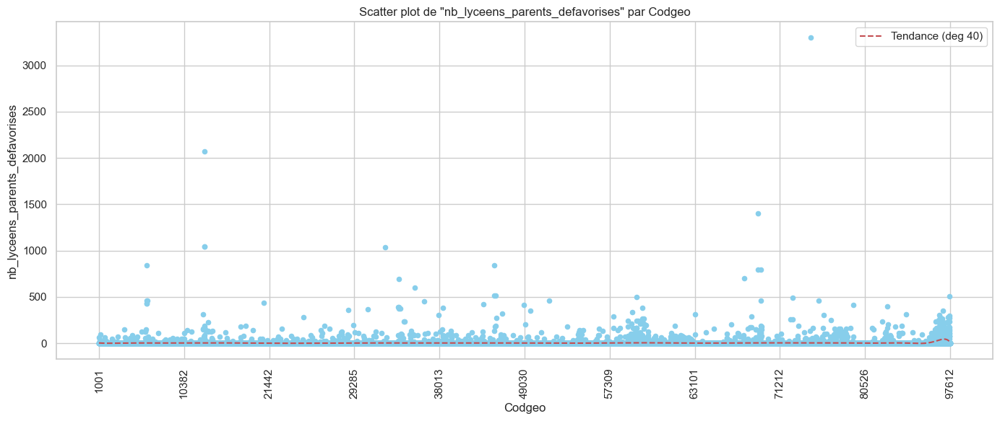

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


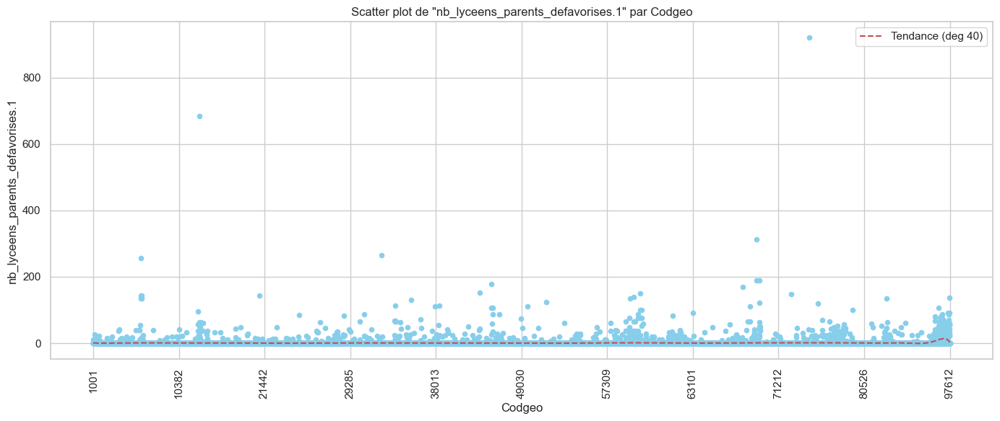

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


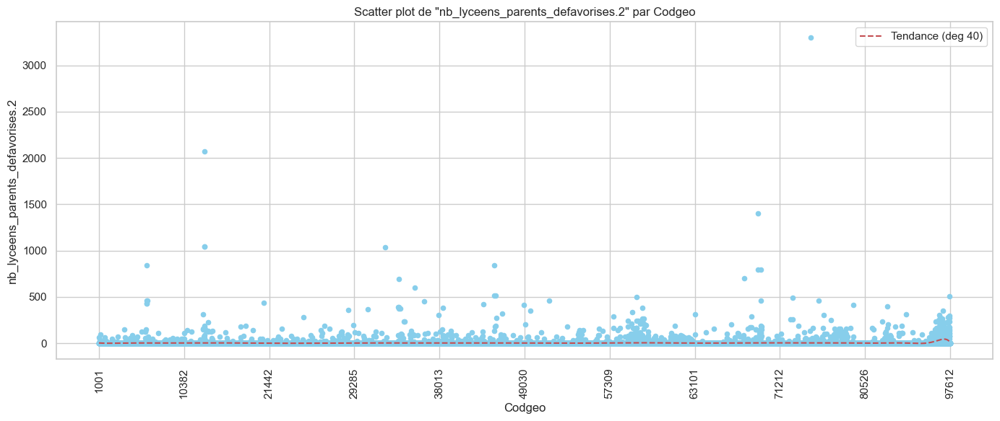

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


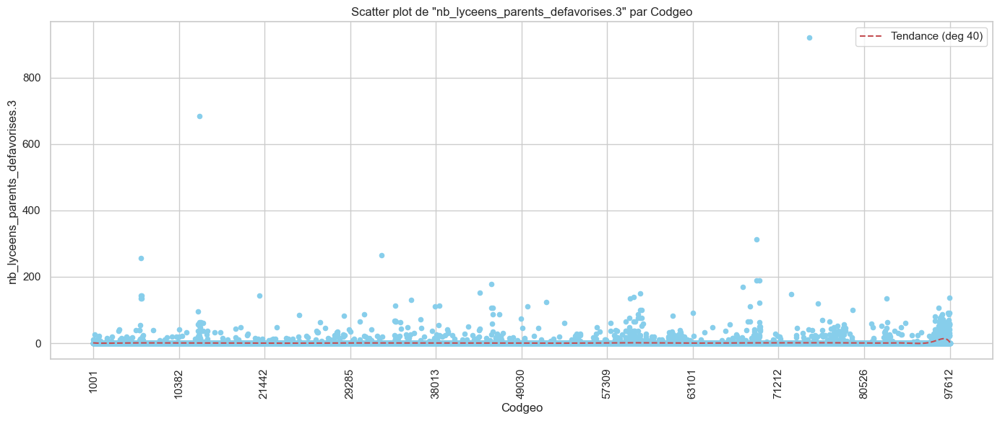

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


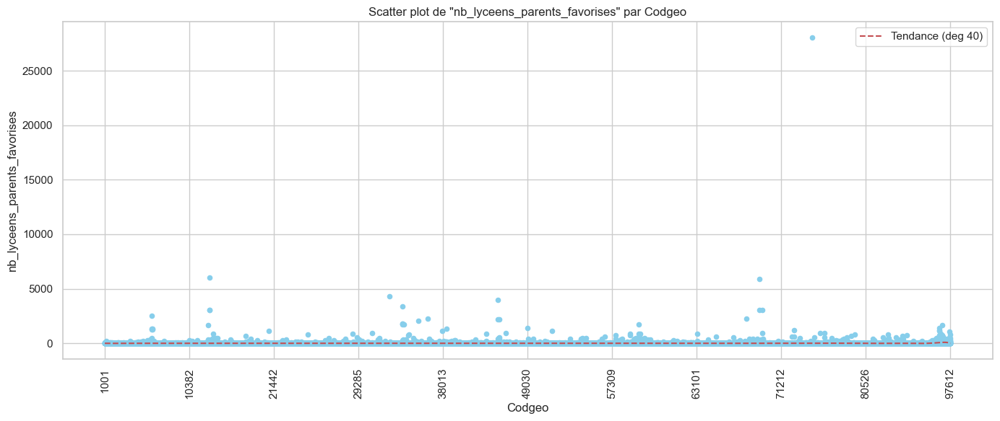

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


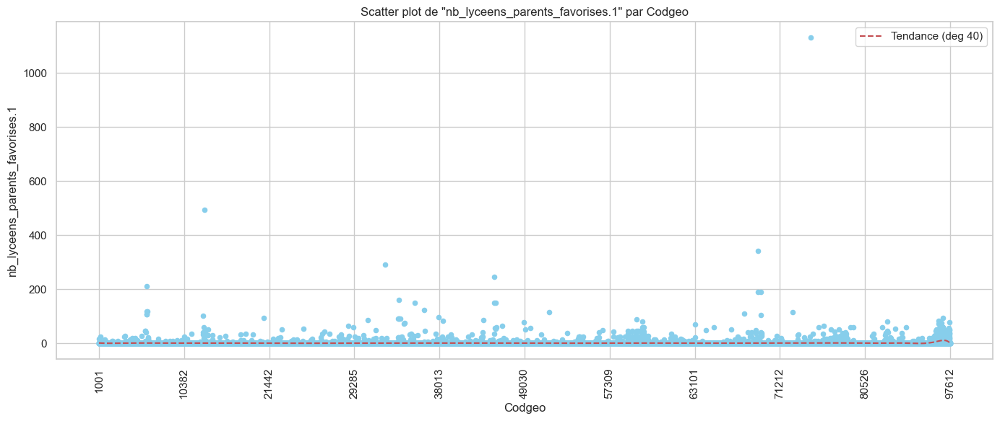

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


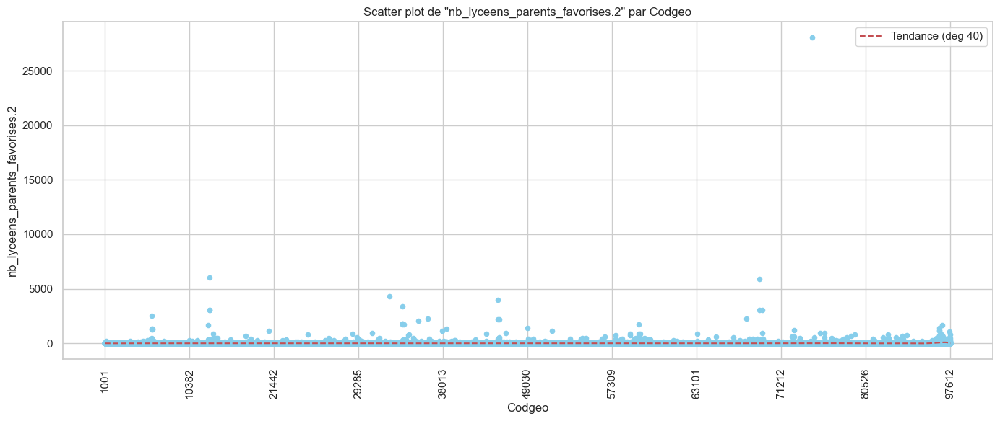

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


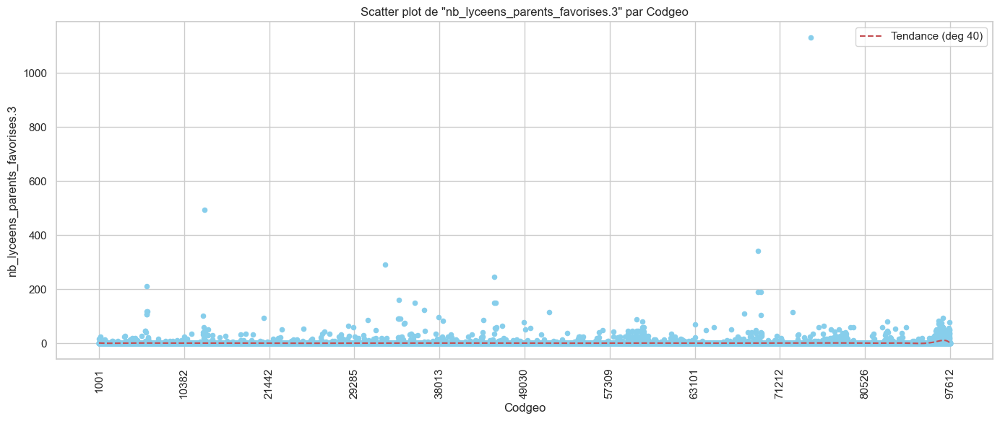

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


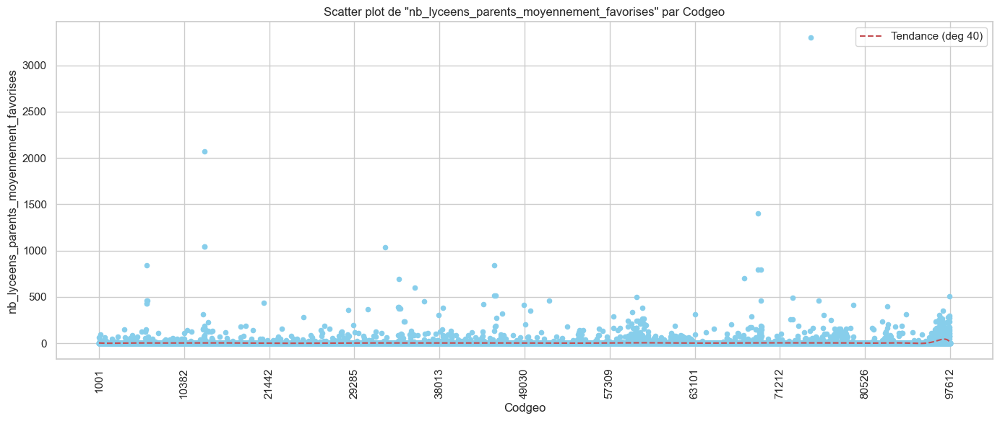

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


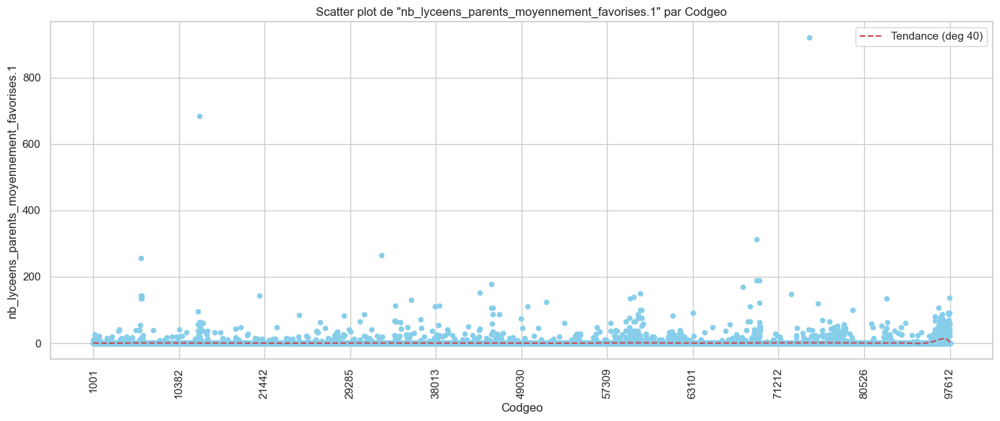

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


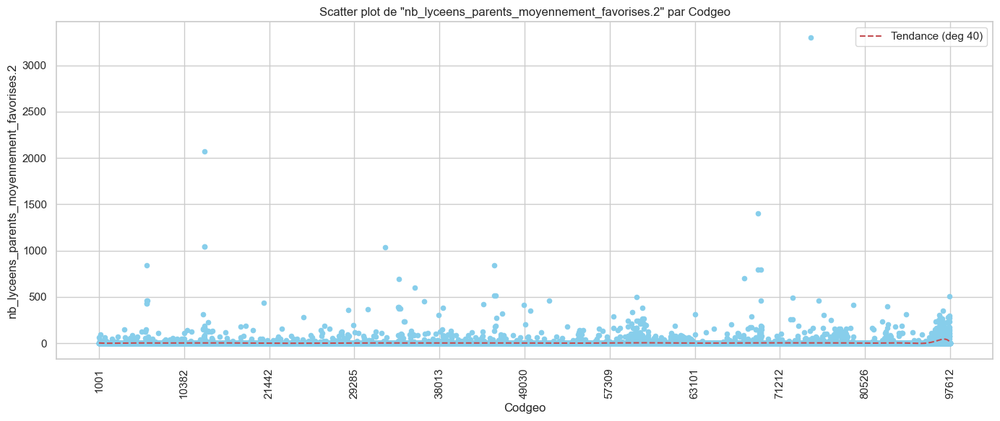

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


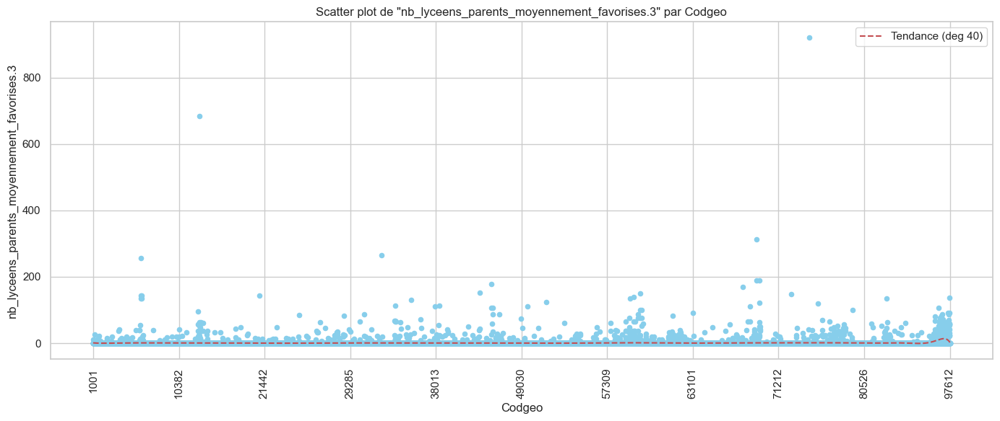

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


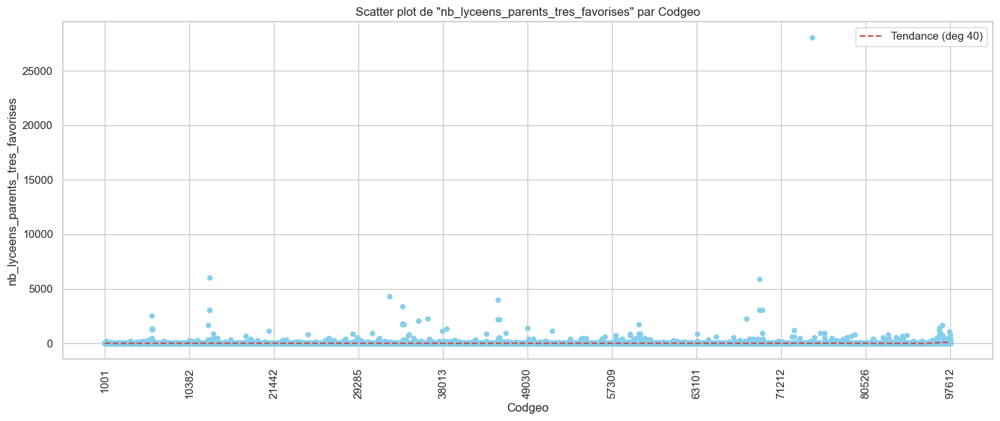

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


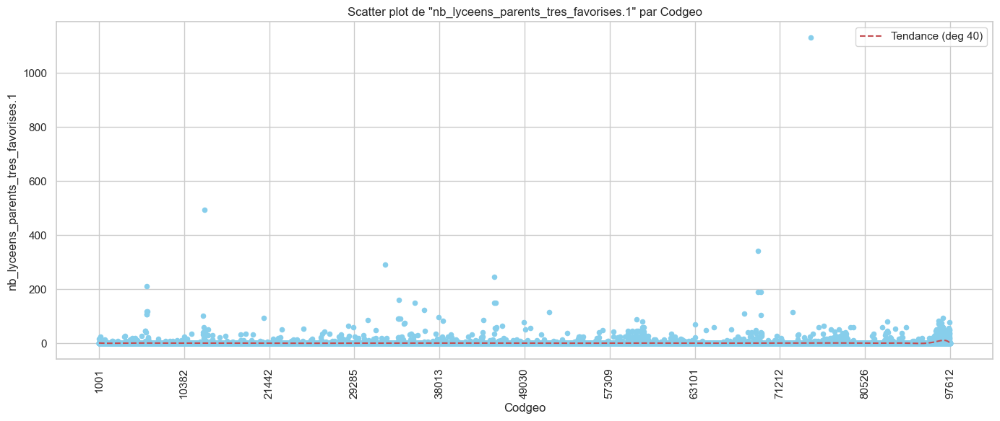

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


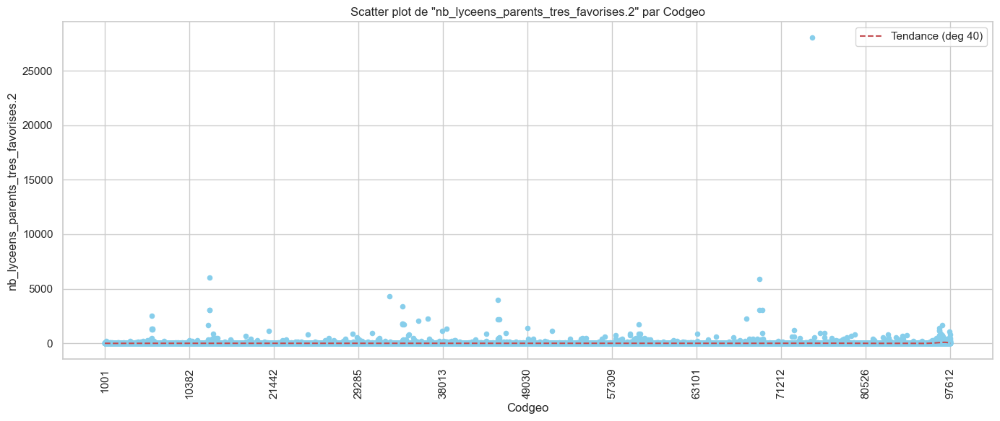

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


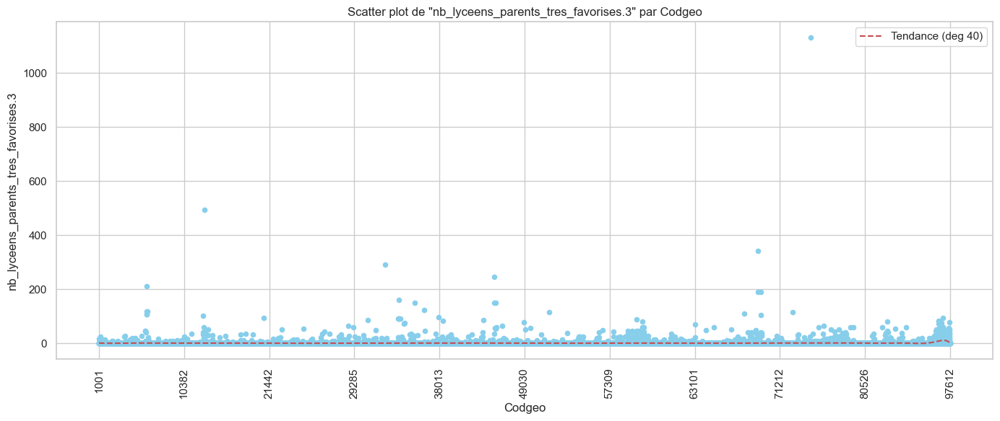

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


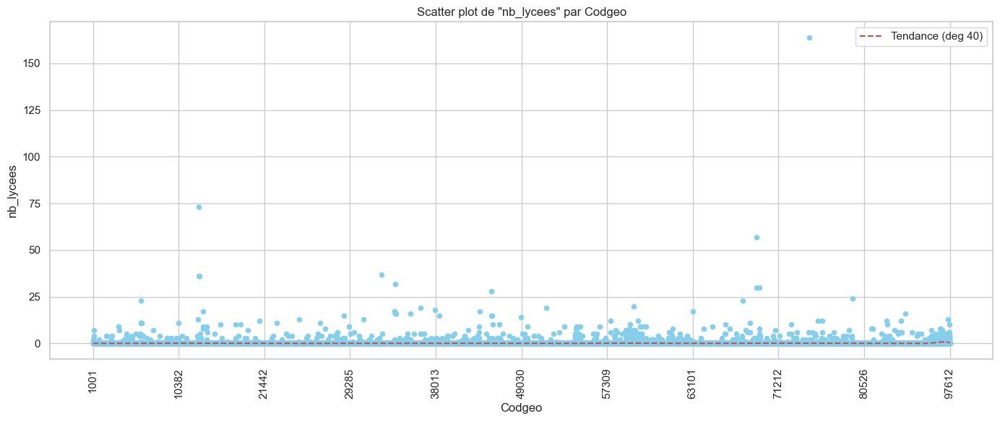

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


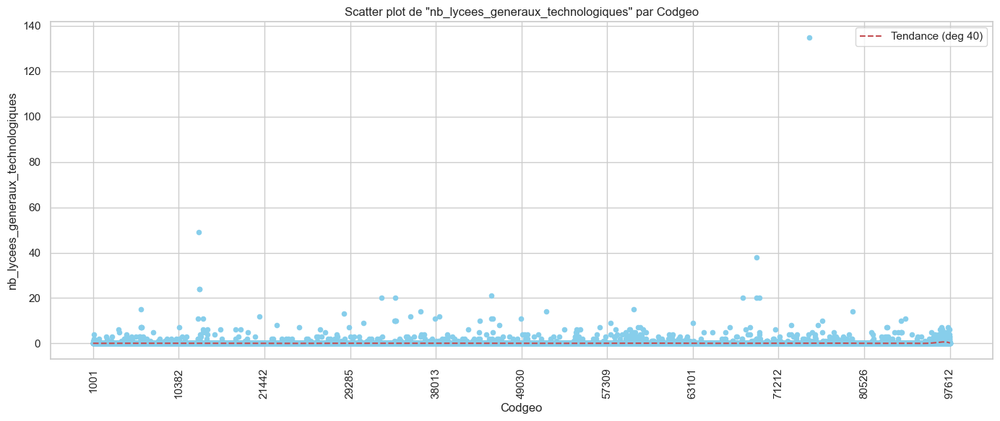

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


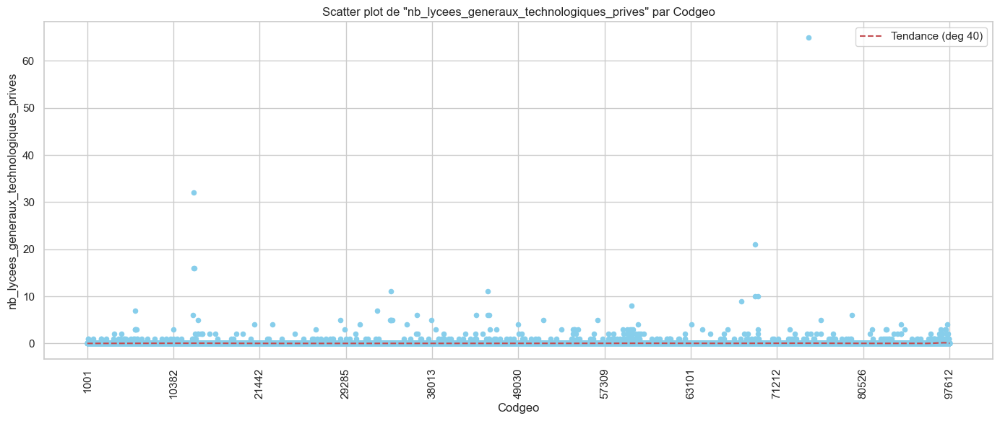

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


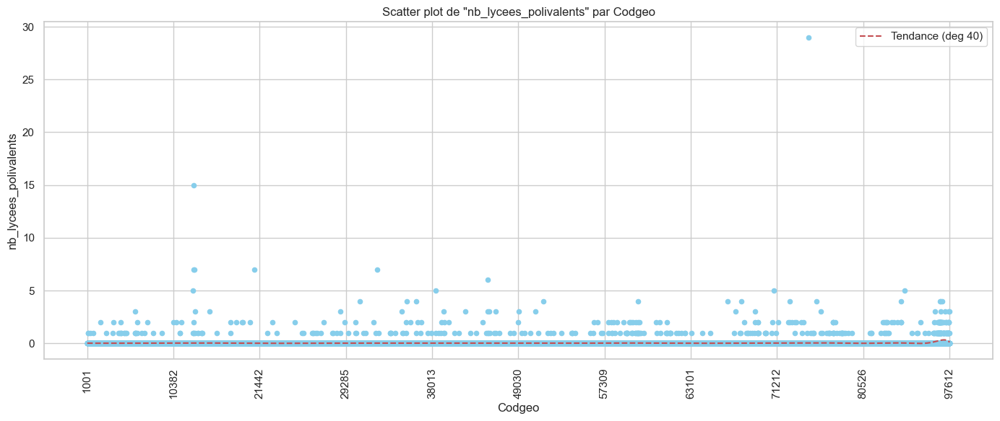

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


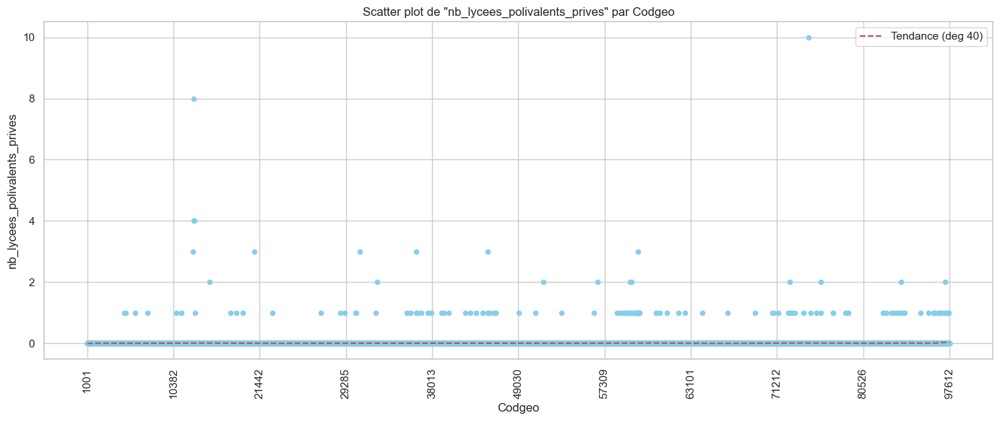

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


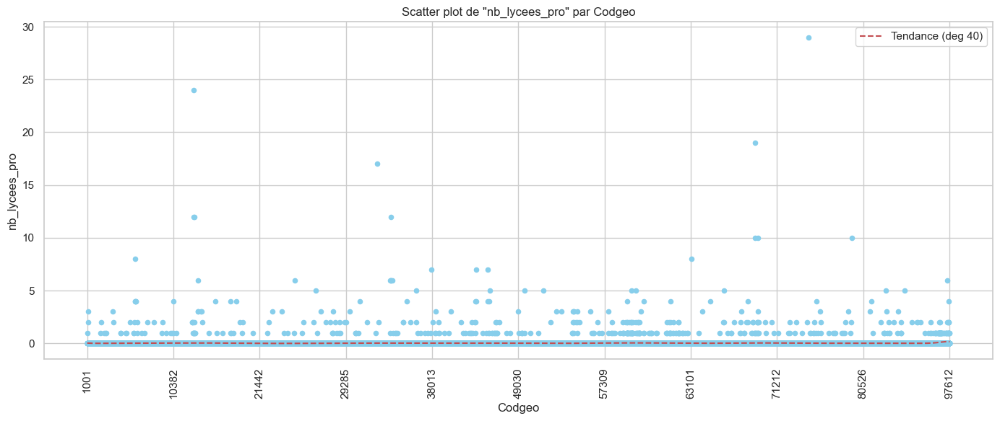

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


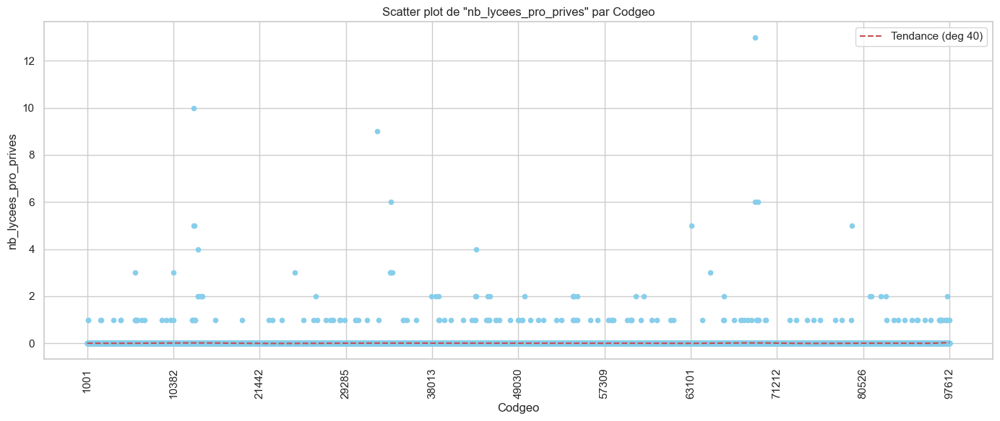

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


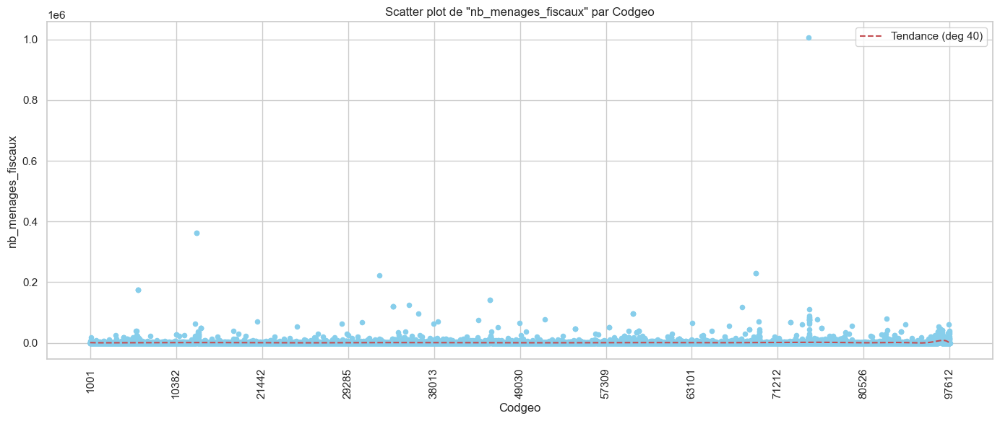

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


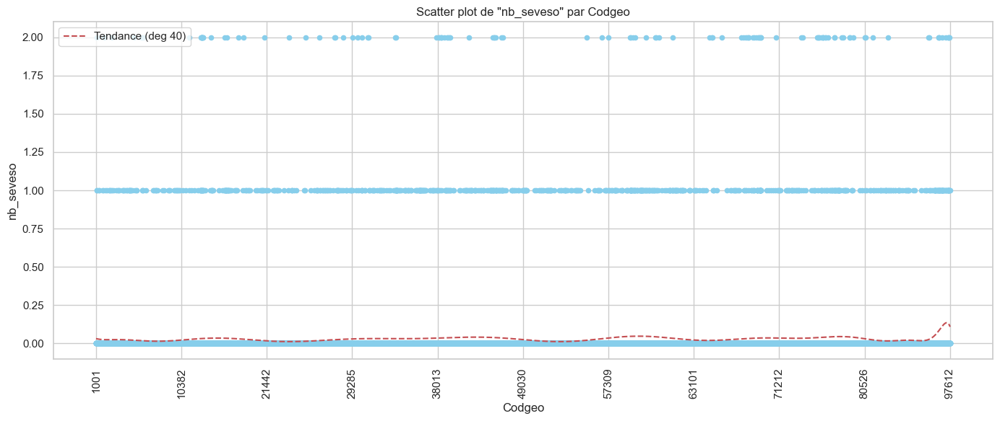

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


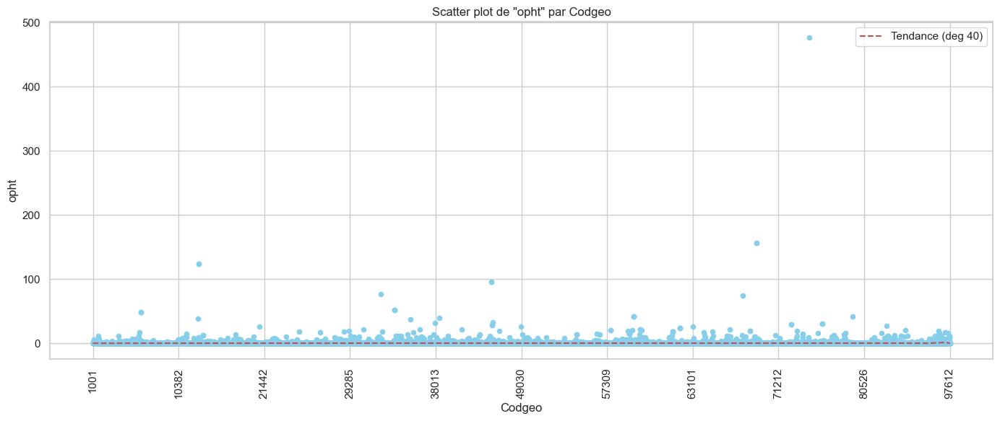

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


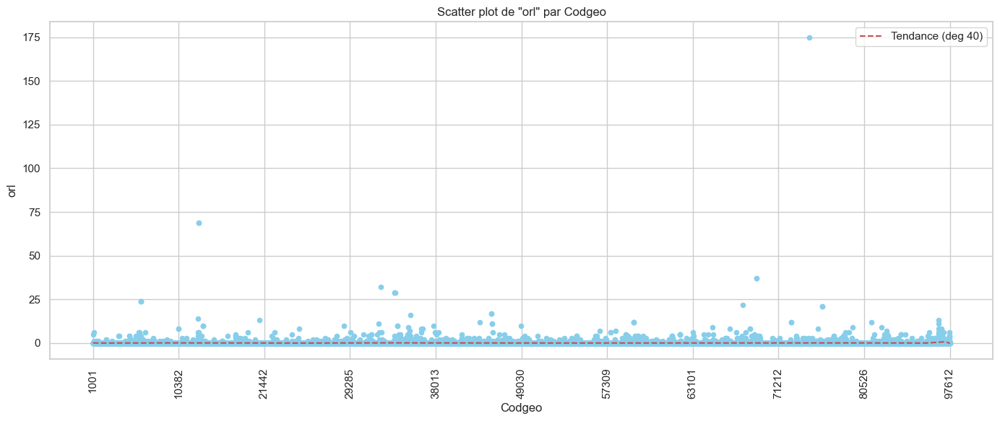

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


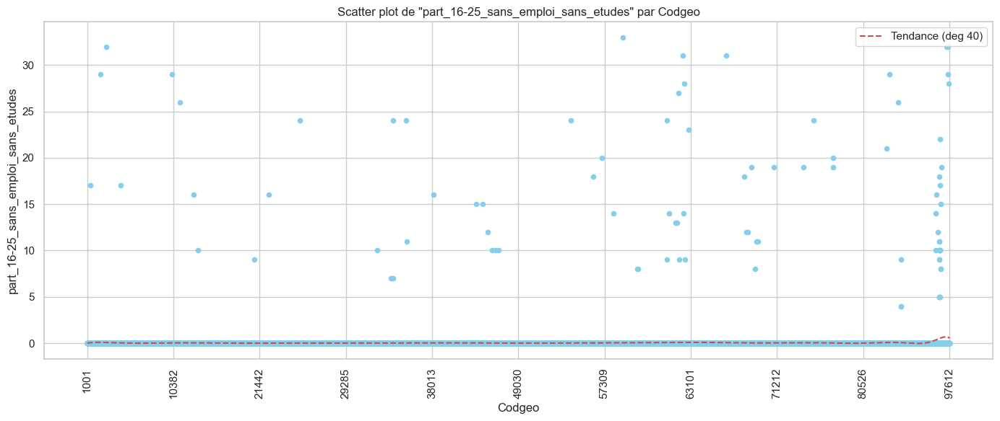

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


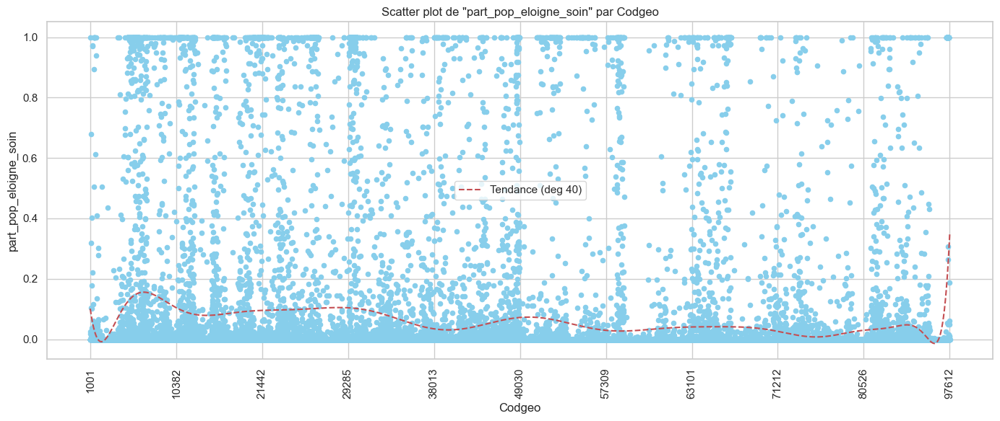

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


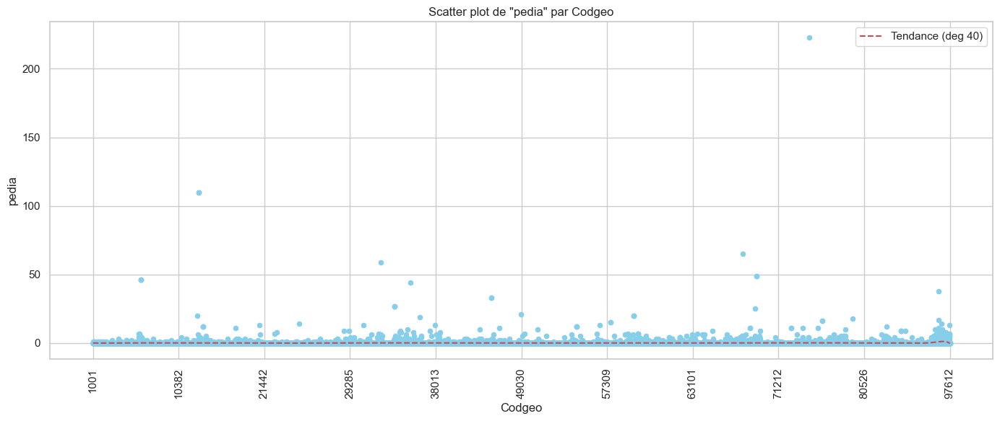

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


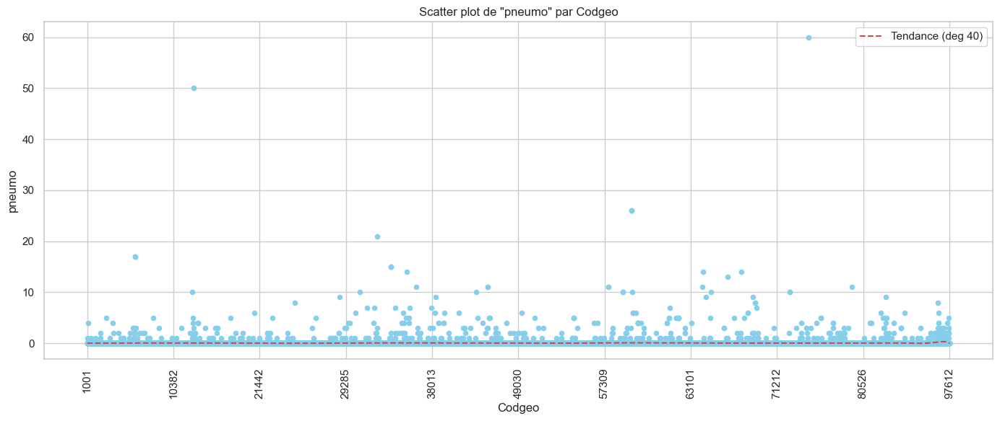

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


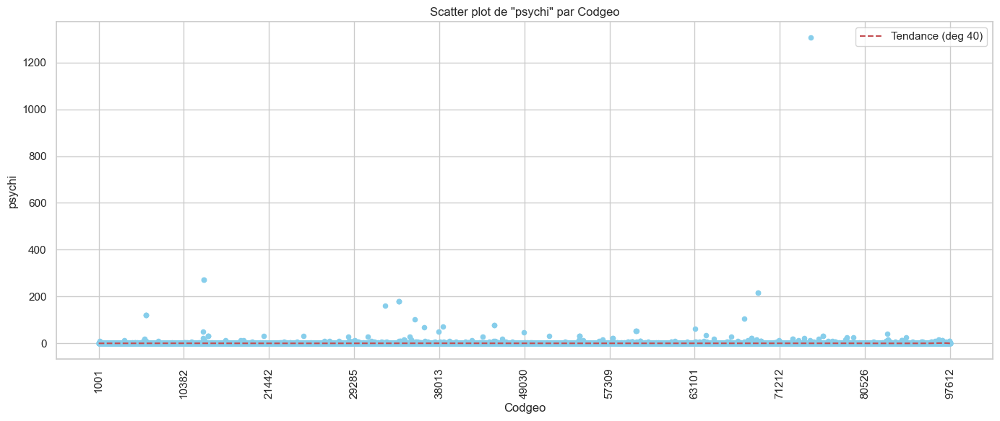

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


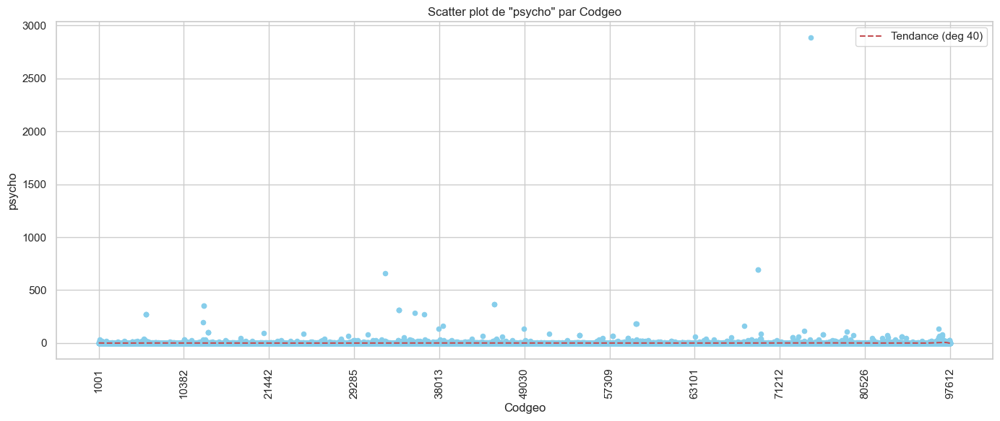

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


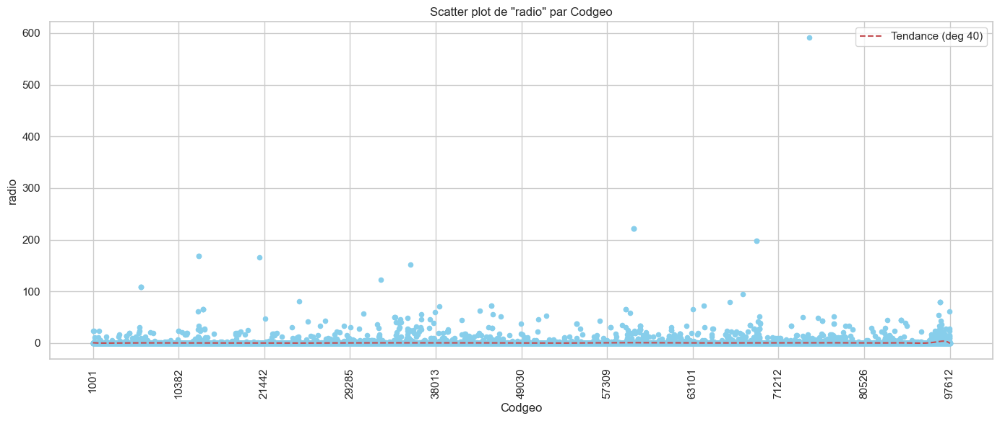

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


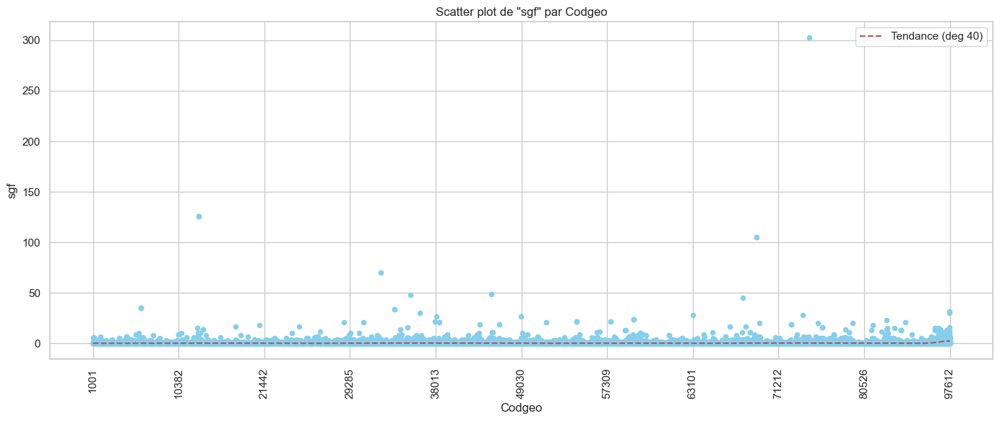

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


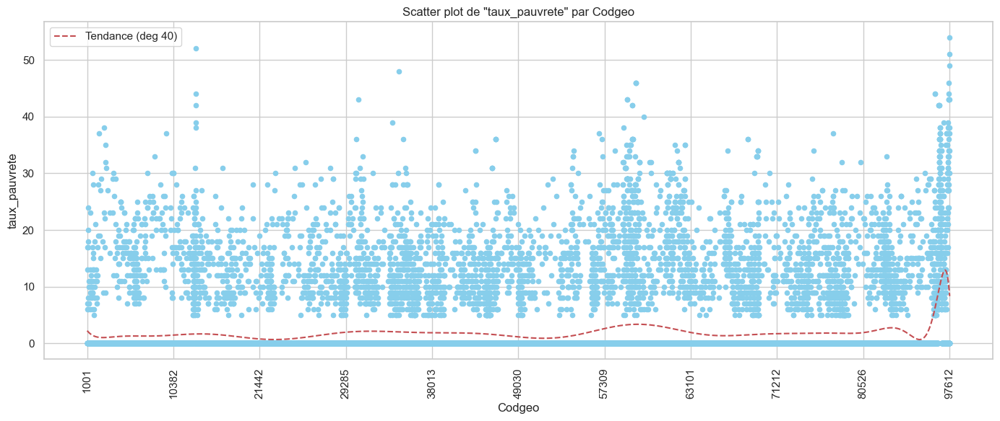

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


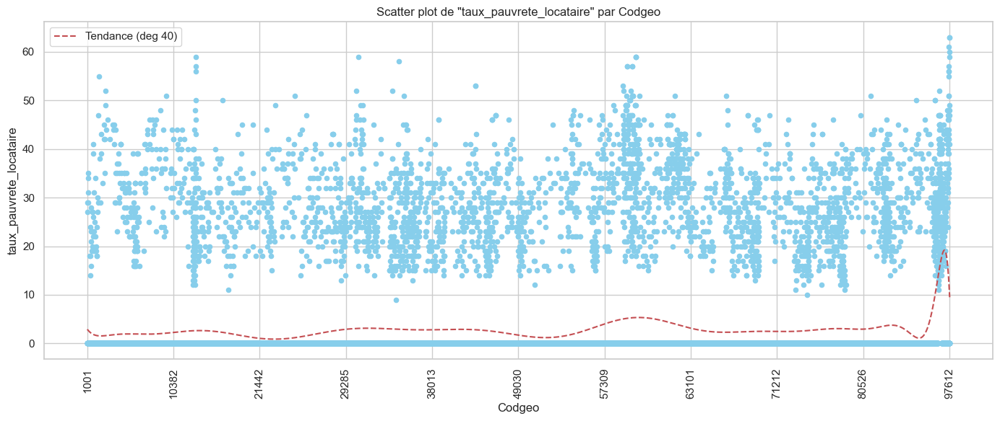

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


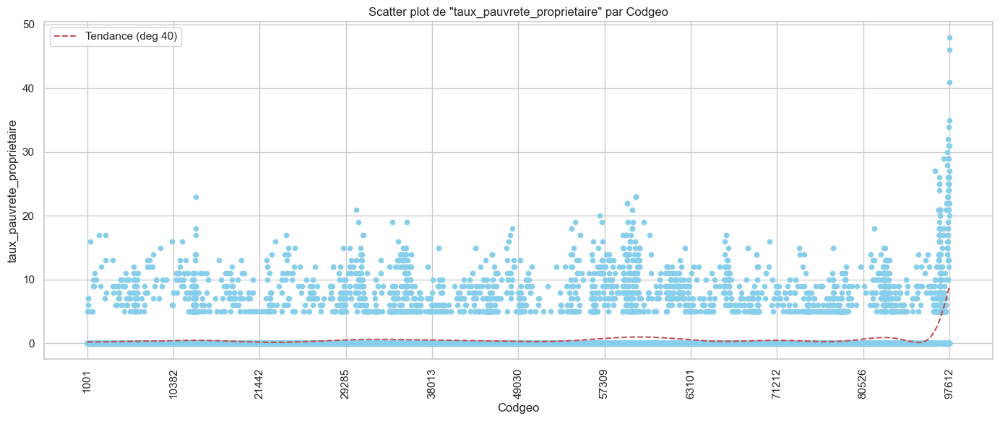

C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\573920334.py:21: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_valid, degree)


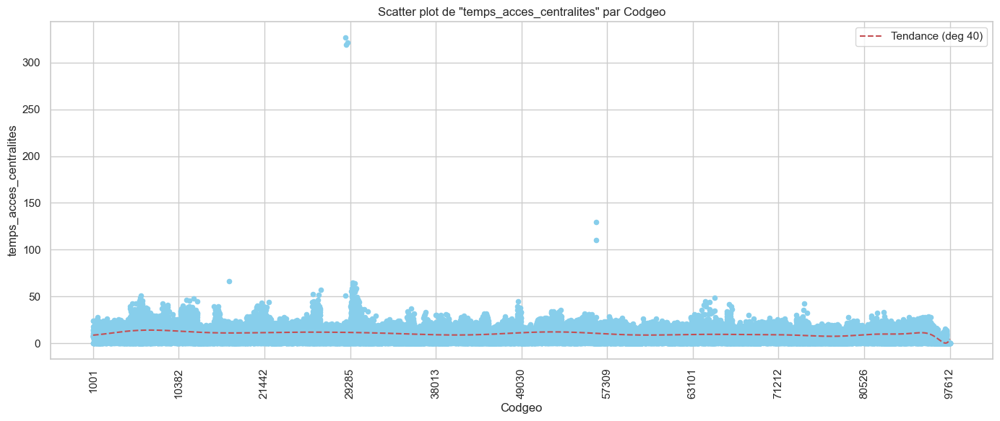

In [32]:
# Affichage des scatter plots pour chaque facteur

numeric_factors = factors[factors_to_plot].select_dtypes(include=[np.number]).columns

# Affichage des scatter plots uniquement pour les colonnes numériques
for factor in numeric_factors:
    plot_scatter_with_trendline(factors, factor)


In [40]:
def normalize_series(s):
    """Normalise une série pandas entre 0 et 1."""
    return (s - s.min()) / (s.max() - s.min())

def plot_normalized_trends_combined(factors, factors_to_plot, degree=40, num_labels=10):
    plt.figure(figsize=(16, 8))

    x_numeric = np.arange(len(factors))

    for factor in factors_to_plot:
        # Convertir en numérique et filtrer NaN
        y = pd.to_numeric(factors[factor], errors='coerce')
        valid_mask = ~y.isna()
        x_valid = x_numeric[valid_mask]
        y_valid = y[valid_mask]

        # Normaliser y_valid
        y_norm = normalize_series(y_valid)

        # Calcul polynôme tendance sur tous les points valides
        if len(x_valid) > degree:
            z = np.polyfit(x_valid, y_norm, degree)
            p = np.poly1d(z)
            plt.plot(x_valid, p(x_valid), linestyle='--', label=f"{factor} (tendance normalisée)")
        else:
            # Si pas assez de points pour degré élevé, plot juste y_norm
            plt.plot(x_valid, y_norm, linestyle='--', label=f"{factor} (norm)")

    # Limiter les labels codgeo affichés
    if len(x_numeric) > num_labels:
        step = len(x_numeric) // num_labels
        tick_positions = x_numeric[::step]
        tick_labels = factors['codgeo'].iloc[::step]
    else:
        tick_positions = x_numeric
        tick_labels = factors['codgeo']

    plt.xticks(ticks=tick_positions, labels=tick_labels, rotation=90, fontsize=8)
    plt.title('Courbes de Tendance Normalisées par Facteur (par Codgeo)')
    plt.xlabel('Codgeo')
    plt.ylabel('Valeur Normalisée')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
    plt.subplots_adjust(bottom=0.25)
    plt.tight_layout()
    plt.show()


C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\lib\_polynomial_impl.py:664: RuntimeWarning: overflow encountered in multiply
  scale = NX.sqrt((lhs*lhs).sum(axis=0))
C:\Users\u1052610\AppData\Local\miniconda\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\2468587978.py:28: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_norm, degree)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\2468587978.py:28: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_norm, degree)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\2468587978.py:28: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x_valid, y_norm, degree)
C:\Users\u1052610\AppData\Local\Temp\ipykernel_18464\2468587978.py:28: RankWarning: Polyfit may be poorly conditioned
  z = np.polyfit(x

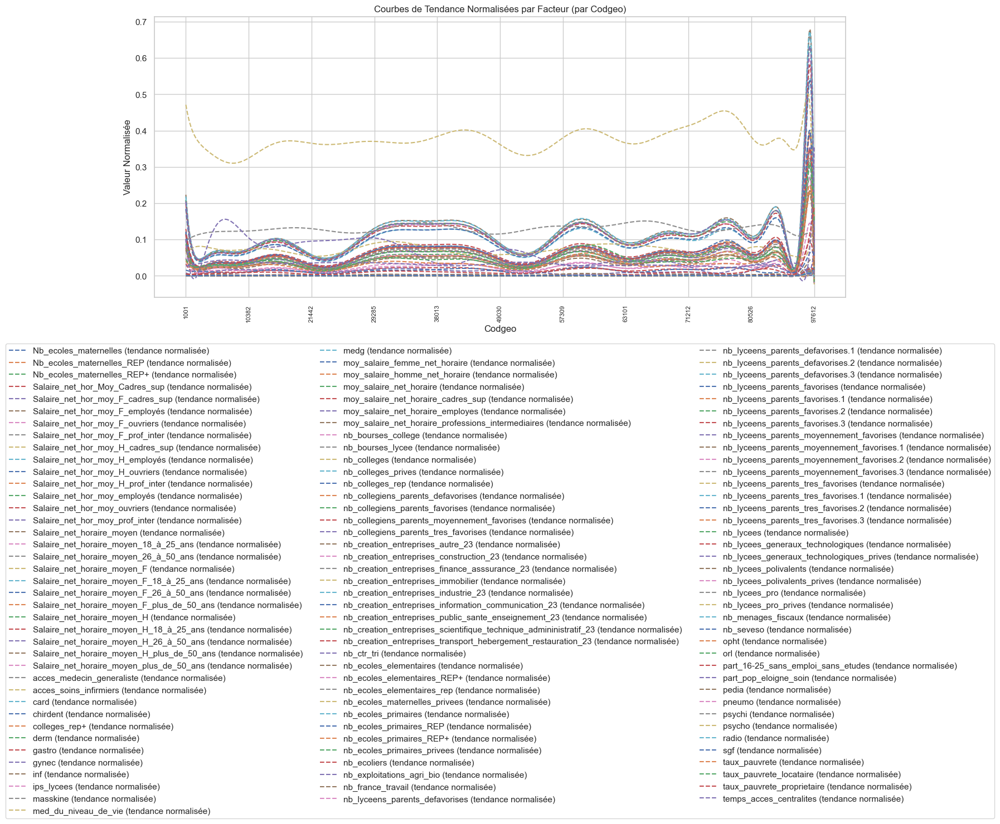

In [42]:
# Affichage des courbes de tendance normalisées
plot_normalized_trends(factors, factors_to_plot)


In [43]:
# Fonction pour calculer les corrélations entre les facteurs : SPEARMAN car var non continues

def calculate_correlations(factors_to_plot, factors_normalized, threshold=0.7):
    correlations = {}
    checked_pairs = set()
    
    for i, factor1 in enumerate(factors_to_plot):
        for j, factor2 in enumerate(factors_to_plot):
            if i < j:  # éviter les doublons
                pair = (factor1, factor2)
                if pair not in checked_pairs:
                    corr, _ = spearmanr(factors_normalized[factor1], factors_normalized[factor2])
                    if abs(corr) >= threshold:
                        correlations[f'{factor1} vs {factor2}'] = corr
                    checked_pairs.add(pair)
    return correlations



In [44]:
# Calcul
correlations = calculate_correlations(factors_to_plot, factors_normalized, threshold=0.8)

# Affichage
print("Corrélations fortes :\n")
for comparison, corr in correlations.items():
    print(f'{comparison}: coefficient de corrélation = {corr:.4f}')



Corrélations fortes :

Nb_ecoles_maternelles vs nb_bourses_college: coefficient de corrélation = 0.9153
Nb_ecoles_maternelles vs nb_colleges: coefficient de corrélation = 0.9606
Nb_ecoles_maternelles vs nb_collegiens_parents_defavorises: coefficient de corrélation = 0.9701
Nb_ecoles_maternelles vs nb_collegiens_parents_favorises: coefficient de corrélation = 0.9710
Nb_ecoles_maternelles vs nb_collegiens_parents_moyennement_favorises: coefficient de corrélation = 0.9700
Nb_ecoles_maternelles vs nb_collegiens_parents_tres_favorises: coefficient de corrélation = 0.9708
Nb_ecoles_maternelles vs nb_ecoles_elementaires: coefficient de corrélation = 0.9925
Nb_ecoles_maternelles vs nb_ecoles_primaires: coefficient de corrélation = 0.9142
Nb_ecoles_maternelles vs nb_ecoliers: coefficient de corrélation = 0.9785
Nb_ecoles_maternelles vs nb_lyceens_parents_defavorises: coefficient de corrélation = 0.9734
Nb_ecoles_maternelles vs nb_lyceens_parents_defavorises.1: coefficient de corrélation = 0.855

In [45]:
# Calcul des corrélations
correlations = calculate_correlations(factors_to_plot, factors_normalized, threshold=0.8)

# Conversion en DataFrame
correlation_matrix = pd.DataFrame.from_dict(correlations, orient='index', columns=['Coefficient de corrélation'])

# Affichage de la matrice
print("Matrice des corrélations fortes :\n")
correlation_matrix.head()


Matrice des corrélations fortes :



,Coefficient de corrélation
Nb_ecoles_maternelles vs nb_bourses_college,0.915330
Nb_ecoles_maternelles vs nb_colleges,0.960611
Nb_ecoles_maternelles vs nb_collegiens_parents_defavorises,0.970102
Nb_ecoles_maternelles vs nb_collegiens_parents_favorises,0.971023
Nb_ecoles_maternelles vs nb_collegiens_parents_moyennement_favorises,0.970029


In [14]:
from collections import defaultdict

# Groupes thématiques
education_cols = [
    'colleges_rep+', 'Nb_ecoles_maternelles', 'Nb_ecoles_maternelles_REP', 'Nb_ecoles_maternelles_REP+',
    'nb_colleges', 'nb_bourses_college', 'nb_bourses_lycee', 'nb_ecoles_elementaires', 'nb_ecoles_elementaires_REP+',
    'nb_ecoles_elementaires_rep', 'nb_ecoles_maternelles_privees', 'nb_ecoles_primaires',
    'nb_ecoles_primaires_REP', 'nb_ecoles_primaires_REP+', 'nb_ecoliers',
    'ips_lycees', 'nb_colleges_prives', 'nb_colleges_rep',
    'nb_lycees', 'nb_lycees_generaux_technologiques', 'nb_lycees_generaux_technologiques_prives',
    'nb_lycees_polivalents', 'nb_lycees_polivalents_prives', 'nb_lycees_pro', 'nb_lycees_pro_prives',
    'nb_ecoles_primaires_privees'
]

health_access_cols = [
    'acces_medecin_generaliste', 'acces_soins_infirmiers', 'sgf', 'gastro', 'gynec', 'opht', 'orl', 'psychi',
    'psycho', 'derm', 'pedia', 'radio', 'inf', 'masskine', 'medg', 'card', 'chirdent', 'pneumo'
]

salary_cols = [
    'moy_salaire_net_horaire'
]

poverty_cols = [
    'taux_pauvrete', 'taux_pauvrete_locataire', 'taux_pauvrete_proprietaire', 'part_pop_eloigne_soin',
    'part_16-25_sans_emploi_sans_etudes'
]

family_living_cols = [
    'med_du_niveau_de_vie', 'nb_collegiens_parents_defavorises', 'nb_collegiens_parents_favorises',
    'nb_collegiens_parents_moyennement_favorises', 'nb_collegiens_parents_tres_favorises',
    'nb_lyceens_parents_defavorises.1', 'nb_lyceens_parents_favorises.1',
    'nb_lyceens_parents_moyennement_favorises', 'nb_lyceens_parents_moyennement_favorises.1',
    'nb_lyceens_parents_tres_favorises', 'nb_lyceens_parents_tres_favorises.1',
    'nb_lyceens_parents_defavorises', 'nb_lyceens_parents_favorises', 'nb_menages_fiscaux'
]

business_creation_cols = [
    'nb_creation_entreprises_public_sante_enseignement_23', 'nb_creation_entreprises_scientifique_technique_admininistratif_23',
    'nb_creation_entreprises_autre_23', 'nb_creation_entreprises_construction_23',
    'nb_creation_entreprises_finance_asssurance_23', 'nb_creation_entreprises_immobilier',
    'nb_creation_entreprises_industrie_23', 'nb_creation_entreprises_information_communication_23',
    'nb_creation_entreprises_transport_hebergement_restauration_23', 'nb_exploitations_agri_bio', 'nb_france_travail'
]

schools_infra_cols = ['nb_ctr_tri', 'temps_acces_centralites']

industry_risk_cols = ['nb_seveso']

geo_cols = ['codgeo', 'libgeo','canton']

# Création du dictionnaire final des groupes
grouped_dfs = {
    'Education': factors[[col for col in education_cols if col in factors.columns]],
    'Sante_Acces': factors[[col for col in health_access_cols if col in factors.columns]],
    'Salaires_Emploi': factors[[col for col in salary_cols if col in factors.columns]],
    'Pauvrete_Aides': factors[[col for col in poverty_cols if col in factors.columns]],
    'Famille_Niveau_de_vie': factors[[col for col in family_living_cols if col in factors.columns]],
    'Creation_Entreprises': factors[[col for col in business_creation_cols if col in factors.columns]],
    'Infrastructures_Scolaires': factors[[col for col in schools_infra_cols if col in factors.columns]],
    'Risques_Industriels': factors[[col for col in industry_risk_cols if col in factors.columns]],
    'Infos_Geographiques': factors[[col for col in geo_cols if col in factors.columns]]
}

# Vérification des colonnes non assignées à un groupe
all_columns = set(factors.columns)
grouped_columns = set()
for df in grouped_dfs.values():
    grouped_columns.update(df.columns)

unassigned_columns = all_columns - grouped_columns

print("\n📌 Colonnes NON assignées à un groupe :")
for col in sorted(unassigned_columns):
    print("-", col)

# Vérification des doublons (colonnes présentes dans plusieurs groupes)
column_group_map = defaultdict(list)
for group_name, df in grouped_dfs.items():
    for col in df.columns:
        column_group_map[col].append(group_name)

print("\n🔁 Colonnes assignées à plusieurs groupes :")
for col, groups in column_group_map.items():
    if len(groups) > 1:
        print(f"- {col} : {groups}")



📌 Colonnes NON assignées à un groupe :
- Captage, traitement et distribution d'eau
- Collecte et traitement des eaux usées
- Complexe sportif
- Culture de plantes à épices, aromatiques, médicinales et pharmaceutiques
- Extraction de pétrole brut
- Fabrication de pesticides et d’autres produits agrochimiques
- Fabrication de produits pharmaceutiques de base
- Nb_habitants
- Piscine
- Production d'électricité
- Traitement et élimination des déchets dangereux
- Traitement et élimination des déchets non dangereux
- Transformation et conservation de la viande de boucherie
- Élaboration et transformation de matières nucléaires
- Élevage de porcins
- Élevage de vaches laitières
- Élevage de volailles

🔁 Colonnes assignées à plusieurs groupes :


📉 Pas assez de colonnes numériques dans le groupe : Education


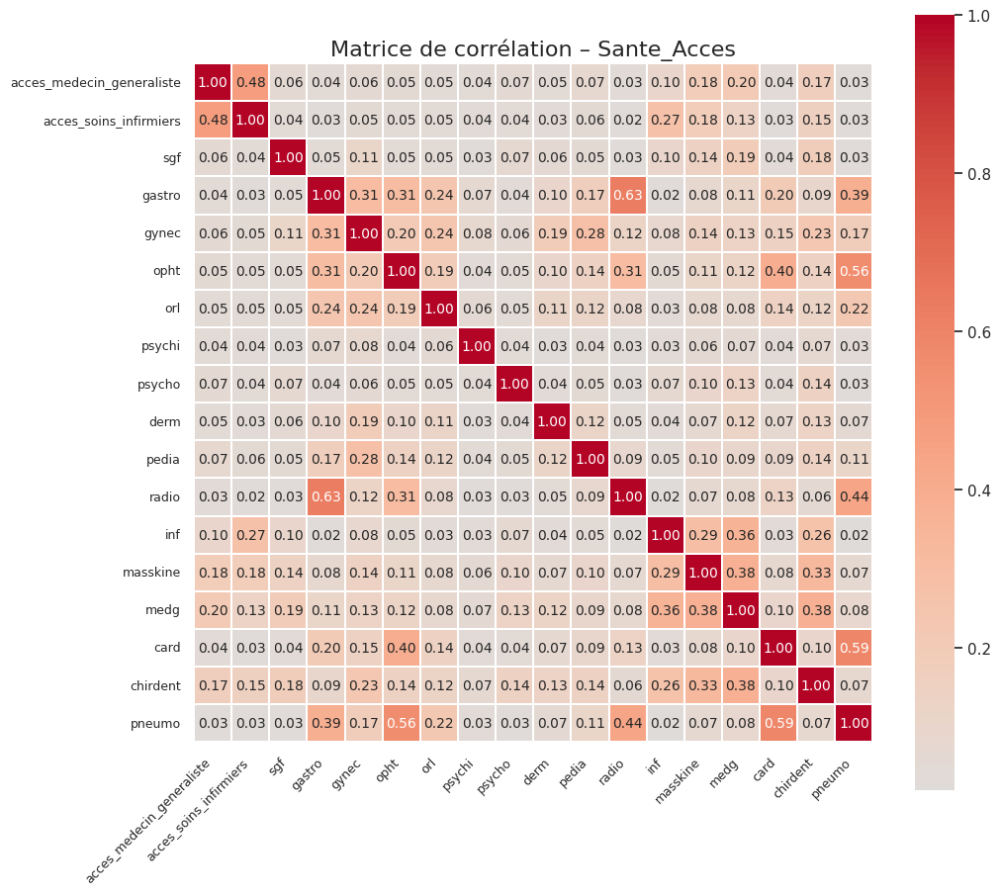

📉 Pas assez de colonnes numériques dans le groupe : Salaires_Emploi


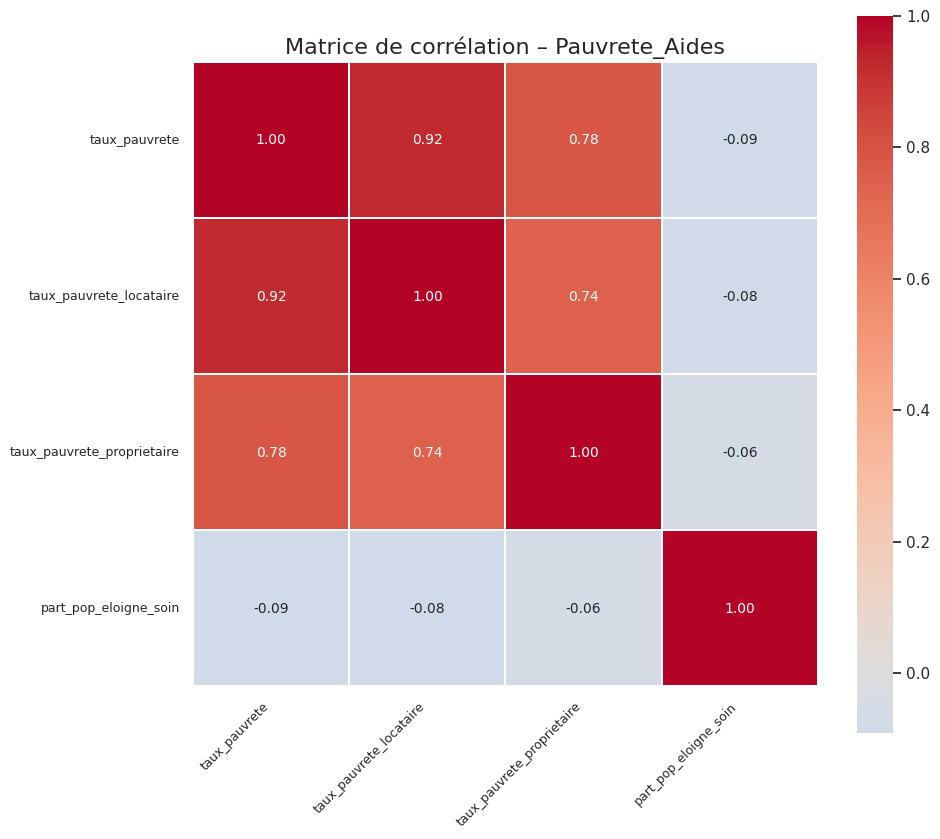

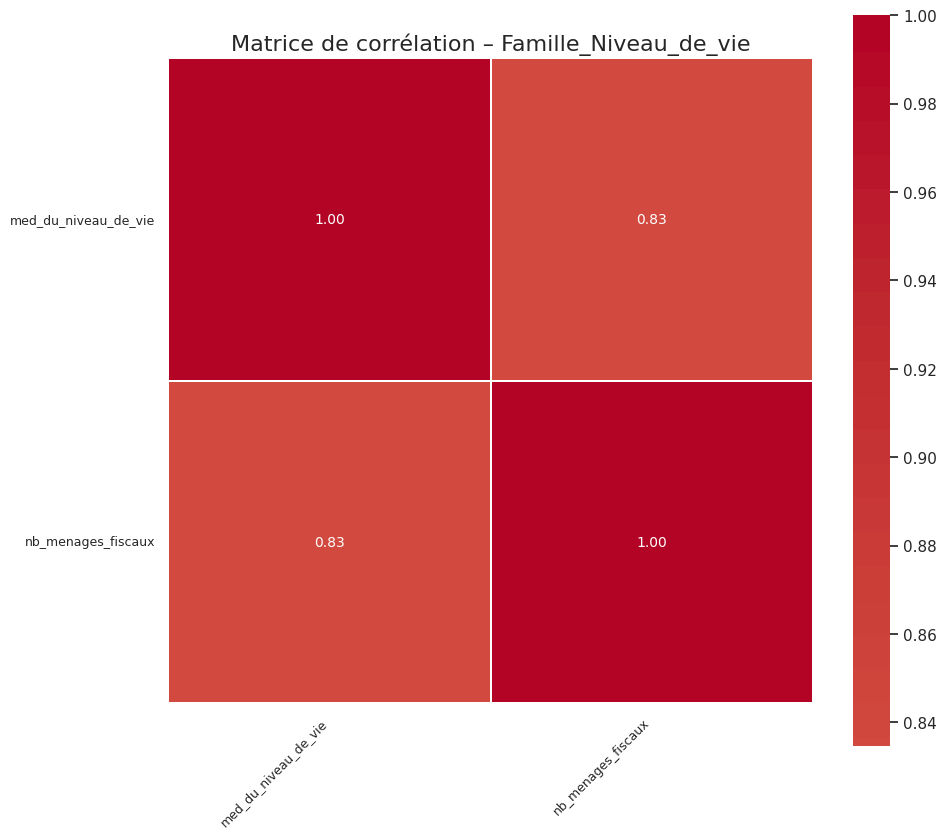

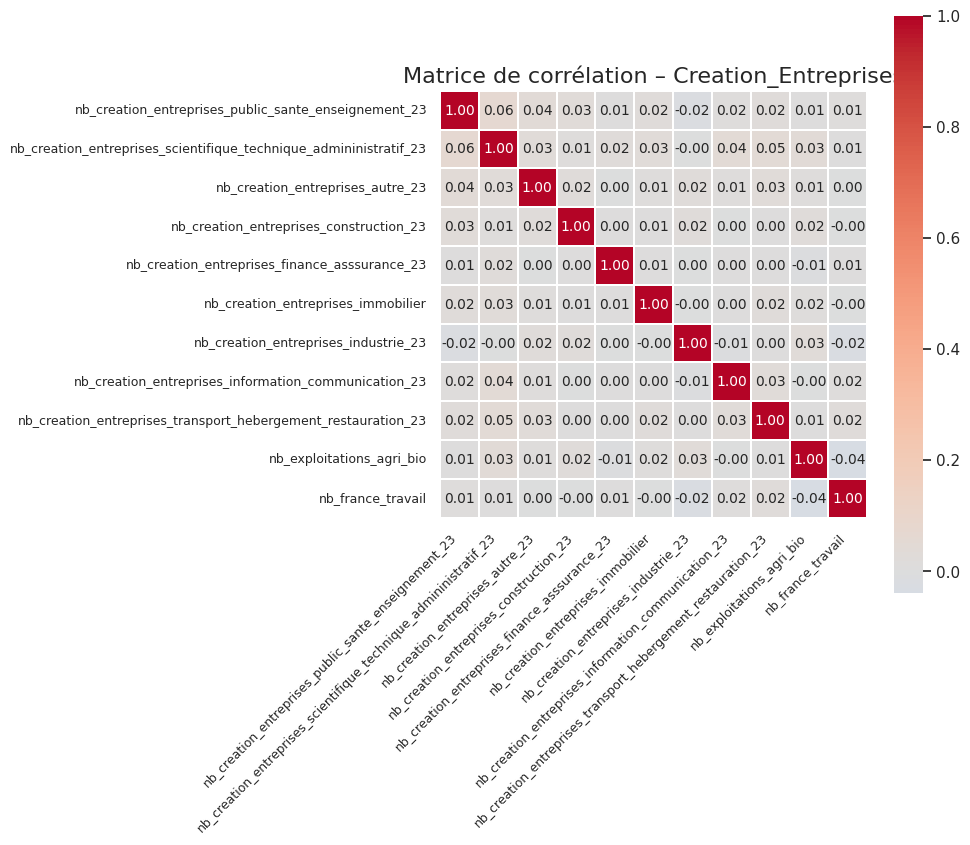

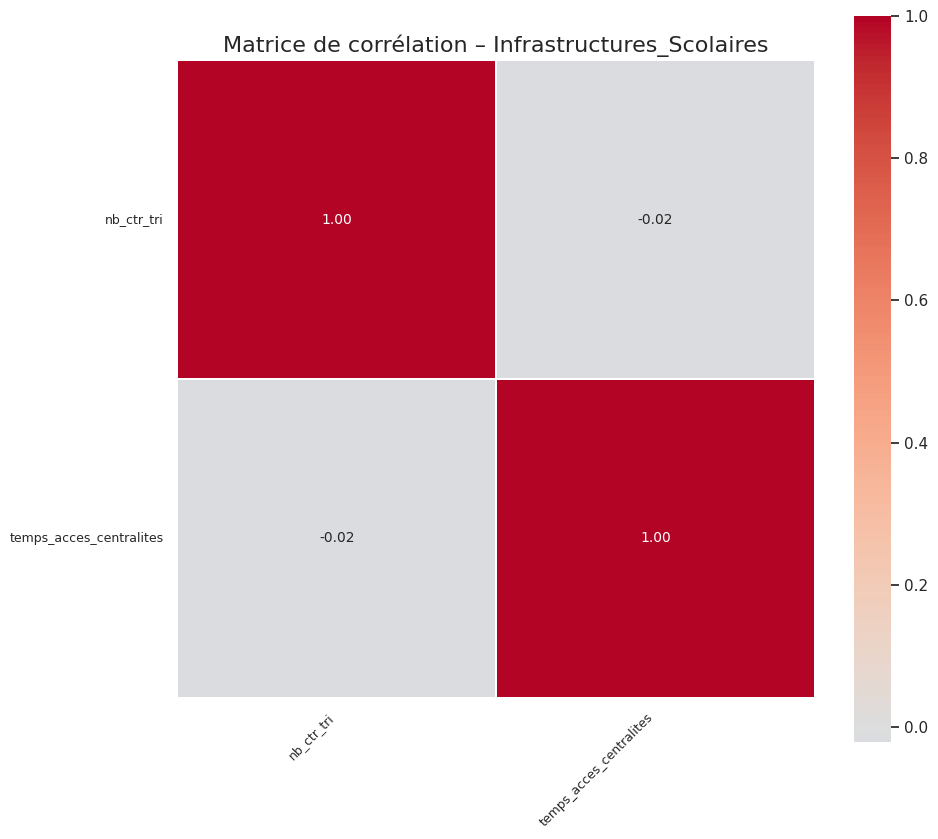

📉 Pas assez de colonnes numériques dans le groupe : Risques_Industriels
📉 Pas assez de colonnes numériques dans le groupe : Infos_Geographiques


In [13]:

sns.set(style="whitegrid")

for group_name, df_group in grouped_dfs.items():
    # Garde seulement les colonnes numériques
    df_group_numeric = df_group.select_dtypes(include='number')
    
    # Ignore les groupes avec moins de 2 colonnes numériques
    if df_group_numeric.shape[1] < 2:
        print(f"📉 Pas assez de colonnes numériques dans le groupe : {group_name}")
        continue

    # Calcul de la matrice de corrélation
    corr = df_group_numeric.corr()

    # Taille dynamique de la figure
    n_vars = len(corr.columns)
    figsize = max(10, n_vars * 0.6)

    plt.figure(figsize=(figsize, figsize))
    sns.heatmap(
        corr,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        square=True,
        linewidths=0.3,
        cbar_kws={"shrink": 0.8}, 
        annot_kws={"size": min(10, max(5, 200 // n_vars))}
    )
    plt.title(f"Matrice de corrélation – {group_name}", fontsize=16)
    plt.xticks(rotation=45, ha="right", fontsize=9)
    plt.yticks(rotation=0, fontsize=9)
    plt.tight_layout()
    plt.show()


In [15]:
# Ajouter 'codgeo' et 'libgeo' à chaque df en str
factors['codgeo'] = factors['codgeo'].astype(str).str.zfill(5)
factors['canton'] = factors['canton'].astype(str).str.zfill(4)
factors['libgeo'] = factors['libgeo'].astype(str)

for group_name, df_group in grouped_dfs.items():
    df_group = df_group.copy()
    df_group['codgeo'] = factors['codgeo'].values
    df_group['libgeo'] = factors['libgeo'].values
    df_group['canton'] = factors['canton'].values
    grouped_dfs[group_name] = df_group

# Créer un dictionnaire pour stocker les scores
group_scores = {}

for group_name, df_group in grouped_dfs.items():
    # Ne garder que les colonnes numériques
    numeric_df = df_group.select_dtypes(include='number')

    # Calculer la moyenne ligne par ligne en ignorant les NaN
    score = numeric_df.mean(axis=1)

    # Stocker le score dans le dictionnaire
    group_scores[f"{group_name}_score"] = score

# Ajouter les scores au DataFrame factors
for score_name, score_values in group_scores.items():
    factors[score_name] = score_values

# Construire le DataFrame final avec uniquement codgeo, libgeo et les scores
score_cols = [col for col in factors.columns if col.endswith('_score')]
final_df = factors[['codgeo', 'libgeo','canton'] + score_cols]

factors_by_cat = final_df.drop(columns='Infos_Geographiques_score') #suppression des score codgeo impossibles

# Afficher un aperçu
print(factors_by_cat.head())


  codgeo                   libgeo canton  Education_score  Sante_Acces_score  \
0  01001  L'Abergement-Clémenciat  108.0             0.00           6.850067   
1  01002    L'Abergement-de-Varey  101.0             0.00           6.177986   
2  01004        Ambérieu-en-Bugey  101.0           110.16          11.745058   
3  01005      Ambérieux-en-Dombes  122.0             0.00           8.316930   
4  01006                  Ambléon  104.0             0.00           2.655556   

   Salaires_Emploi_score  Pauvrete_Aides_score  Famille_Niveau_de_vie_score  \
0                0.00000                  0.00                 12910.207933   
1                0.00000                  0.00                 12240.215356   
2               15.31244                 12.25                 10830.230746   
3                0.00000                  0.00                 12305.210859   
4                0.00000                  0.00                 12105.225664   

   Creation_Entreprises_score  Infrastructur

In [17]:
exclude_cols = ['codgeo', 'libgeo','canton']

factors_qual_cat = factors_by_cat.copy()

numeric_cols = [
    col for col in factors_qual_cat.columns
    if col not in exclude_cols and pd.api.types.is_numeric_dtype(factors_qual_cat[col])
]

# Transformation des colonnes numériques
for col in numeric_cols:
    q1 = factors_qual_cat[col].quantile(0.25)
    q2 = factors_qual_cat[col].quantile(0.50)
    q3 = factors_qual_cat[col].quantile(0.75)

    def classify(val):
        if pd.isna(val):
            return None
        elif val == 0:
            return 0
        elif val <= q1:
            return 1
        elif val <= q2:
            return 2
        elif val <= q3:
            return 3
        else:
            return 4

    factors_qual_cat[col] = factors_qual_cat[col].apply(classify)


In [18]:
factors_qual_cat.to_csv("factors_by_cat.csv", index=False)

In [ ]:
# ACP
# le principe : 
#Réduire le nombre de variables tout en conservant un maximum d’information.
#Identifier les axes principaux de variation dans les données.
#Visualiser des données complexes dans un espace à 2 ou 3 dimensions.

C:\Users\u1052610\AppData\Local\Temp\ipykernel_21476\2464006674.py:9: DtypeWarning: Columns (0,1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("factors_for_visualization.csv")


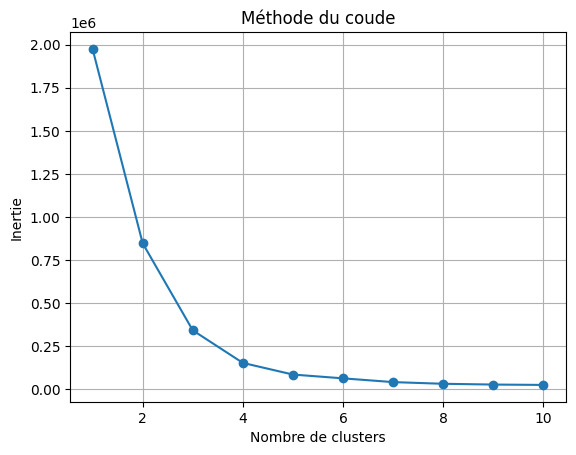

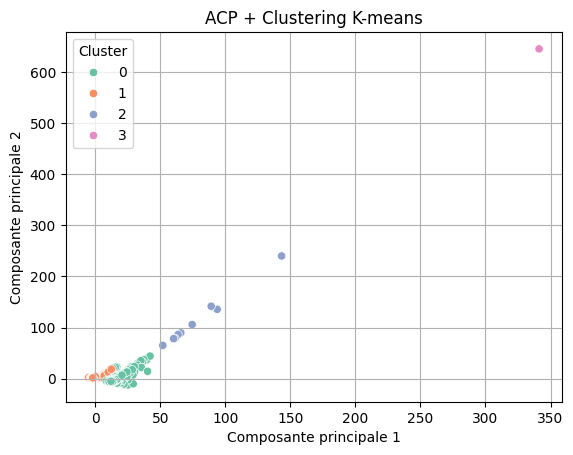

In [1]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Chargement des données
df = pd.read_csv("factors_for_visualization.csv")

# Suppression des colonnes non numériques
df_numeric = df.drop(columns=['canton', 'codgeo', 'libgeo'], errors='ignore')
df_numeric = df_numeric.dropna()

# Standardisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_numeric)

# ACP sur 2 composantes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Méthode du coude
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia, marker='o')
plt.title("Méthode du coude")
plt.xlabel("Nombre de clusters")
plt.ylabel("Inertie")
plt.grid(True)
plt.show()

# Clustering avec k=4
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_pca)

# Visualisation
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Cluster'] = clusters

sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Cluster', palette='Set2')
plt.title("ACP + Clustering K-means")
plt.xlabel("Composante principale 1")
plt.ylabel("Composante principale 2")
plt.grid(True)
plt.show()


In [ ]:
# Clustering
# le principe :